In [1]:
import numpy as np
import csv
import itertools
from itertools import groupby
import networkx as nx
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# search method

In [2]:
def is_subset(super_set, sub_set):
    if str(sub_set) == "φ":
        return True
    return set(sub_set).issubset(set(super_set)) and set(super_set) != set(sub_set)


# Breadth-first Search strategy
def bfs_subkey(key, data_dic):
    sub_column = []
    sub_ratio_purning = {}
    check_list = []

    for r in range(len(key), 0, -1):
        subsets_t1 = list(itertools.combinations(key, r))
        ll = []
        for subkey in subsets_t1:
            sratio = data_dic[subkey][0]
            flag = any(is_subset(check_key, subkey) for check_key in check_list)
            if not flag:
                ll.append(subkey)
                sub_ratio_purning[subkey] = sratio
                if sratio < 0.95:
                    check_list.append(subkey)
        sub_column.append(ll)
    
    return sub_column, sub_ratio_purning


# Brute-force search strategy
def normal_subkey(key, data_dic):
    sub_column = []
    sub_ratio = {}

    # Generate a subset from length 1 to the length of key
    for r in range(1, len(key) + 1):
        subsets_t1 = list(itertools.combinations(key, r))
        sub_column.append(subsets_t1)

    # Reverse the order of sub_column to ensure that the largest length subset starts first
    sub_column = sub_column[::-1]
    
    # Store subsets and corresponding unique ratios
    for sublist in sub_column:
        for subkey in sublist:
            sub_ratio[subkey] = data_dic[subkey][0]
    
    sub_column.append([('φ')])
    sub_ratio[('φ')] = 0
    
    return sub_column, sub_ratio

# Depth-first Search strategy
def dfs_subkey(key, data_dic):
    columns, data = normal_subkey(key, data_dic)
    start_node = max(data.keys(), key=len)
    stack = [start_node]
    visited = set()
    result = []

    while stack:
        current_node = stack.pop()
        if current_node in visited:
            continue
        visited.add(current_node)
        current_value = data.get(current_node, None)

        if current_value is None:
            continue

        if current_value < 0.95:
            result.append(current_node)
            continue

        result.append(current_node)

        for i in range(len(current_node)):
            child_node = current_node[:i] + current_node[i+1:]
            if child_node not in visited:
                stack.append(child_node)

    result.sort(key=len, reverse=True)
    
    
    sub_ratio = {}
    for i in result:
        sub_ratio[i] = data_dic[i][0]
        
    print("sub_ratio: ", sub_ratio)
            
    # grouped_sorted_data = [
    #     sorted(list(group), key=lambda x: sub_ratio[x], reverse=True)
    #     for _, group in itertools.groupby(result, key=len)
    # ]
    
    grouped_data = [list(group) for key, group in groupby(result, key=len)]
    
    print("grouped_sorted_data: ", grouped_data)
            
    return grouped_data, sub_ratio

    

# draw graph method

In [3]:
def draw_vertical_lattice(data, node_spacing=None, node_size=3000, font_size=20, unique_ratios=None):
    G = nx.DiGraph()

    # Dynamic adjustment of spacing and font size based on data size
    if node_spacing is None:
        node_spacing = 1.5 + 0.5 * (len(data) / 5)
    if font_size is None:
        # font_size = max(9, 12 - len(data) // 5)
        font_size = max(16, 18 - len(data) // 5)

    if unique_ratios is None:
        unique_ratios = {node: idx * 0.1 + 0.1 for idx, level in enumerate(data) for node in level}

    # Flatten the list of tuples to unique elements with unique properties
    unique_nodes = {node: {'unique_ratio': unique_ratios[node]} for idx, level in enumerate(data) for node in level}


    # Define the positions
    max_width = max(len(level) for level in data)
    for level_idx, level in enumerate(data):
        # print("level_idx: ", level_idx, "level: ", level)
        for node_idx, sol_node in enumerate(level):
            # print("node_idx: ", node_idx, "sol_node: ", sol_node)
            unique_nodes[sol_node]['pos'] = ((node_idx - len(level) / 2) * node_spacing, -level_idx)


    # Add nodes with attributes
    for node, attrs in unique_nodes.items():
        label = ',\n'.join(map(str, node)) if isinstance(node, tuple) else str(node)
        label += f"\n({attrs['unique_ratio']:.4f})"
        G.add_node(node, pos=attrs['pos'], label=label)

    # Add edges based on subset relation
    for level_idx in range(len(data) - 1):
        for node in data[level_idx]:
            for sub_node in data[level_idx + 1]:
                if is_subset(node, sub_node):
                    G.add_edge(node, sub_node)
    
    # Update global font settings
    plt.rcParams.update({
        'font.size': font_size,       # General font size
        'axes.titlesize': font_size, # Title font size
        'xtick.labelsize': font_size,
        'ytick.labelsize': font_size
    })
    
    # Draw the graph
    plt.figure(figsize=(16, 12))  # Increase figure size
    pos = nx.get_node_attributes(G, 'pos')
    labels = nx.get_node_attributes(G, 'label')
    nx.draw(G, pos, labels=labels, with_labels=True, node_size=node_size, node_color='skyblue', font_size=font_size,
            font_weight='bold', arrows=True)
    # plt.title(f'Sub-key Graph: {data[0]}')
    plt.show()

# Drawing functions
def draw_vertical_lattice_purning(sub_column, node_spacing=2, node_size=3000, font_size=20, unique_ratios=None):
    G = nx.DiGraph()

    # Dynamically adjust node spacing and font size
    if unique_ratios is None:
        unique_ratios = {node: idx * 0.1 + 0.1 for idx, level in enumerate(sub_column) for node in level}

    # Flatten the list of nodes and construct unique_nodes
    unique_nodes = {node: {'unique_ratio': unique_ratios[node]} for level in sub_column for node in level}

    # Define node positions
    max_width = max(len(level) for level in sub_column)
    for level_idx, level in enumerate(sub_column):
        for node_idx, sol_node in enumerate(level):
            unique_nodes[sol_node]['pos'] = ((node_idx - len(level) / 2) * node_spacing, -level_idx)

    # Adding nodes and attributes
    for node, attrs in unique_nodes.items():
        label = ',\n'.join([''.join(map(str, attr)) for attr in set(node)]) if isinstance(node, tuple) else str(node)
        label += f"\n({attrs['unique_ratio']:.4f})"
        G.add_node(node, pos=attrs['pos'], label=label)

    # Connecting Nodes
    def connect_to_first_parent(node, current_level_idx):
        for parent_level_idx in range(current_level_idx - 1, -1, -1):
            for parent_node in sub_column[parent_level_idx]:
                if is_subset(parent_node, node) and unique_ratios[parent_node] > 0.95:
                    G.add_edge(parent_node, node)
                    return

    # Add Edge
    for level_idx in range(1, len(sub_column)):
        for node in sub_column[level_idx]:
            connect_to_first_parent(node, level_idx)
            
            

    # Drawing a shape
    plt.figure(figsize=(16, 10))
    pos = nx.get_node_attributes(G, 'pos')
    labels = nx.get_node_attributes(G, 'label')
    nx.draw(G, pos, labels=labels, with_labels=True, node_size=node_size, node_color='skyblue', font_size=font_size, font_weight='bold', arrows=True)
    # plt.title(f'Sub-key Graph: {sub_column[0]}')
    plt.show()


# Compute time and draw plot graph method

In [4]:
def compute_time(sub_ratio, data_dic):
    time_dic = {}
    for key, value in sub_ratio.items():
        key_length = len(key)
        if key_length not in time_dic:
            time_dic[key_length] = []
        t = 0
        for key2, value2 in sub_ratio.items():
            if set(key2).issubset(key) and key2 != 'φ':
                t += data_dic[key2][1]
        t = round(t, 6)
        time_dic[key_length].append(t)
    return time_dic
    
# Define the exponential function
def exp_func(x, a, b):
    return a * np.exp(b * x)

# Calculating the R-squared function
def calculate_r_squared(y_true, y_pred):
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - np.mean(y_true)) ** 2)
    r_squared = 1 - (ss_res / ss_tot)
    return r_squared
    
def plot_with_exponential_fit(time_normal, time_bfs, time_dfs):
    print(time_normal)
    keys_time_normal = sorted(time_normal.keys())
    keys_time_bfs = sorted(time_bfs.keys())
    keys_time_dfs = sorted(time_dfs.keys())
    
    # # Calculate the average value of each key
    averages_time_normal = [time_normal[k1] for k1 in keys_time_normal]
    averages_time_bfs = [time_bfs[k2] for k2 in keys_time_bfs]
    averages_time_dfs = [time_dfs[k3] for k3 in keys_time_dfs]

    # Exponential fit of three data sets
    popt1, _ = curve_fit(exp_func, keys_time_normal, averages_time_normal, maxfev=10000)
    popt2, _ = curve_fit(exp_func, keys_time_bfs, averages_time_bfs, maxfev=10000)
    popt3, _ = curve_fit(exp_func, keys_time_dfs, averages_time_dfs, maxfev=10000)

    # Generate more points to smooth the curve
    x_smooth1 = np.linspace(min(keys_time_normal), max(keys_time_normal), 100)
    y_smooth1 = exp_func(x_smooth1, *popt1)

    x_smooth2 = np.linspace(min(keys_time_bfs), max(keys_time_bfs), 100)
    y_smooth2 = exp_func(x_smooth2, *popt2)

    x_smooth3 = np.linspace(min(keys_time_dfs), max(keys_time_dfs), 100)
    y_smooth3 = exp_func(x_smooth3, *popt3)

    # Calculating R-squared
    y_fit1 = exp_func(np.array(keys_time_normal), *popt1)
    r_squared1 = calculate_r_squared(np.array(averages_time_normal), y_fit1)

    y_fit2 = exp_func(np.array(keys_time_bfs), *popt2)
    r_squared2 = calculate_r_squared(np.array(averages_time_bfs), y_fit2)

    y_fit3 = exp_func(np.array(keys_time_dfs), *popt3)
    r_squared3 = calculate_r_squared(np.array(averages_time_dfs), y_fit3)

    # Draw the original line chart
    plt.figure(figsize=(12, 6))
    plt.grid(True)
    plt.plot(keys_time_normal, averages_time_normal, 'o-', label=f"Avg time (R²={r_squared1:.4f})", color='b')
    plt.plot(keys_time_bfs, averages_time_bfs, 'o-', label=f"Avg with BFS (R²={r_squared2:.4f})", color='g')
    plt.plot(keys_time_dfs, averages_time_dfs, 'o-', label=f"Avg with DFS (R²={r_squared3:.4f})", color='r')

    # Plotting an exponential fit curve
    plt.plot(x_smooth1, y_smooth1, 'b--', label=f"Exp fit (normal): {popt1[0]:.4f}e^({popt1[1]:.4f}x)")
    plt.plot(x_smooth2, y_smooth2, 'g--', label=f"Exp fit (bfs): {popt2[0]:.4f}e^({popt2[1]:.4f}x)")
    plt.plot(x_smooth3, y_smooth3, 'r--', label=f"Exp fit (dfs): {popt3[0]:.4f}e^({popt3[1]:.4f}x)")

    # Add value labels to points
    for i, (x, y1) in enumerate(zip(keys_time_normal, averages_time_normal)):
        plt.text(x, y1, f'{y1:.4f}', fontsize=14, color='blue', verticalalignment='bottom', horizontalalignment='right')

    for i, (x, y2) in enumerate(zip(keys_time_bfs, averages_time_bfs)):
        plt.text(x, y2, f'{y2:.4f}', fontsize=14, color='green', verticalalignment='top', horizontalalignment='left')

    for i, (x, y3) in enumerate(zip(keys_time_dfs, averages_time_dfs)):
        plt.text(x, y3, f'{y3:.4f}', fontsize=14, color='red', verticalalignment='top', horizontalalignment='right')

    # Legend and other settings
    plt.xlabel('Key Length', fontsize=16)
    plt.ylabel('Average Running Time', fontsize=16)
    plt.title('Running Time for Sub-Key Analysis (Exponential Fit)', fontsize=18)
    plt.tick_params(axis='both', which='major', labelsize=14)
    plt.legend(fontsize=14)
    plt.show()


# Main

In [5]:
# Main function: read data and call different exploration strategies
def main(csv_file_path, near_key_list):
    data_list = []
    data_dic = {}

    # Reading CSV Files
    with open(csv_file_path, mode='r') as file:
        reader = csv.reader(file)
        for row in reader:
            data_list.append(row)
    data_list.pop(0)
    for data in data_list:
        column = tuple(data[0].split(', '))
        data_dic[column] = [float(data[1]), float(data[3]), float(data[2])] # Convert the last three columns to float and store them in the dictionary

    # print(data_dic)
    total_nt = []
    total_bt = []
    total_dt = []
    for key, value in data_dic.items():
        if key in near_key_list:
            print(f"\nCurrent column set: {key}, Completeness Ratio: {value[2]}")

            
            # normal method
            print("Normal subkey graph")
            sub_column, sub_ratio = normal_subkey(key, data_dic)
            normal_time = compute_time(sub_ratio, data_dic)
            draw_vertical_lattice(sub_column, node_spacing=2, node_size=10000, font_size=24, unique_ratios=sub_ratio)
            
            # breadth first method
            print("BFS subkey graph")
            sub_column_bfs, sub_ratio_bfs = bfs_subkey(key, data_dic)
            bfs_time = compute_time(sub_ratio_bfs, data_dic)
            draw_vertical_lattice_purning(sub_column_bfs, node_spacing=2, node_size=10000, font_size=24, unique_ratios=sub_ratio_bfs)
            
            # deep first method
            print("DFS subkey graph")
            sub_column_dfs, sub_ratio_dfs = dfs_subkey(key, data_dic)
            dfs_time = compute_time(sub_ratio_dfs, data_dic)
            draw_vertical_lattice_purning(sub_column_dfs, node_spacing=2, node_size=10000, font_size=24, unique_ratios=sub_ratio_dfs)
            
            # print("normal_time: ", normal_time)
            # print(bfs_time)
            # print(dfs_time)
            
            avg_normal_time = {key: sum(values) / len(values) for key, values in normal_time.items()}
            avg_bfs_time = {key: sum(values) / len(values) for key, values in bfs_time.items()}
            avg_dfs_time = {key: sum(values) / len(values) for key, values in dfs_time.items()}
            plot_with_exponential_fit(avg_normal_time, avg_bfs_time, avg_dfs_time)
            total_nt.append(avg_normal_time)
            total_bt.append(avg_bfs_time)
            total_dt.append(avg_dfs_time)
            

# Specialisation Analysis


Current column set: ('Type', 'Code'), Completeness Ratio: 1.0
Normal subkey graph


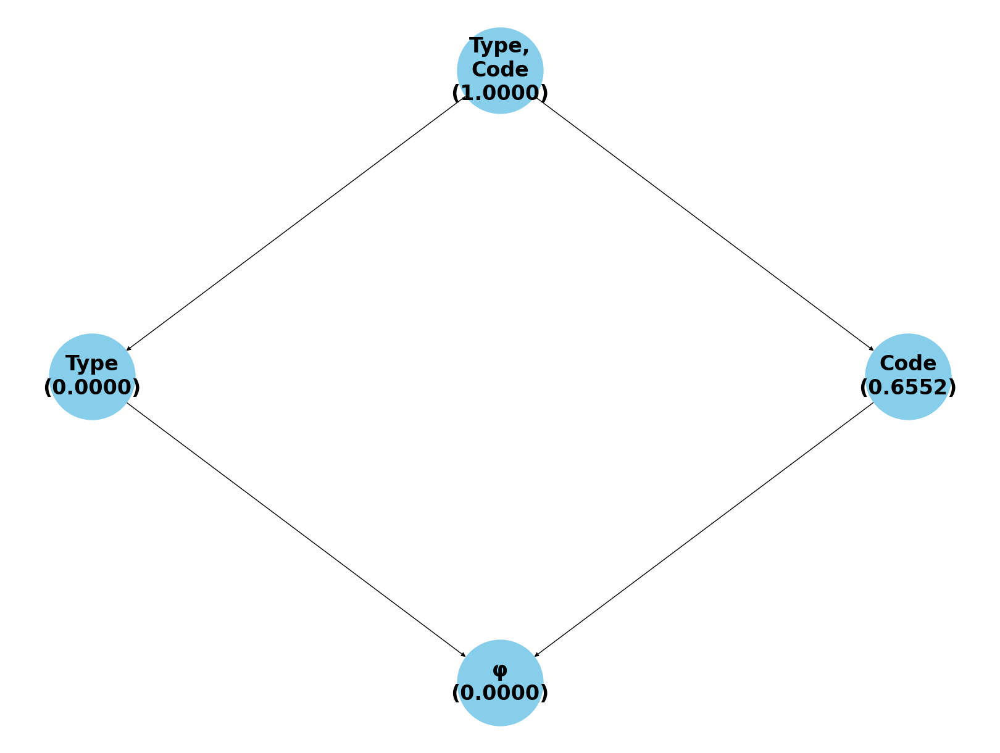

BFS subkey graph


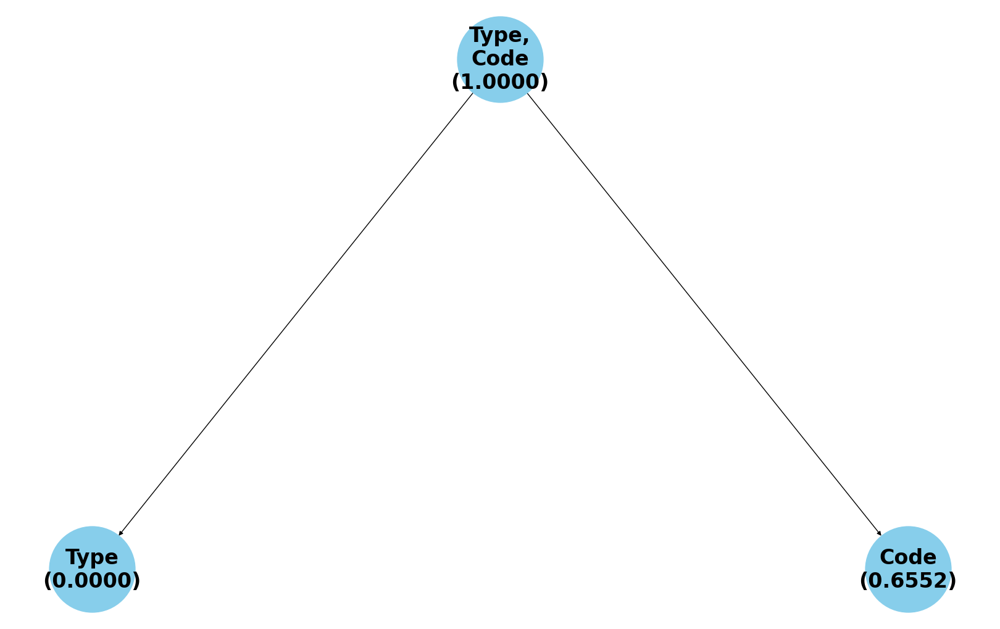

DFS subkey graph
{('Type', 'Code'): 1.0, ('Type',): 0.0, ('Code',): 0.6552, 'φ': 0}
sub_ratio:  {('Type', 'Code'): 1.0, ('Type',): 0.0, ('Code',): 0.6552}
grouped_sorted_data:  [[('Type', 'Code')], [('Type',), ('Code',)]]


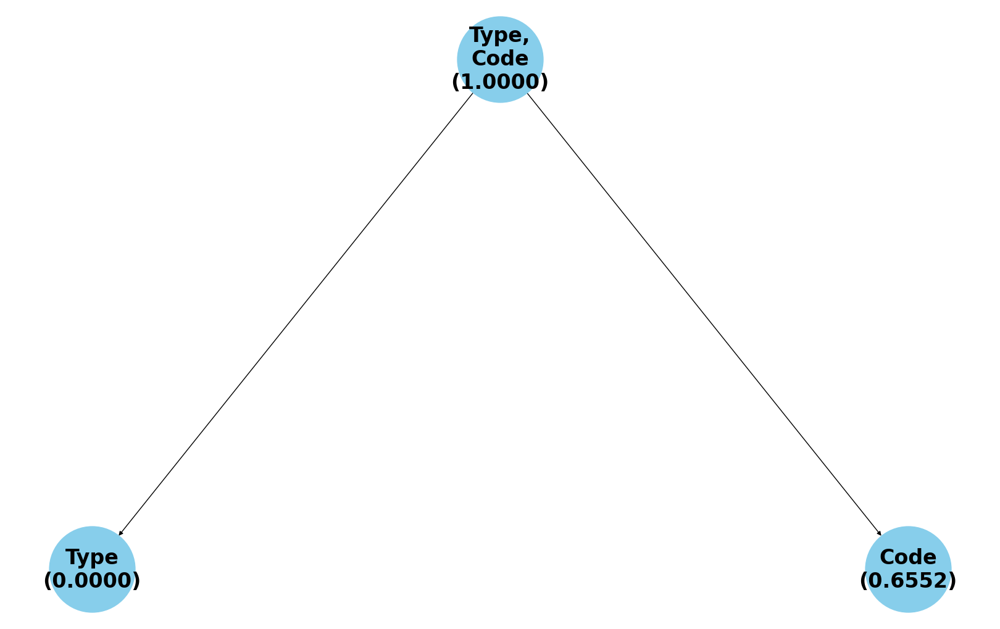

{2: 0.011, 1: 0.0033333333333333327}


/opt/anaconda3/envs/python38/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


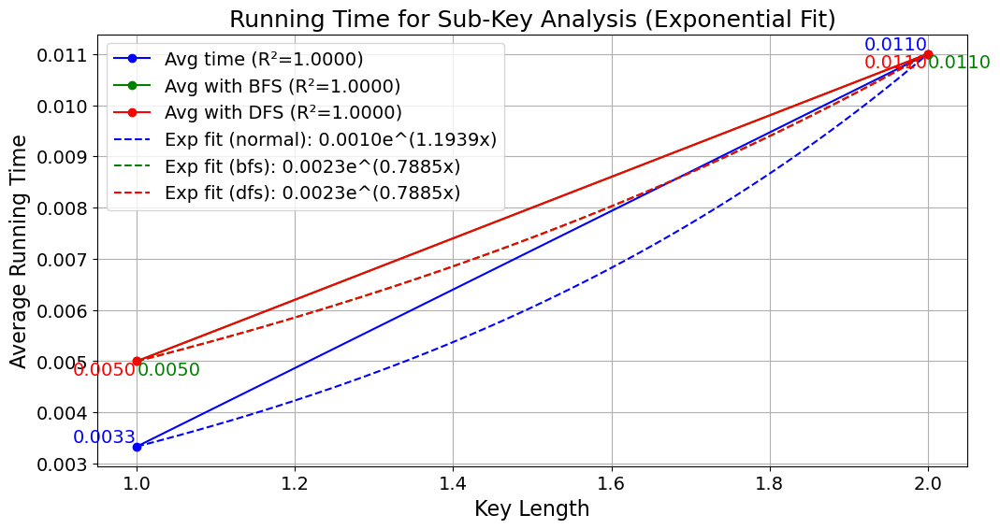

In [6]:
# abbrev
near_key_list=[
    ('Type', 'Code')
]
main('runTime_data/Abbrev_data.csv', near_key_list)


Current column set: ('coachID', 'year'), Completeness Ratio: 1.0
Normal subkey graph


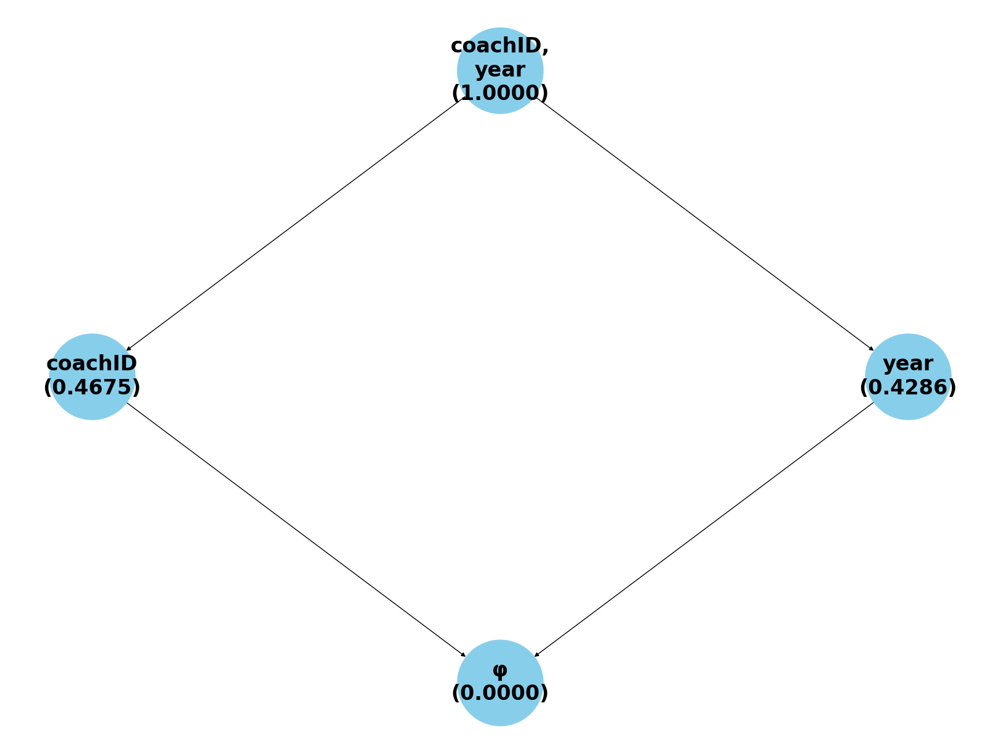

BFS subkey graph


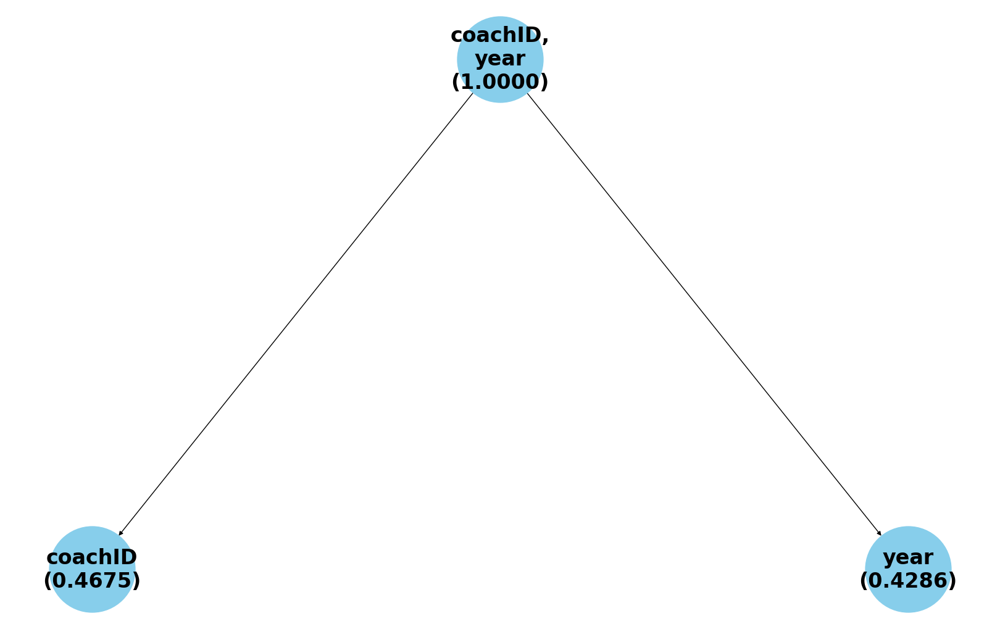

DFS subkey graph
{('coachID', 'year'): 1.0, ('coachID',): 0.4675, ('year',): 0.4286, 'φ': 0}
sub_ratio:  {('coachID', 'year'): 1.0, ('coachID',): 0.4675, ('year',): 0.4286}
grouped_sorted_data:  [[('coachID', 'year')], [('coachID',), ('year',)]]


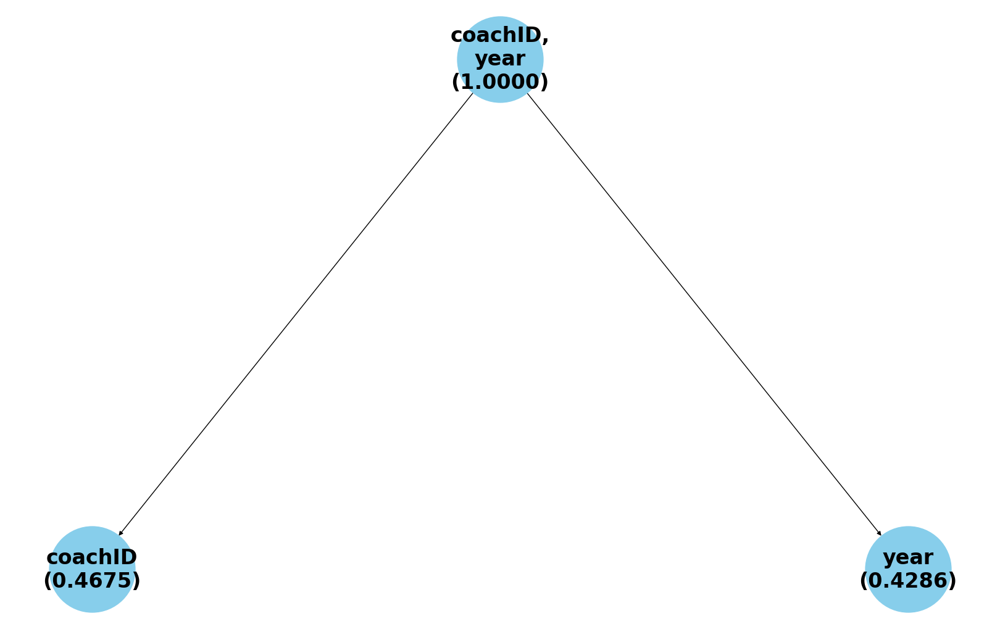

{2: 0.002, 1: 0.0003333333333333333}


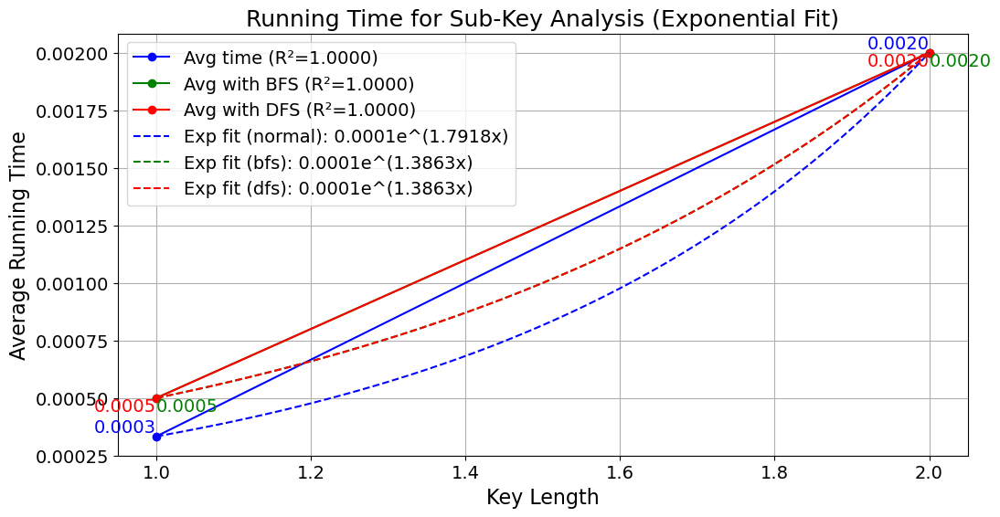


Current column set: ('award', 'year'), Completeness Ratio: 1.0
Normal subkey graph


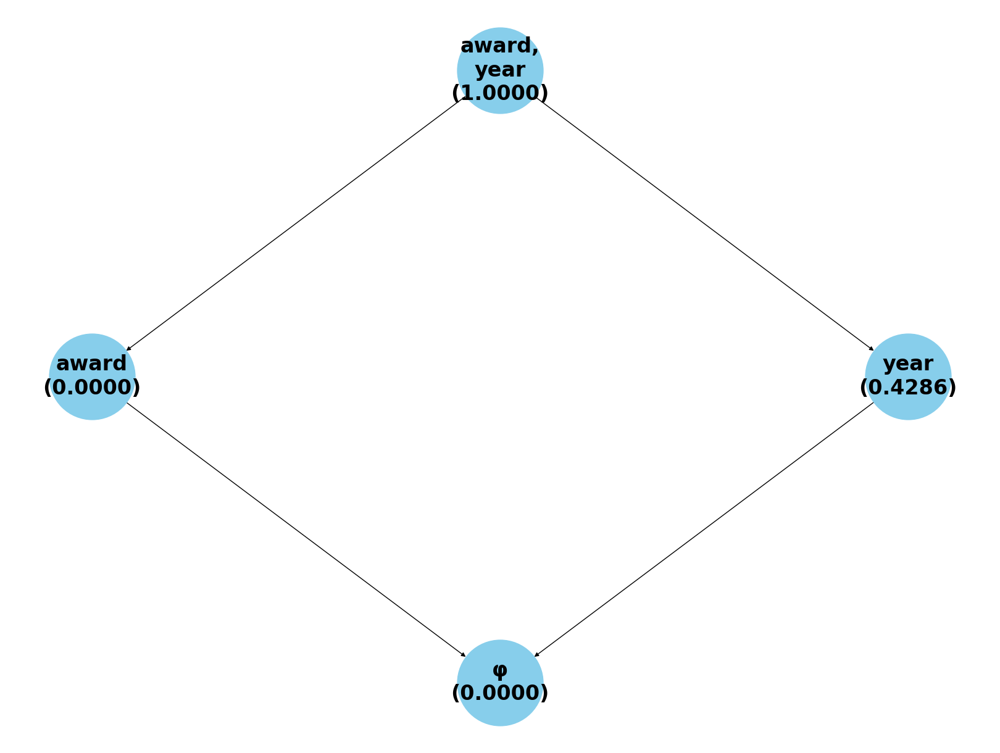

BFS subkey graph


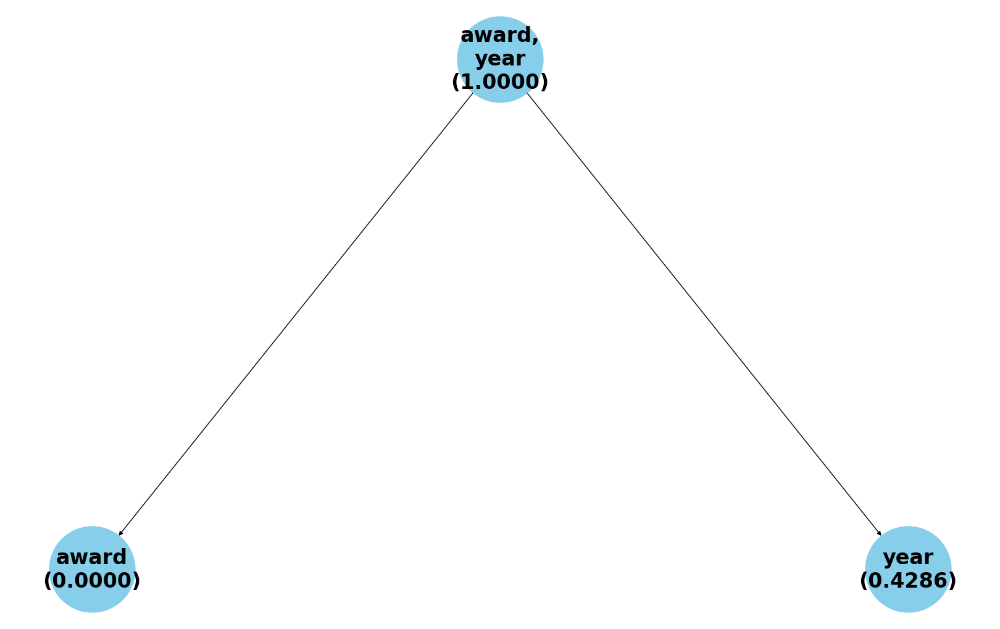

DFS subkey graph
{('award', 'year'): 1.0, ('award',): 0.0, ('year',): 0.4286, 'φ': 0}
sub_ratio:  {('award', 'year'): 1.0, ('award',): 0.0, ('year',): 0.4286}
grouped_sorted_data:  [[('award', 'year')], [('award',), ('year',)]]


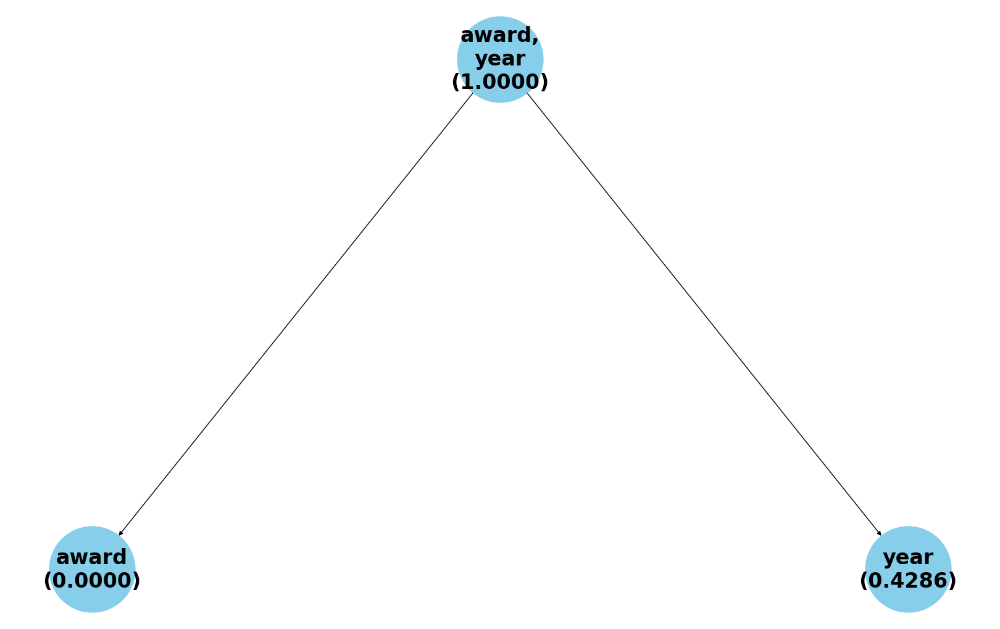

{2: 0.003, 1: 0.0006666666666666666}


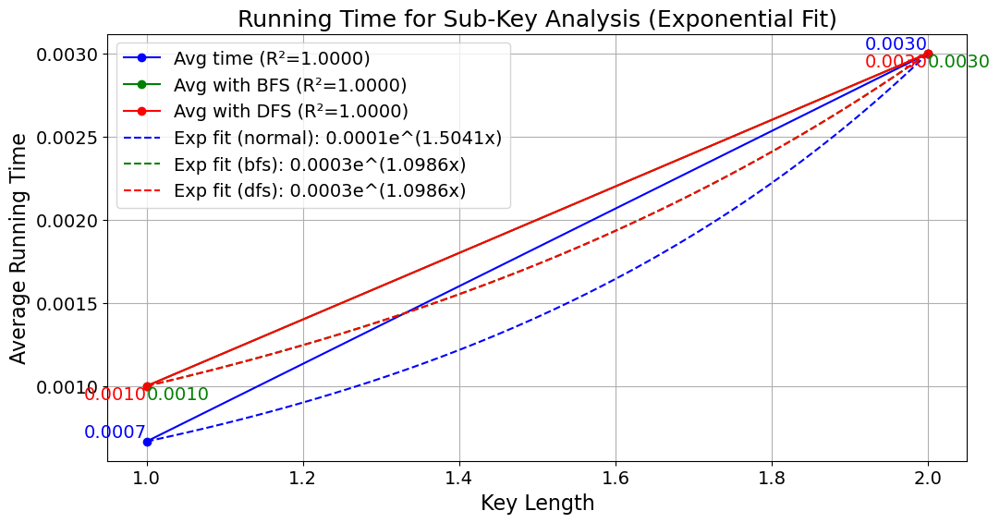

In [7]:
# AwardsCoaches
near_key_list=[
    ('coachID','year'),
    ('award','year')
]
main('runTime_data/AwardsCoaches_data.csv', near_key_list)


Current column set: ('playerID', 'award', 'year'), Completeness Ratio: 1.0
Normal subkey graph


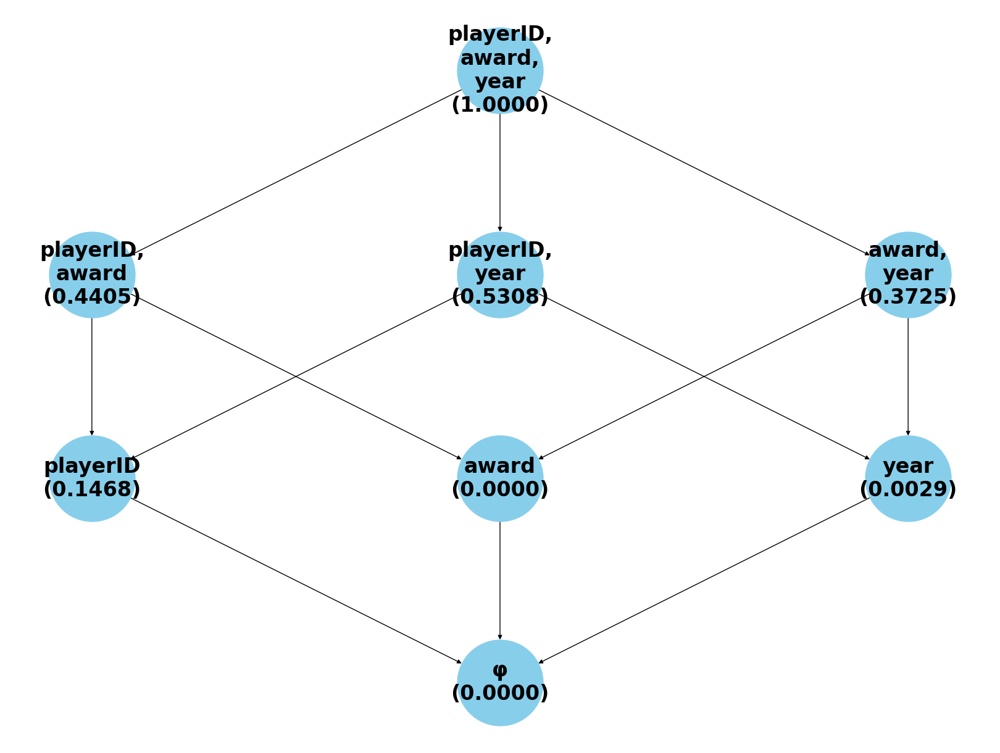

BFS subkey graph


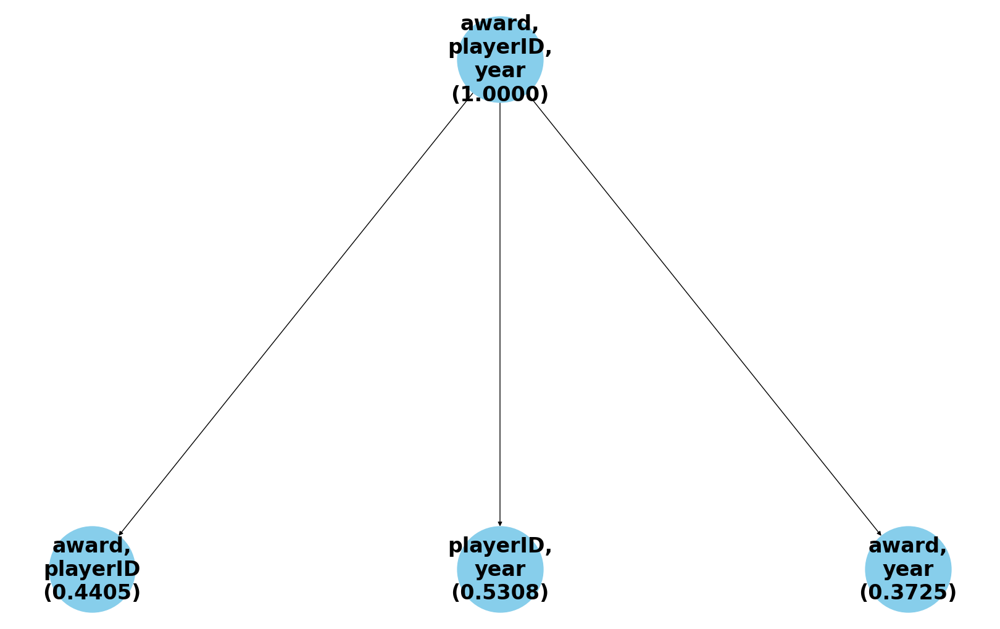

DFS subkey graph
{('playerID', 'award', 'year'): 1.0, ('playerID', 'award'): 0.4405, ('playerID', 'year'): 0.5308, ('award', 'year'): 0.3725, ('playerID',): 0.1468, ('award',): 0.0, ('year',): 0.0029, 'φ': 0}
sub_ratio:  {('playerID', 'award', 'year'): 1.0, ('playerID', 'award'): 0.4405, ('playerID', 'year'): 0.5308, ('award', 'year'): 0.3725}
grouped_sorted_data:  [[('playerID', 'award', 'year')], [('playerID', 'award'), ('playerID', 'year'), ('award', 'year')]]


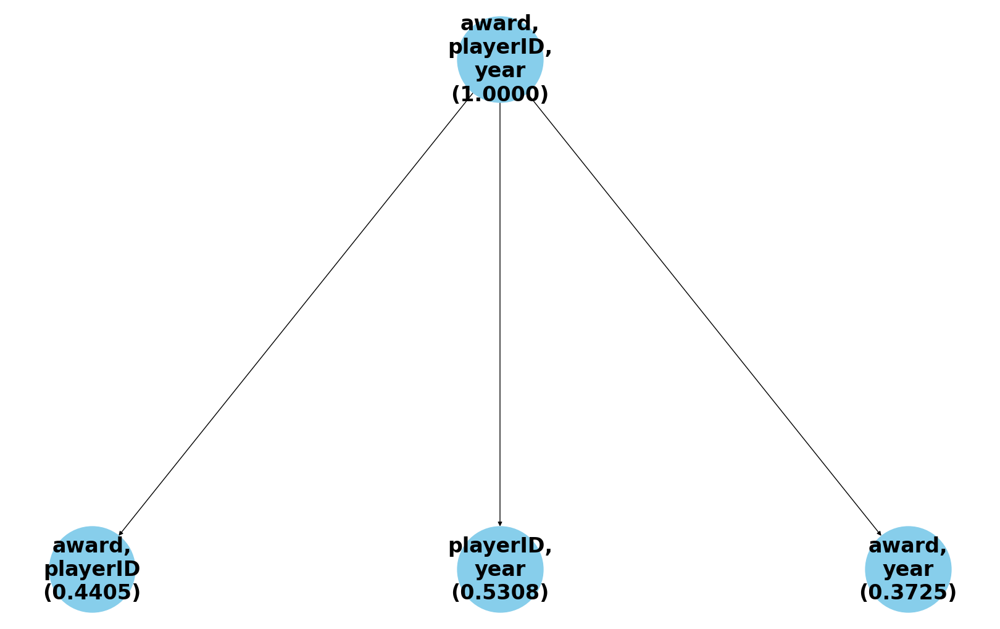

{3: 0.019, 2: 0.008333333333333333, 1: 0.002}


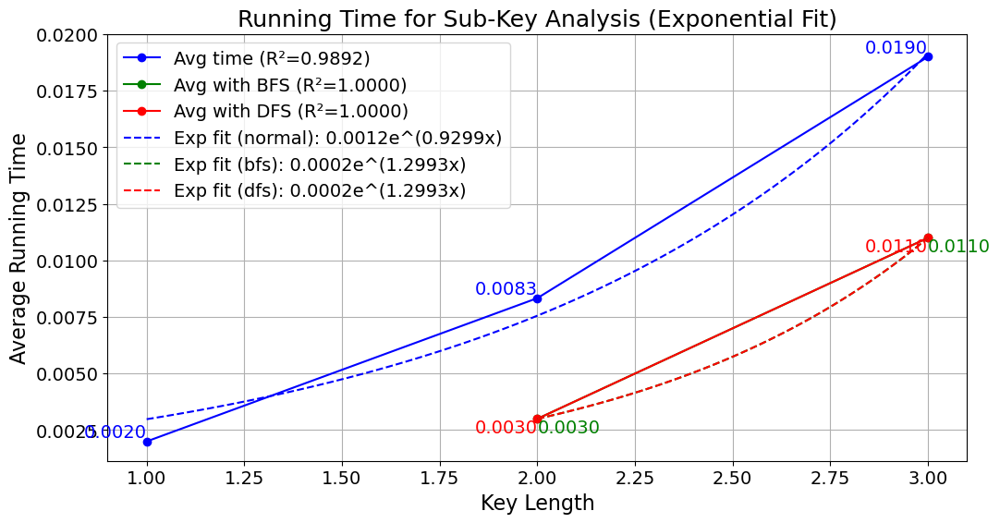

In [8]:
# AwardsPlayers
near_key_list=[
    ('playerID', 'award', 'year')
]
main('runTime_data/AwardsPlayers_data.csv', near_key_list)


Current column set: ('coachID', 'year', 'stint'), Completeness Ratio: 1.0
Normal subkey graph


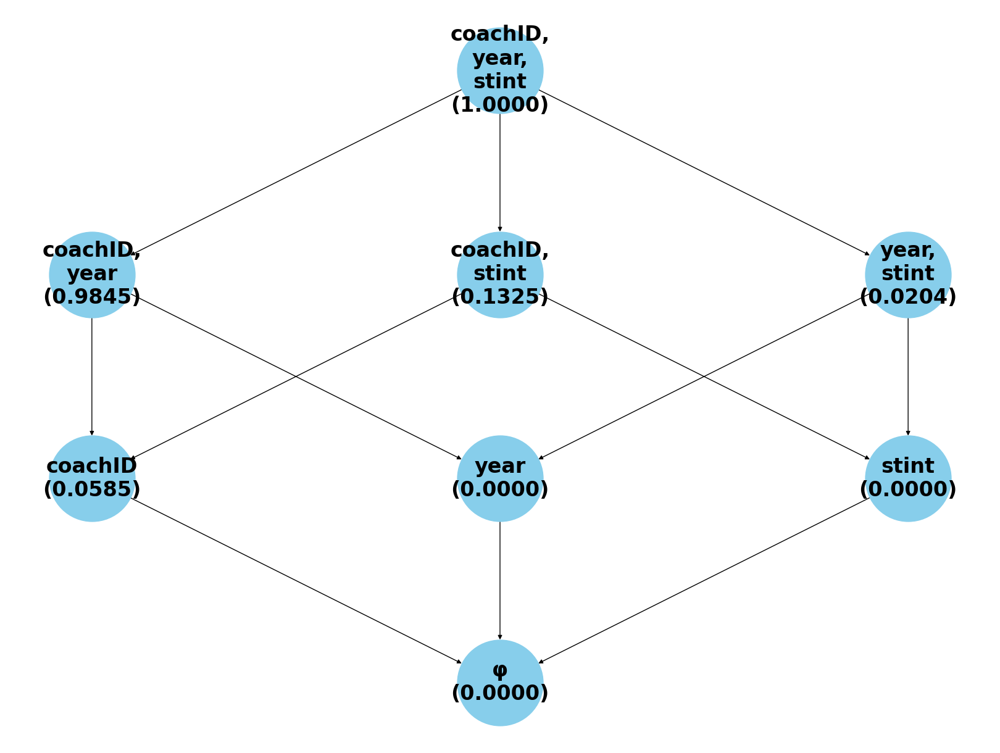

BFS subkey graph


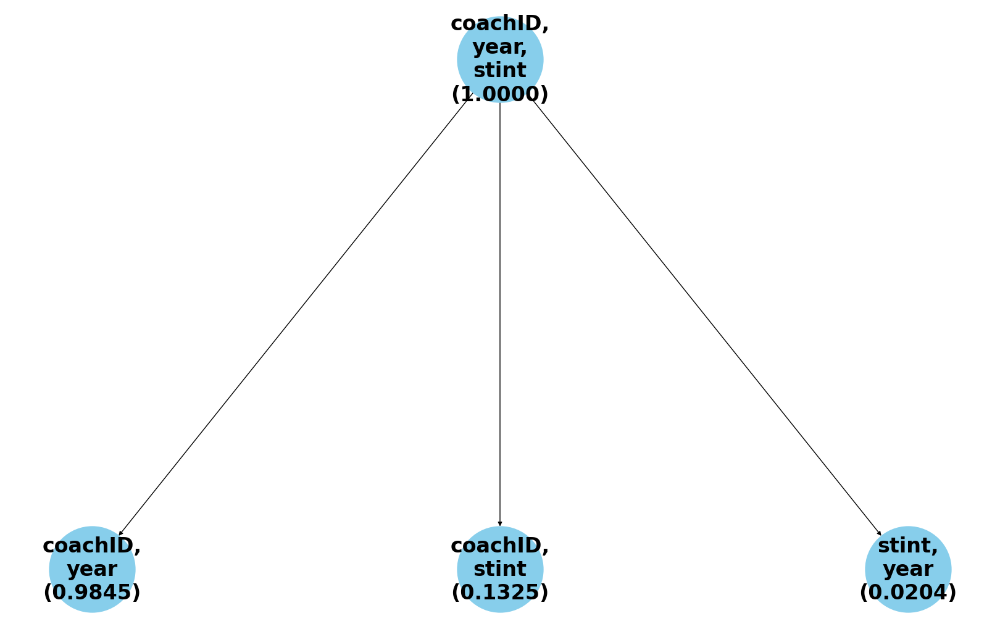

DFS subkey graph
{('coachID', 'year', 'stint'): 1.0, ('coachID', 'year'): 0.9845, ('coachID', 'stint'): 0.1325, ('year', 'stint'): 0.0204, ('coachID',): 0.0585, ('year',): 0.0, ('stint',): 0.0, 'φ': 0}
sub_ratio:  {('coachID', 'year', 'stint'): 1.0, ('coachID', 'year'): 0.9845, ('coachID', 'stint'): 0.1325, ('year', 'stint'): 0.0204, ('coachID',): 0.0585, ('year',): 0.0}
grouped_sorted_data:  [[('coachID', 'year', 'stint')], [('coachID', 'year'), ('coachID', 'stint'), ('year', 'stint')], [('coachID',), ('year',)]]


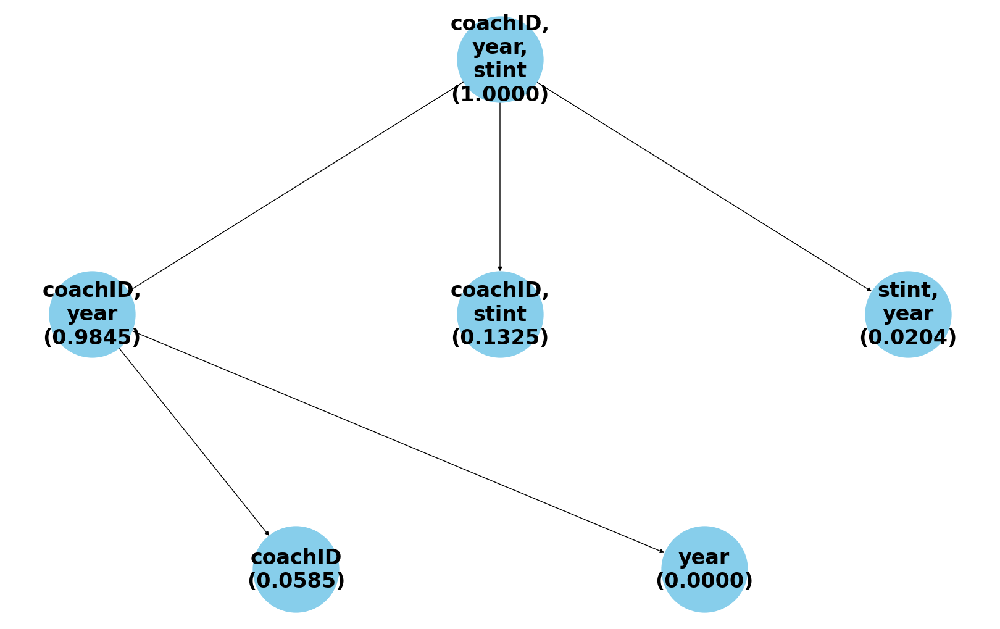

{3: 0.011, 2: 0.0036666666666666666, 1: 0.00075}


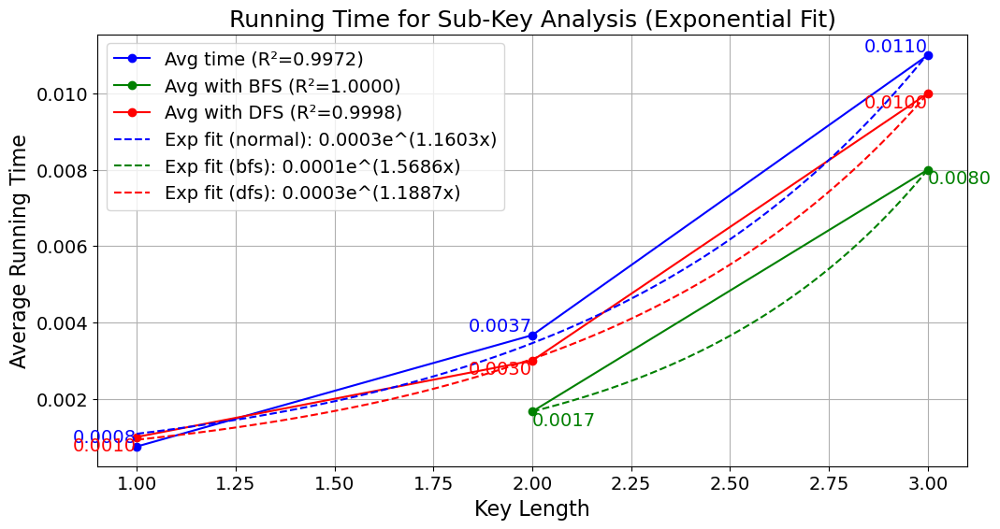

In [29]:
# Coaches
near_key_list=[
    ('coachID', 'year', 'stint')
]
main('runTime_data/Coaches_data.csv', near_key_list)


Current column set: ('month', 'tmID', 'oppID'), Completeness Ratio: 1.0
Normal subkey graph


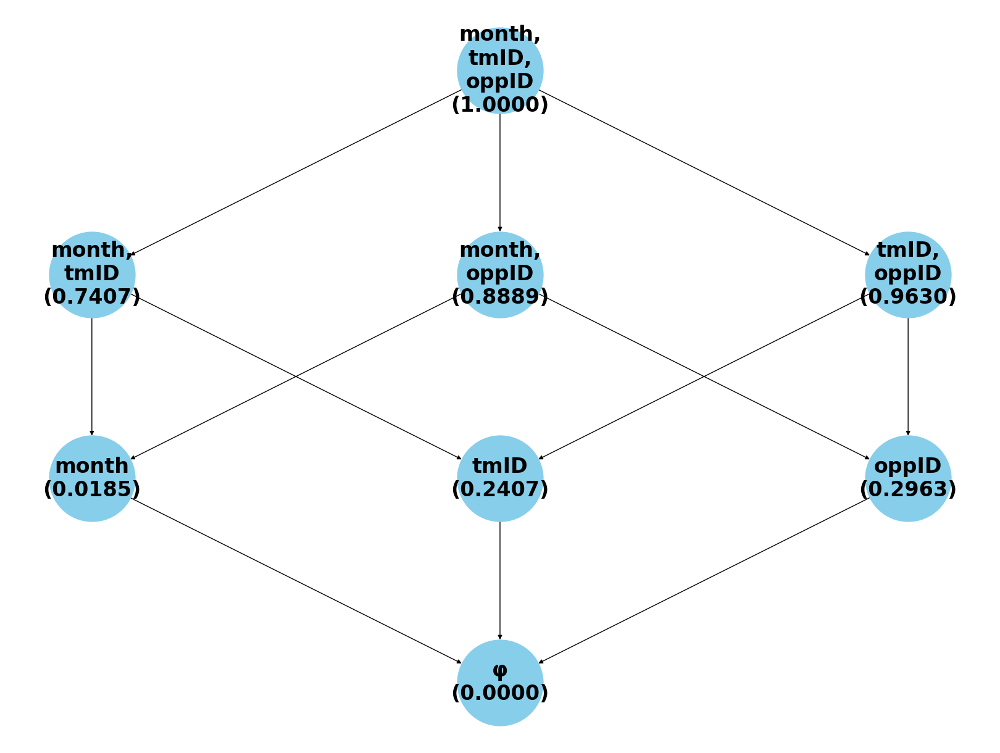

BFS subkey graph


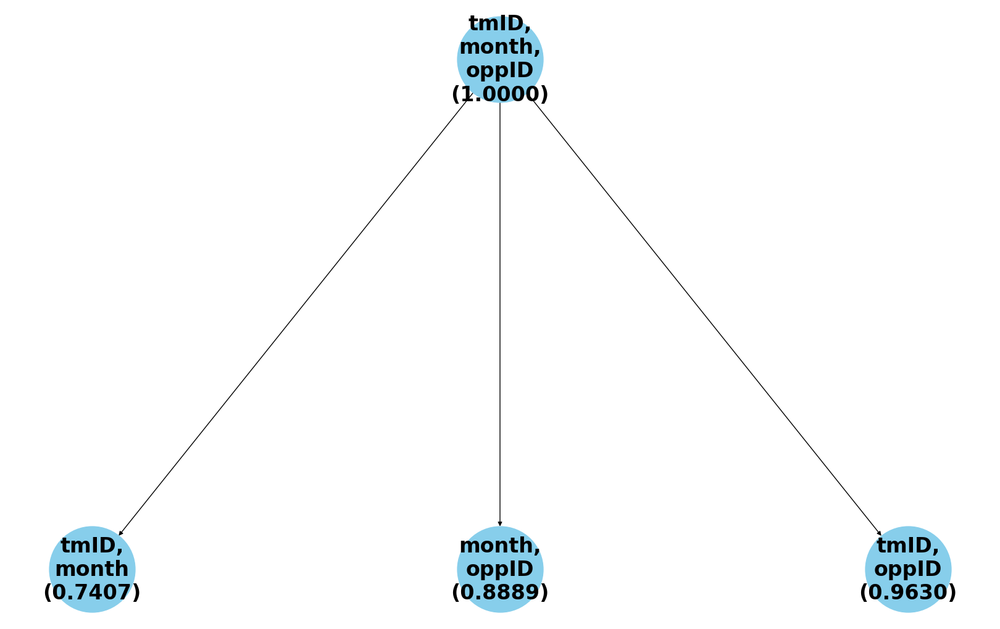

DFS subkey graph
{('month', 'tmID', 'oppID'): 1.0, ('month', 'tmID'): 0.7407, ('month', 'oppID'): 0.8889, ('tmID', 'oppID'): 0.963, ('month',): 0.0185, ('tmID',): 0.2407, ('oppID',): 0.2963, 'φ': 0}
sub_ratio:  {('month', 'tmID', 'oppID'): 1.0, ('month', 'tmID'): 0.7407, ('month', 'oppID'): 0.8889, ('tmID', 'oppID'): 0.963, ('tmID',): 0.2407, ('oppID',): 0.2963}
grouped_sorted_data:  [[('month', 'tmID', 'oppID')], [('month', 'tmID'), ('month', 'oppID'), ('tmID', 'oppID')], [('tmID',), ('oppID',)]]


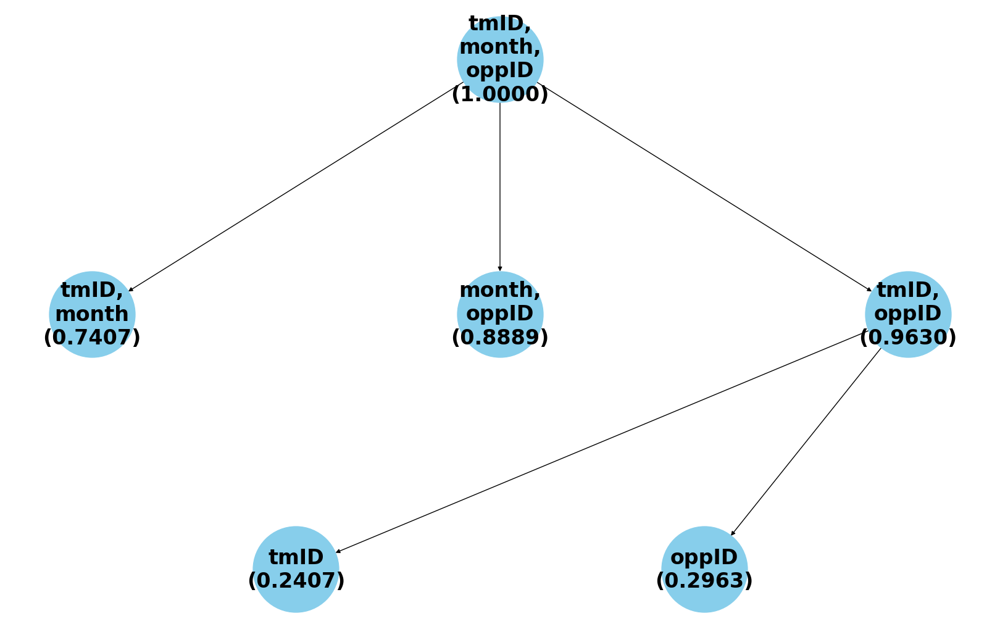

{3: 0.005, 2: 0.0023333333333333335, 1: 0.00075}


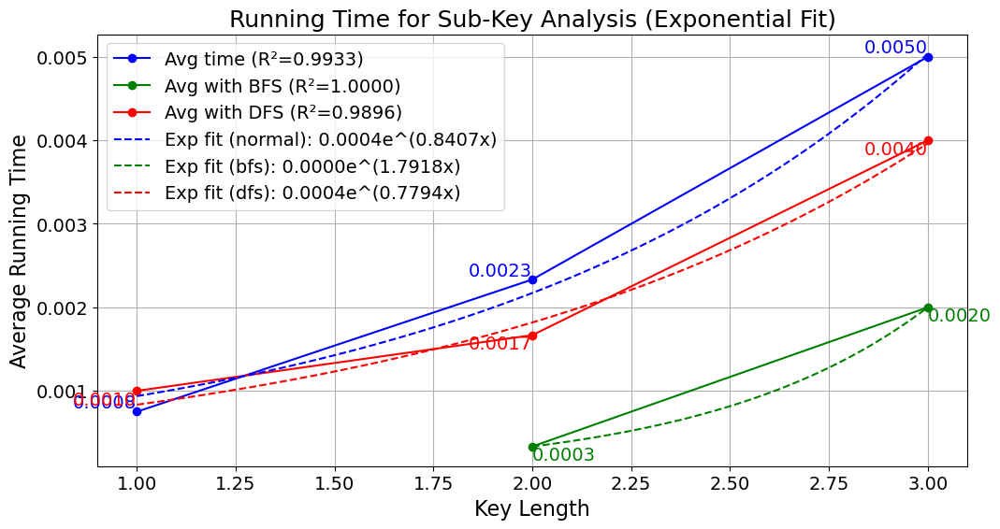


Current column set: ('year', 'month', 'date', 'tmID'), Completeness Ratio: 1.0
Normal subkey graph


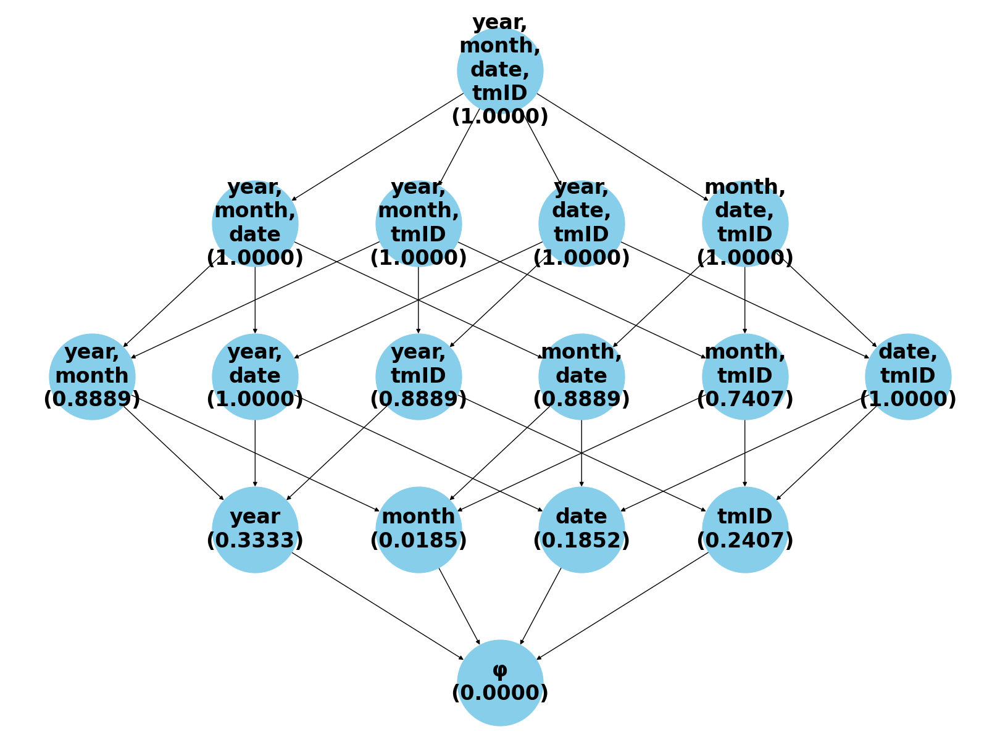

BFS subkey graph


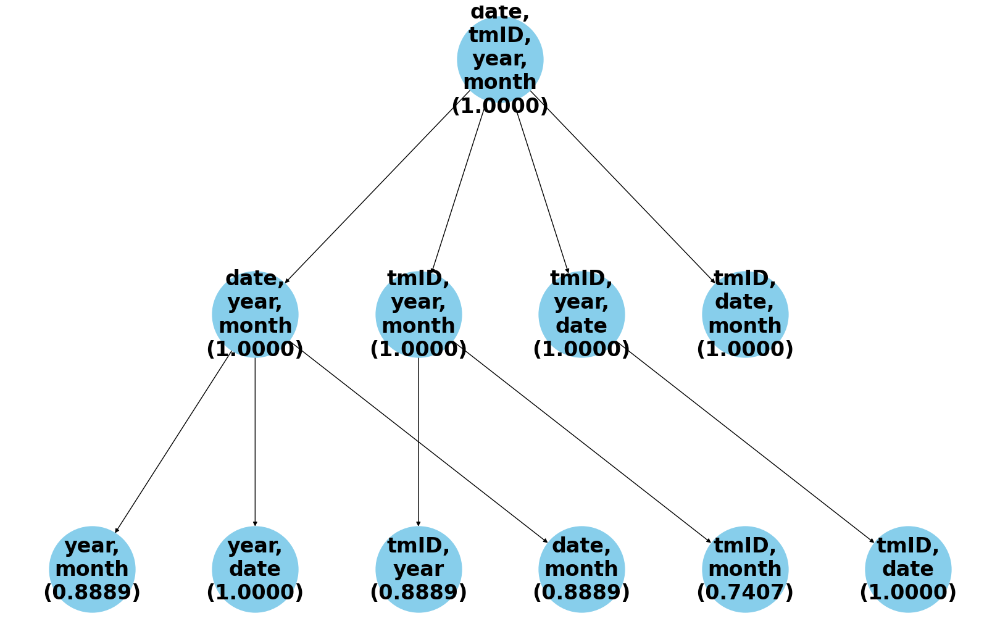

DFS subkey graph
{('year', 'month', 'date', 'tmID'): 1.0, ('year', 'month', 'date'): 1.0, ('year', 'month', 'tmID'): 1.0, ('year', 'date', 'tmID'): 1.0, ('month', 'date', 'tmID'): 1.0, ('year', 'month'): 0.8889, ('year', 'date'): 1.0, ('year', 'tmID'): 0.8889, ('month', 'date'): 0.8889, ('month', 'tmID'): 0.7407, ('date', 'tmID'): 1.0, ('year',): 0.3333, ('month',): 0.0185, ('date',): 0.1852, ('tmID',): 0.2407, 'φ': 0}
sub_ratio:  {('year', 'month', 'date', 'tmID'): 1.0, ('year', 'month', 'date'): 1.0, ('year', 'month', 'tmID'): 1.0, ('year', 'date', 'tmID'): 1.0, ('month', 'date', 'tmID'): 1.0, ('year', 'month'): 0.8889, ('year', 'date'): 1.0, ('month', 'date'): 0.8889, ('year', 'tmID'): 0.8889, ('month', 'tmID'): 0.7407, ('date', 'tmID'): 1.0, ('year',): 0.3333, ('date',): 0.1852, ('tmID',): 0.2407}
grouped_sorted_data:  [[('year', 'month', 'date', 'tmID')], [('year', 'month', 'date'), ('year', 'month', 'tmID'), ('year', 'date', 'tmID'), ('month', 'date', 'tmID')], [('year', 'month')

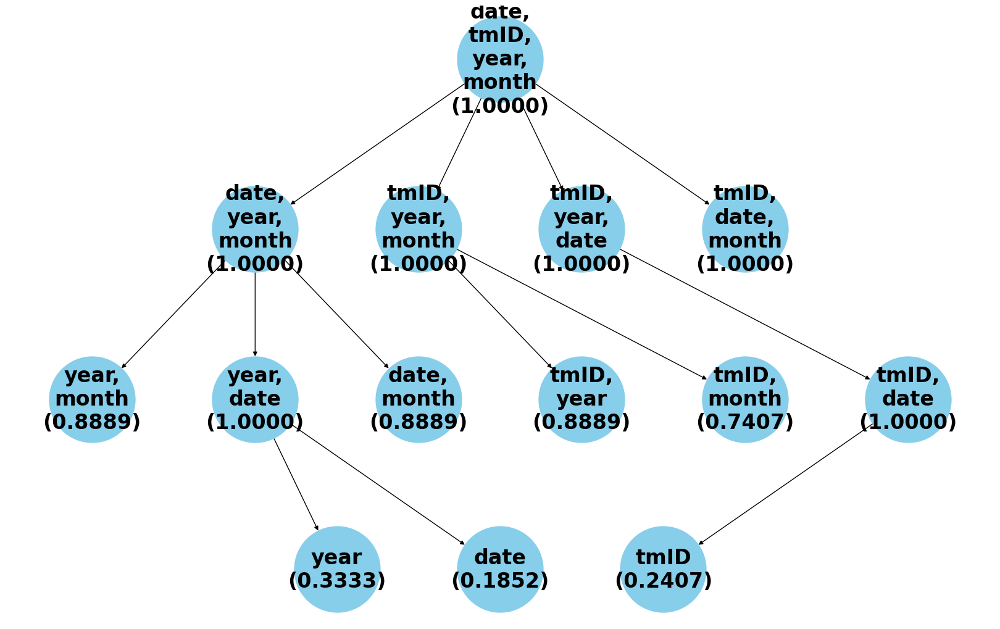

{4: 0.02, 3: 0.012, 2: 0.0068333333333333345, 1: 0.0024000000000000002}


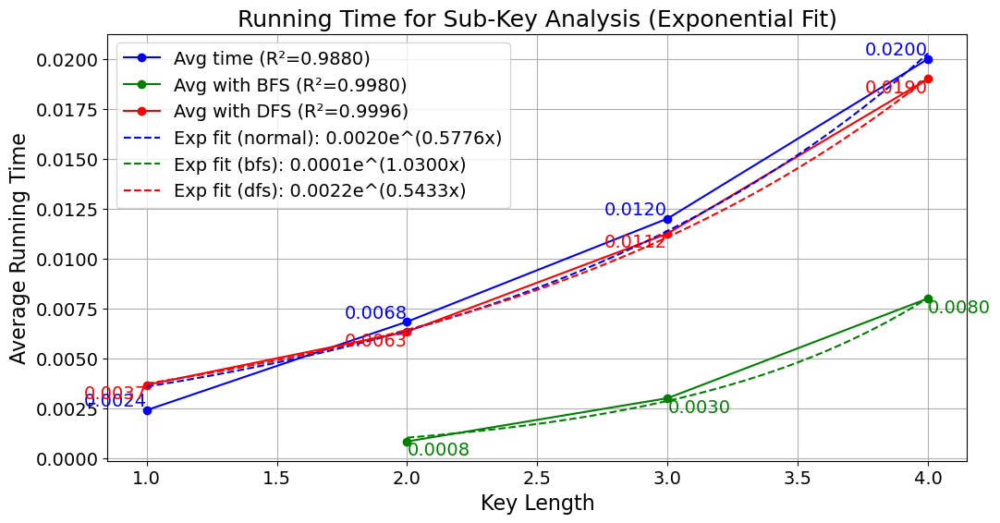

In [10]:
# CombinedShutouts
near_key_list=[
    ('year', 'month', 'date', 'tmID'),
    ('month', 'tmID', 'oppID')
]
main('runTime_data/CombinedShutouts_data.csv', near_key_list)


Current column set: ('playerID', 'year', 'stint'), Completeness Ratio: 1.0
Normal subkey graph


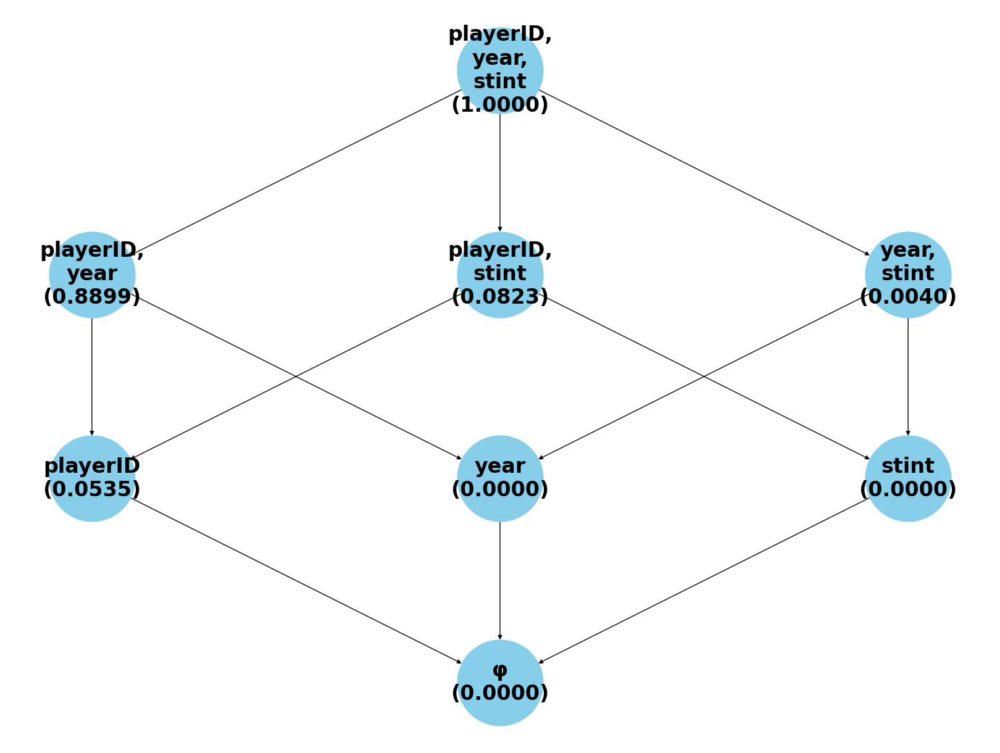

BFS subkey graph


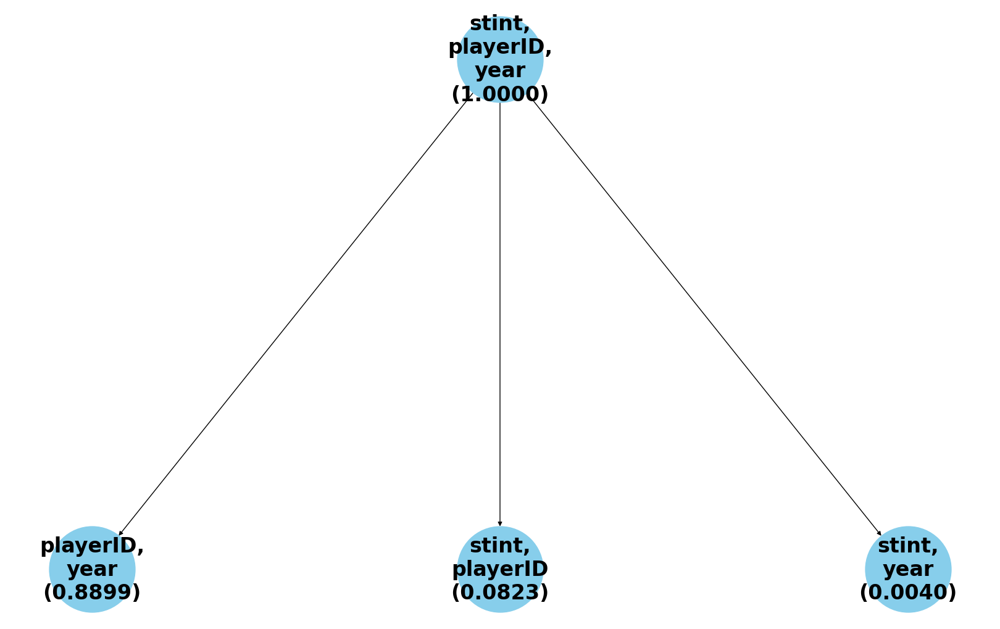

DFS subkey graph
{('playerID', 'year', 'stint'): 1.0, ('playerID', 'year'): 0.8899, ('playerID', 'stint'): 0.0823, ('year', 'stint'): 0.004, ('playerID',): 0.0535, ('year',): 0.0, ('stint',): 0.0, 'φ': 0}
sub_ratio:  {('playerID', 'year', 'stint'): 1.0, ('playerID', 'year'): 0.8899, ('playerID', 'stint'): 0.0823, ('year', 'stint'): 0.004}
grouped_sorted_data:  [[('playerID', 'year', 'stint')], [('playerID', 'year'), ('playerID', 'stint'), ('year', 'stint')]]


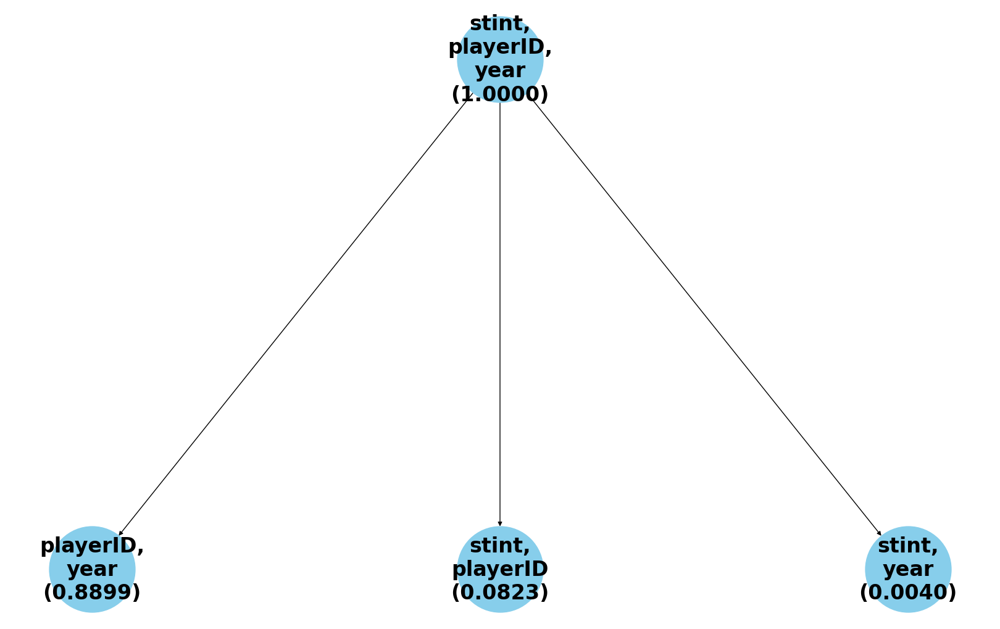

{3: 0.036, 2: 0.011333333333333334, 1: 0.0022500000000000003}


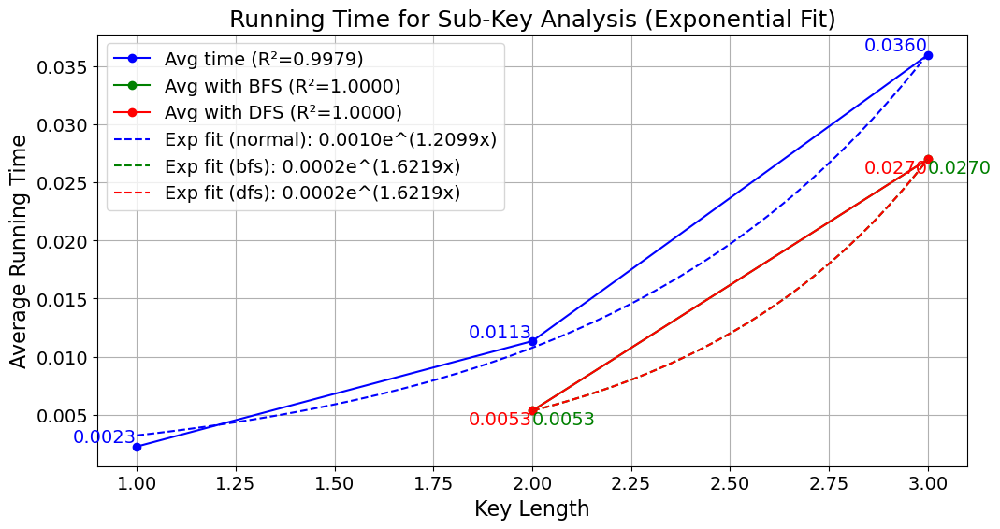

In [11]:
# Goalies
near_key_list=[
    ('playerID', 'year', 'stint')
]
main('runTime_data/Goalies_data.csv', near_key_list)


Current column set: ('playerID', 'year'), Completeness Ratio: 1.0
Normal subkey graph


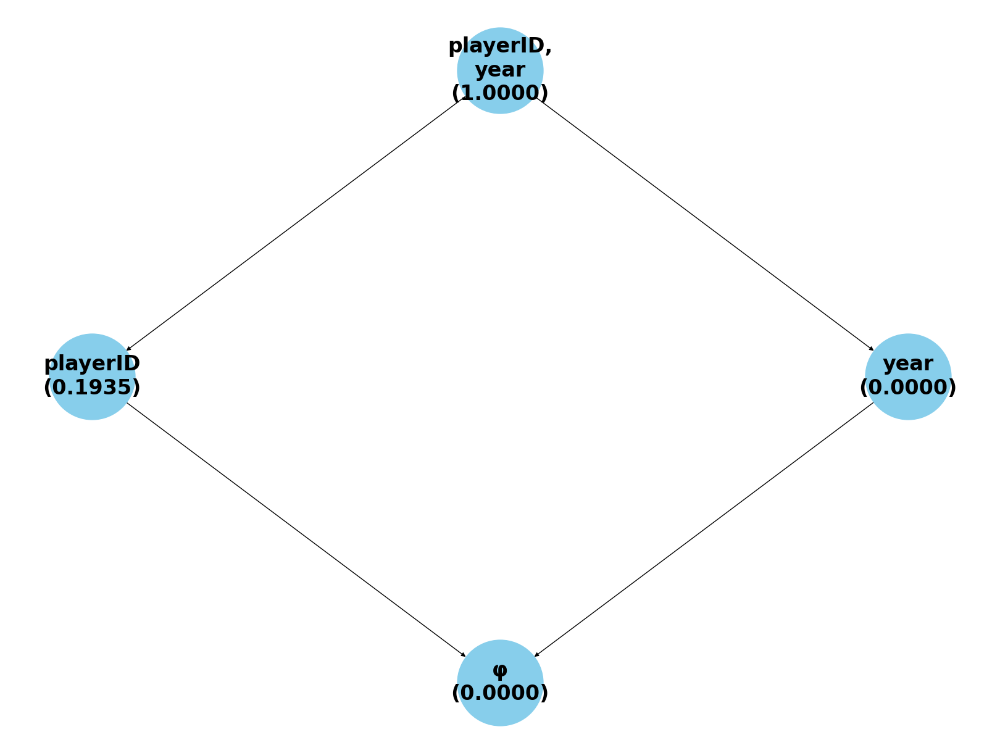

BFS subkey graph


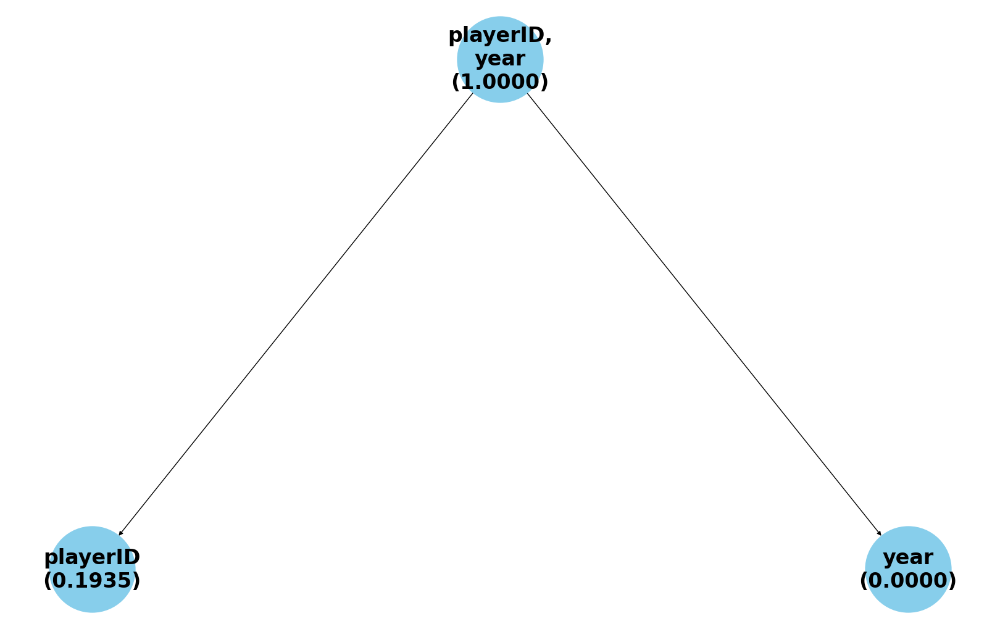

DFS subkey graph
{('playerID', 'year'): 1.0, ('playerID',): 0.1935, ('year',): 0.0, 'φ': 0}
sub_ratio:  {('playerID', 'year'): 1.0, ('playerID',): 0.1935, ('year',): 0.0}
grouped_sorted_data:  [[('playerID', 'year')], [('playerID',), ('year',)]]


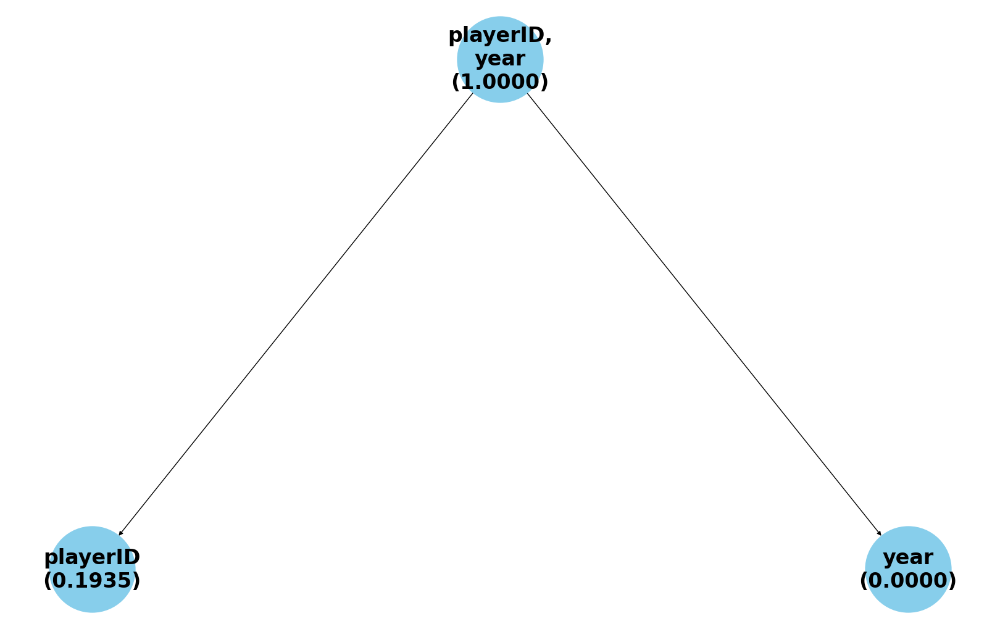

{2: 0.009, 1: 0.0030000000000000005}


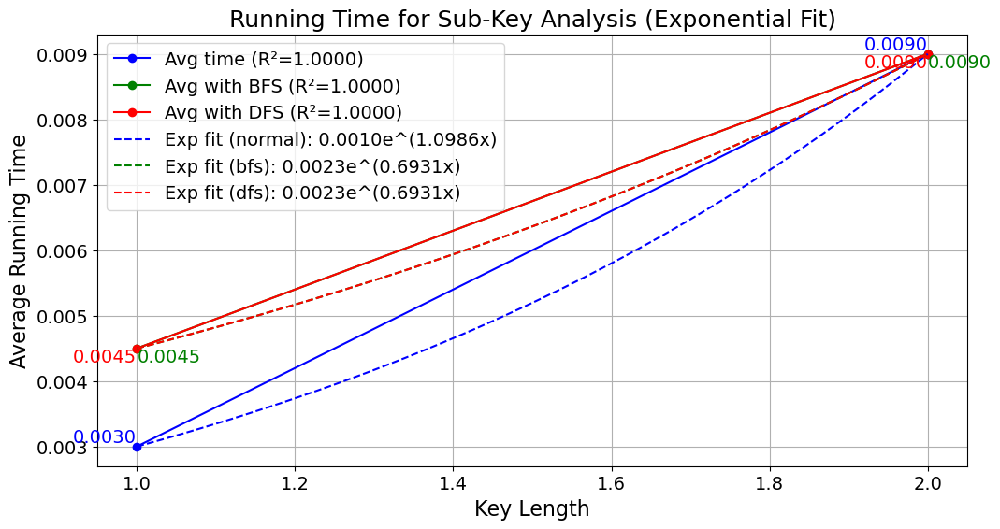

In [12]:
# GoaliesSC
near_key_list=[
    ('playerID', 'year')
]
main('runTime_data/GoaliesSC_data.csv', near_key_list)


Current column set: ('playerID', 'year', 'stint'), Completeness Ratio: 1.0
Normal subkey graph


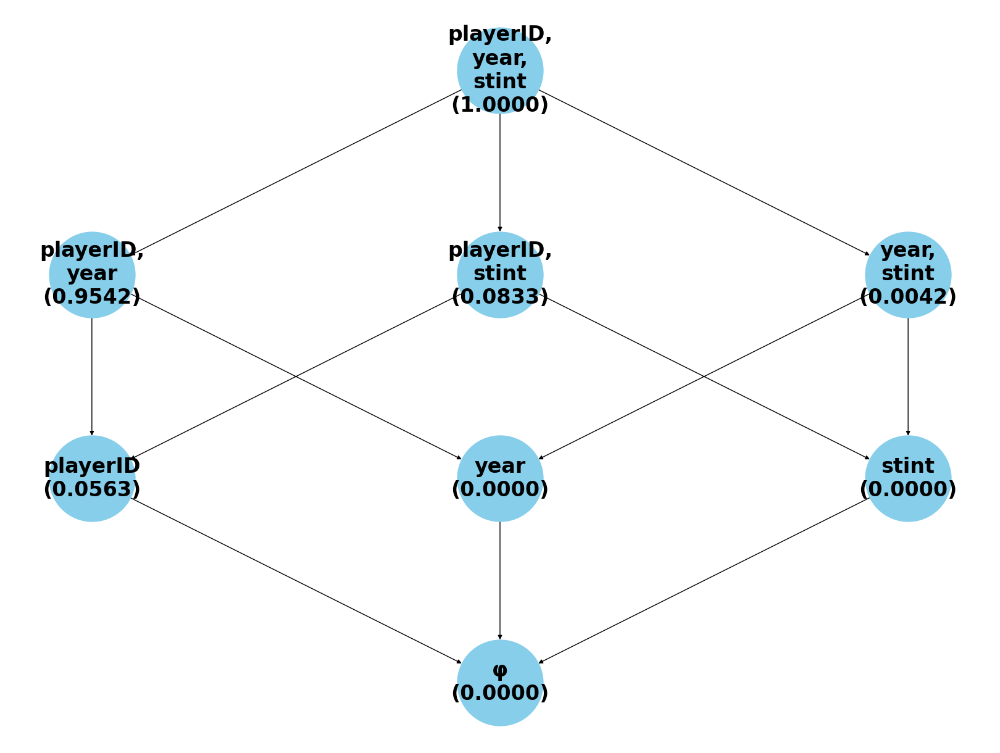

BFS subkey graph


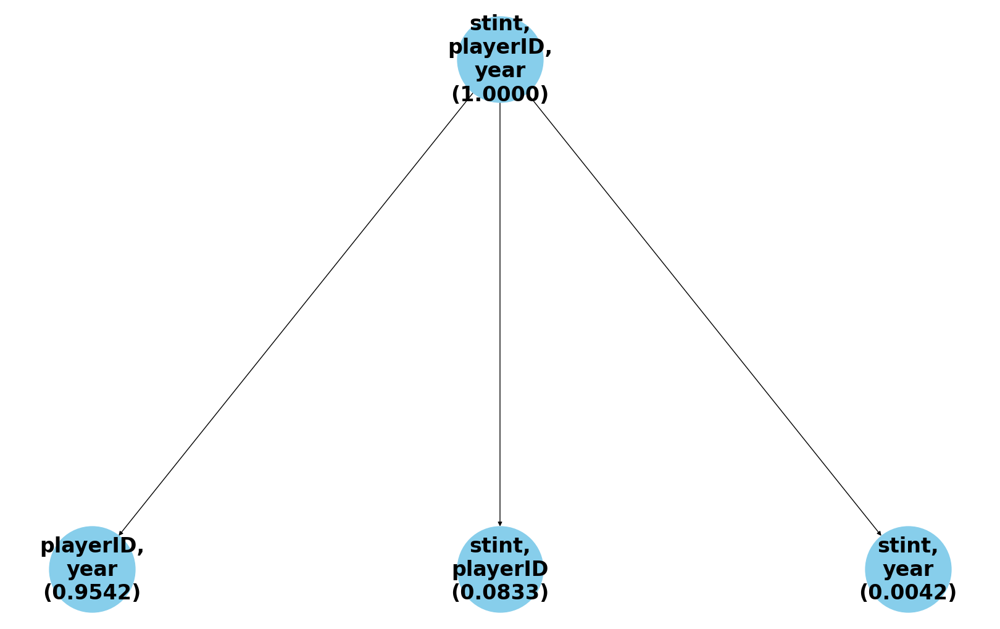

DFS subkey graph
{('playerID', 'year', 'stint'): 1.0, ('playerID', 'year'): 0.9542, ('playerID', 'stint'): 0.0833, ('year', 'stint'): 0.0042, ('playerID',): 0.0563, ('year',): 0.0, ('stint',): 0.0, 'φ': 0}
sub_ratio:  {('playerID', 'year', 'stint'): 1.0, ('playerID', 'year'): 0.9542, ('playerID', 'stint'): 0.0833, ('year', 'stint'): 0.0042, ('playerID',): 0.0563, ('year',): 0.0}
grouped_sorted_data:  [[('playerID', 'year', 'stint')], [('playerID', 'year'), ('playerID', 'stint'), ('year', 'stint')], [('playerID',), ('year',)]]


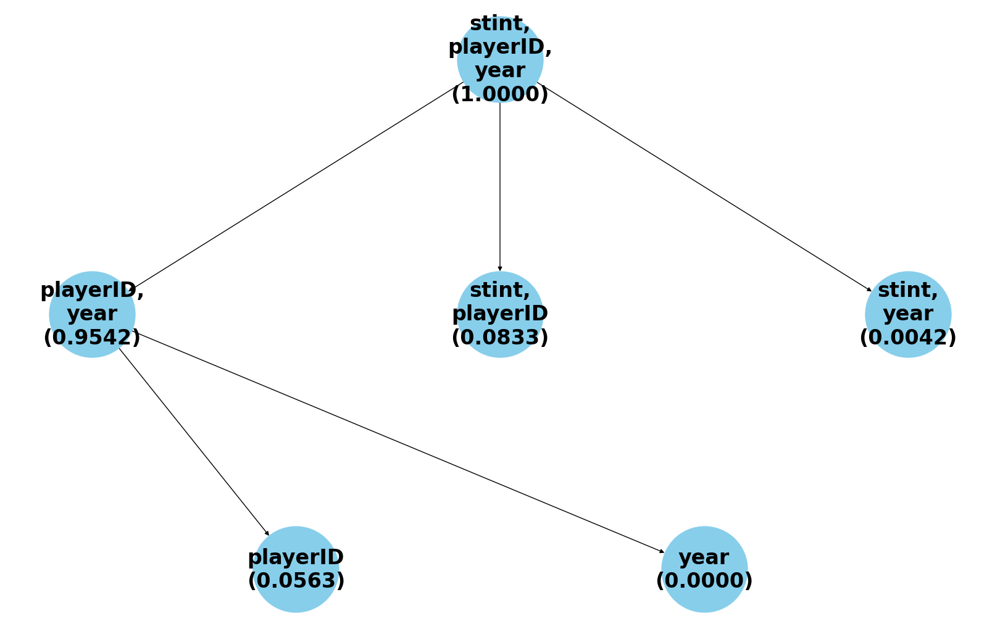

{3: 0.018, 2: 0.009333333333333334, 1: 0.0027500000000000003}


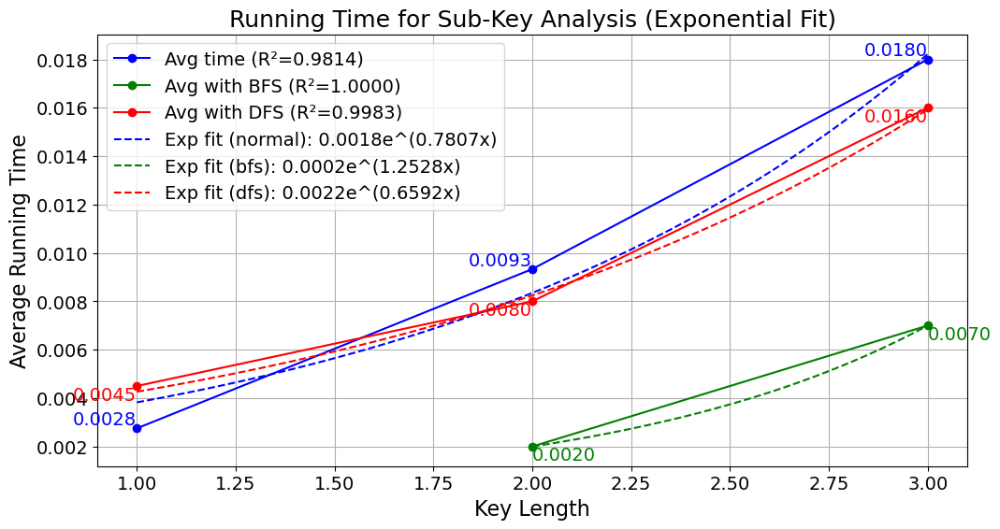


Current column set: ('playerID', 'year', 'tmID'), Completeness Ratio: 1.0
Normal subkey graph


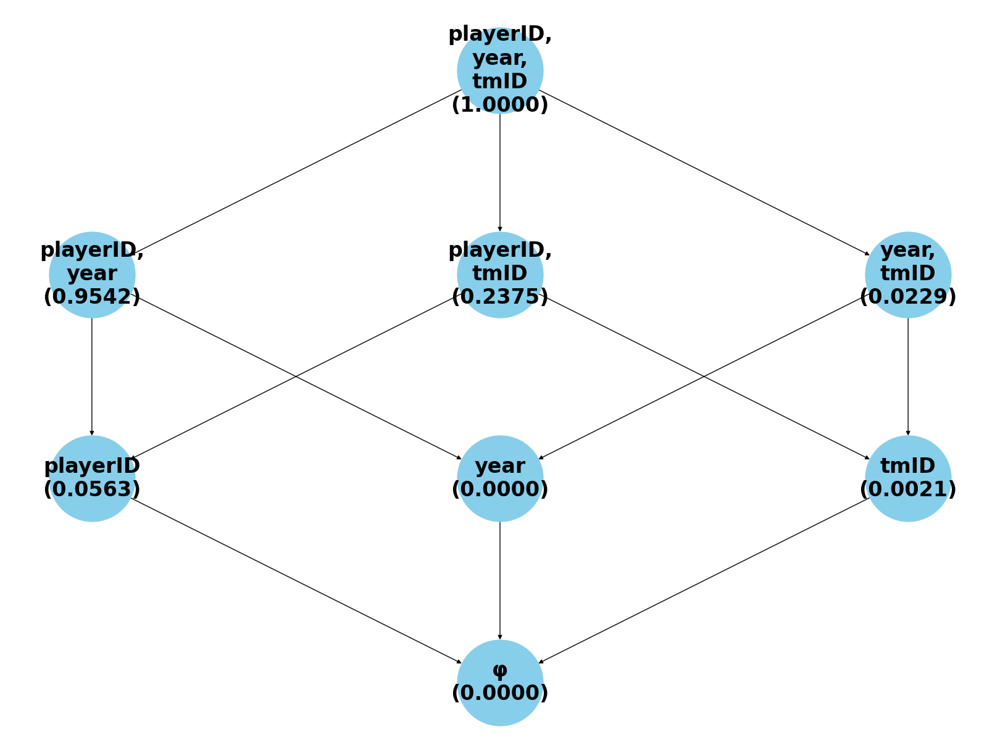

BFS subkey graph


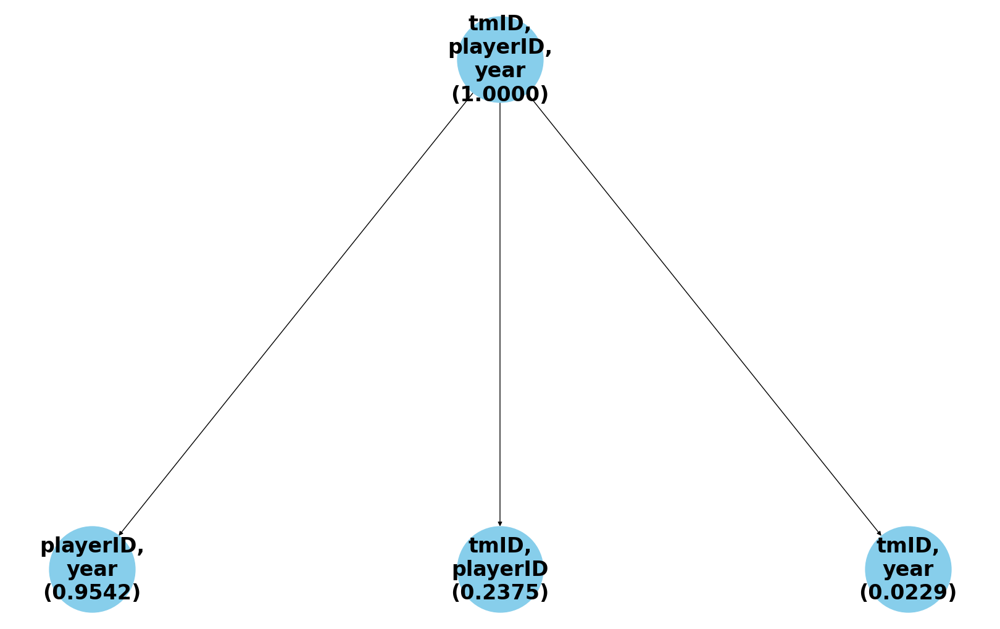

DFS subkey graph
{('playerID', 'year', 'tmID'): 1.0, ('playerID', 'year'): 0.9542, ('playerID', 'tmID'): 0.2375, ('year', 'tmID'): 0.0229, ('playerID',): 0.0563, ('year',): 0.0, ('tmID',): 0.0021, 'φ': 0}
sub_ratio:  {('playerID', 'year', 'tmID'): 1.0, ('playerID', 'year'): 0.9542, ('playerID', 'tmID'): 0.2375, ('year', 'tmID'): 0.0229, ('playerID',): 0.0563, ('year',): 0.0}
grouped_sorted_data:  [[('playerID', 'year', 'tmID')], [('playerID', 'year'), ('playerID', 'tmID'), ('year', 'tmID')], [('playerID',), ('year',)]]


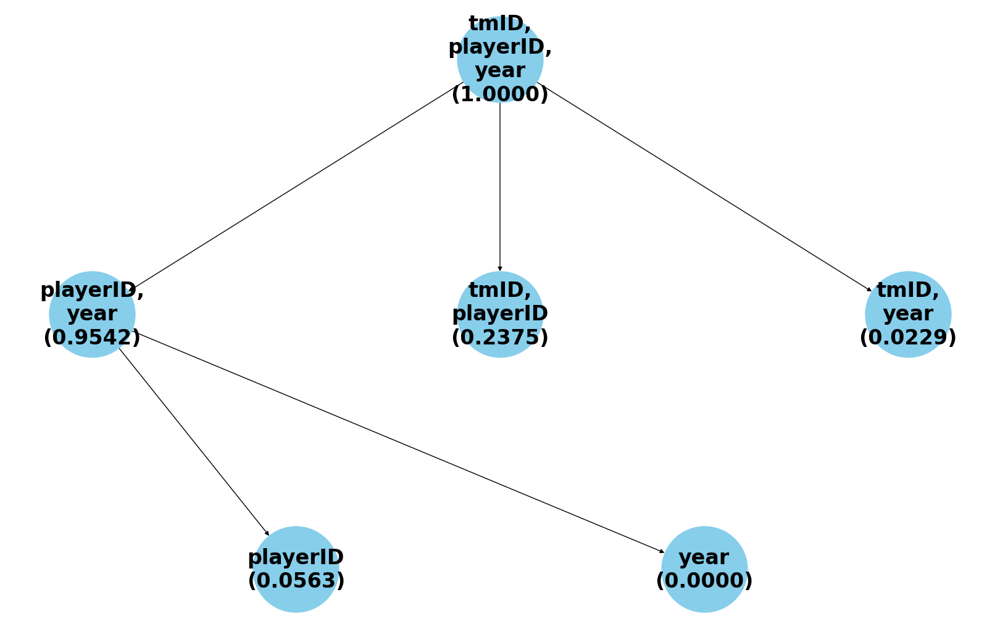

{3: 0.019, 2: 0.009, 1: 0.0025000000000000005}


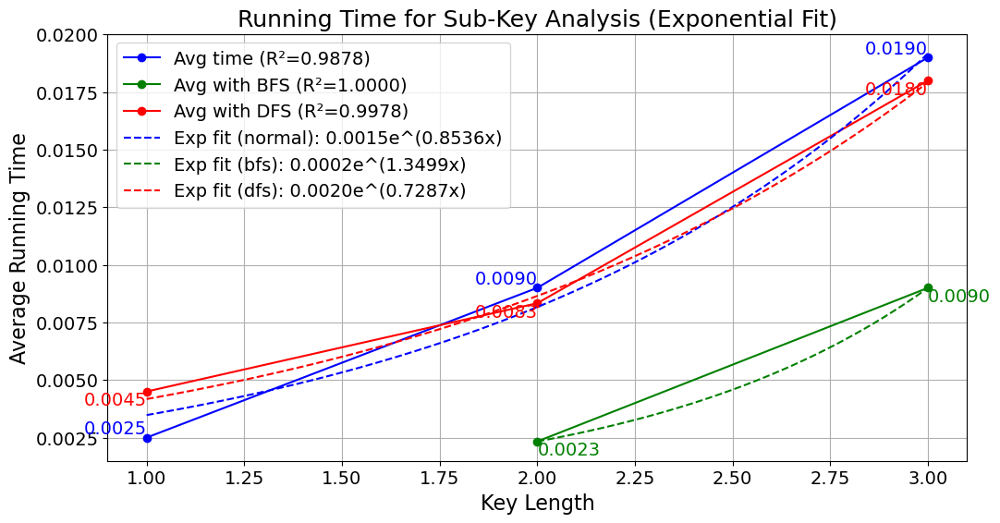

In [13]:
# GoaliesShootout
near_key_list=[
    ('playerID', 'year', 'stint'),
    ('playerID', 'year', 'tmID')
]
main('runTime_data/GoaliesShootout_data.csv', near_key_list)


Current column set: ('year', 'name'), Completeness Ratio: 1.0
Normal subkey graph


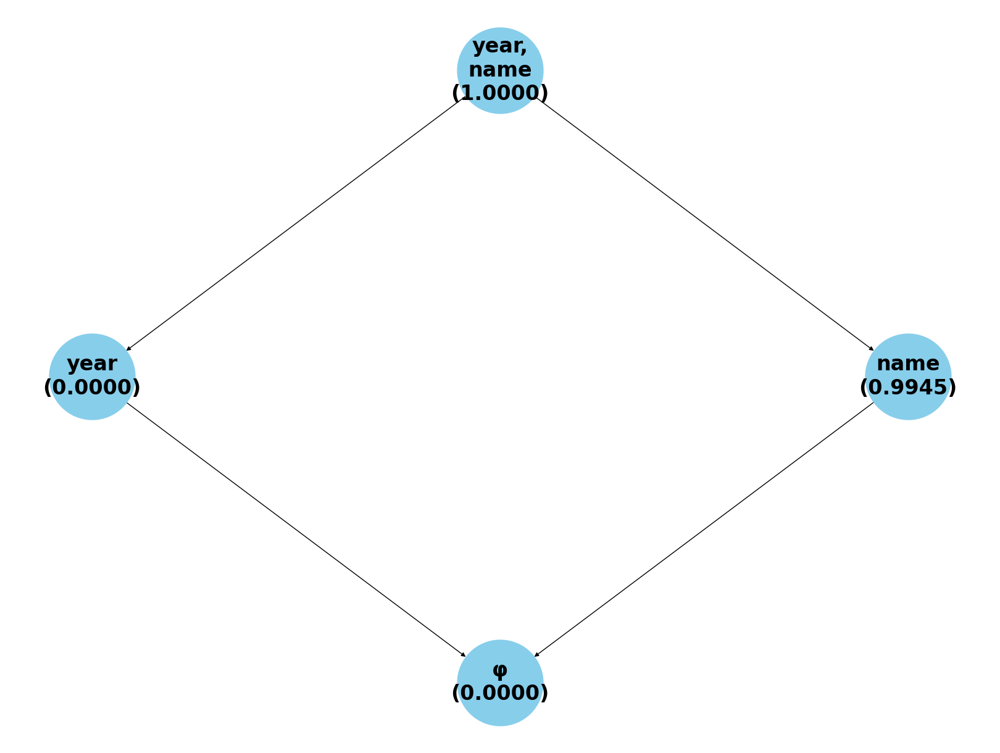

BFS subkey graph


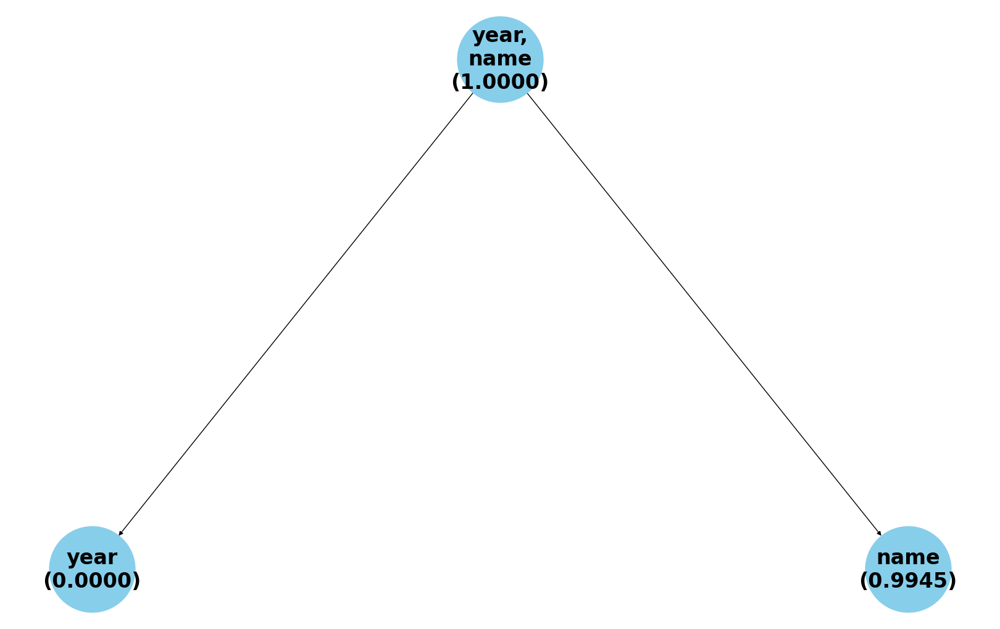

DFS subkey graph
{('year', 'name'): 1.0, ('year',): 0.0, ('name',): 0.9945, 'φ': 0}
sub_ratio:  {('year', 'name'): 1.0, ('year',): 0.0, ('name',): 0.9945}
grouped_sorted_data:  [[('year', 'name')], [('year',), ('name',)]]


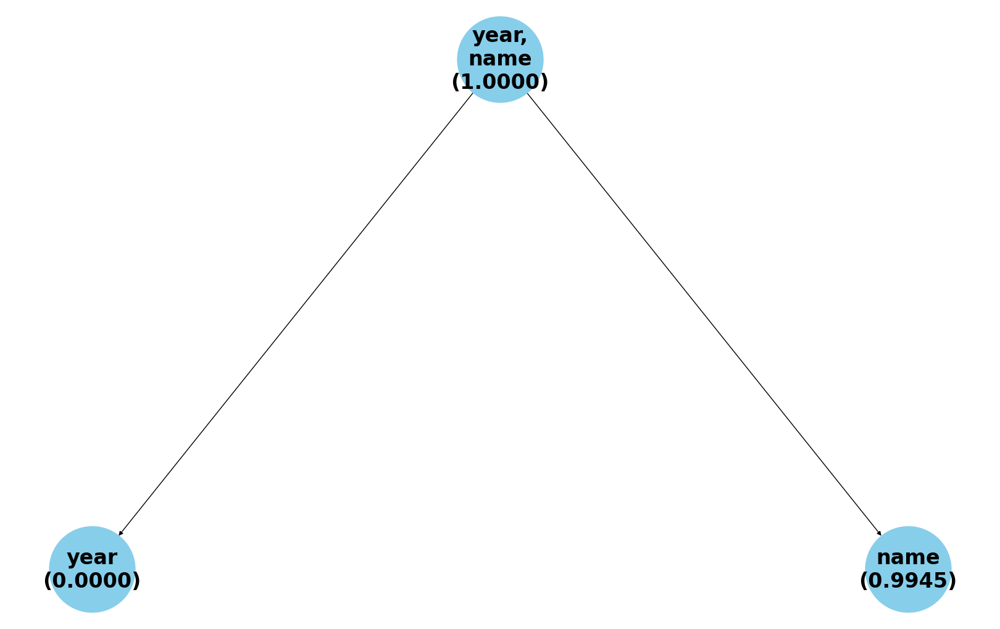

{2: 0.003, 1: 0.0006666666666666666}


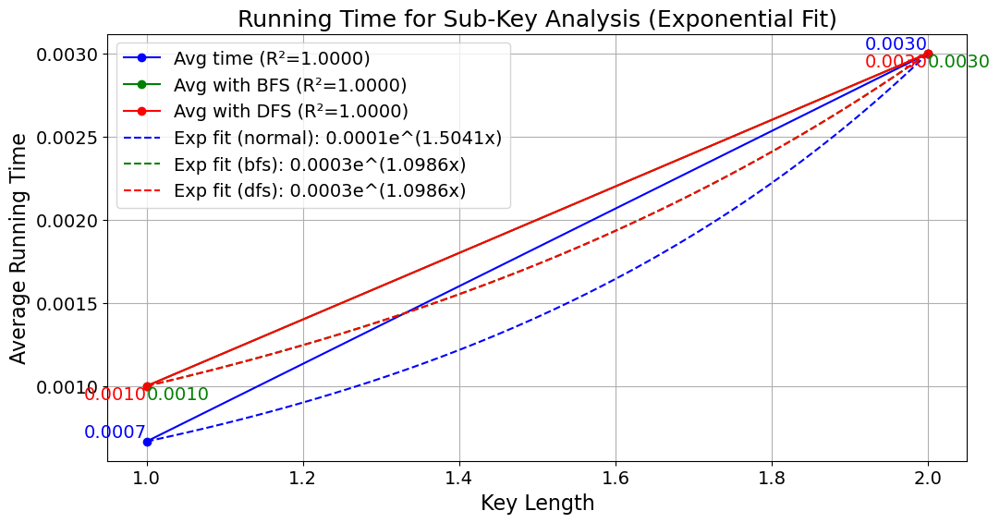

In [14]:
# HOF
near_key_list=[
    ('year', 'name')
]
main('runTime_data/HOF_data.csv', near_key_list)


Current column set: ('lastName', 'nameGiven', 'birthYear'), Completeness Ratio: 0.7572
Normal subkey graph


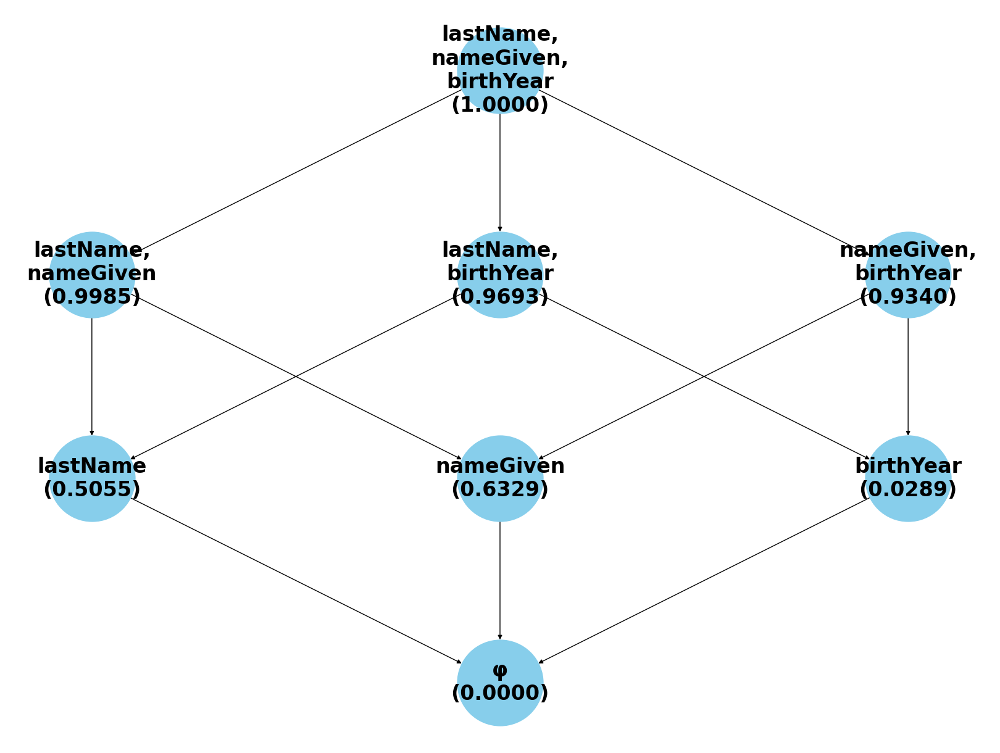

BFS subkey graph


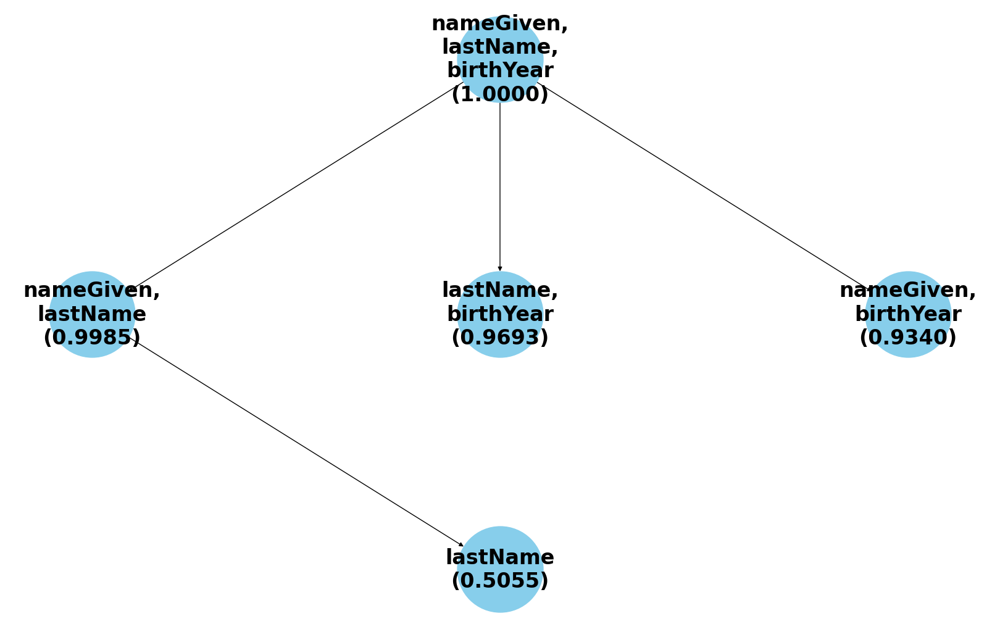

DFS subkey graph
{('lastName', 'nameGiven', 'birthYear'): 1.0, ('lastName', 'nameGiven'): 0.9985, ('lastName', 'birthYear'): 0.9693, ('nameGiven', 'birthYear'): 0.934, ('lastName',): 0.5055, ('nameGiven',): 0.6329, ('birthYear',): 0.0289, 'φ': 0}
sub_ratio:  {('lastName', 'nameGiven', 'birthYear'): 1.0, ('lastName', 'nameGiven'): 0.9985, ('lastName', 'birthYear'): 0.9693, ('nameGiven', 'birthYear'): 0.934, ('lastName',): 0.5055, ('nameGiven',): 0.6329, ('birthYear',): 0.0289}
grouped_sorted_data:  [[('lastName', 'nameGiven', 'birthYear')], [('lastName', 'nameGiven'), ('lastName', 'birthYear'), ('nameGiven', 'birthYear')], [('lastName',), ('nameGiven',), ('birthYear',)]]


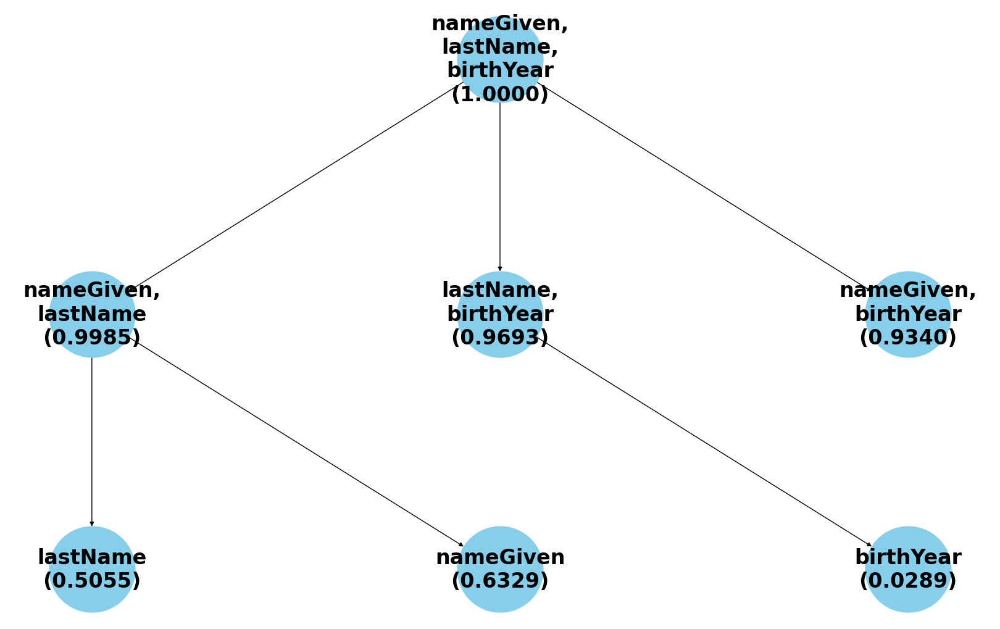

{3: 0.1475, 2: 0.059133333333333336, 1: 0.0137}


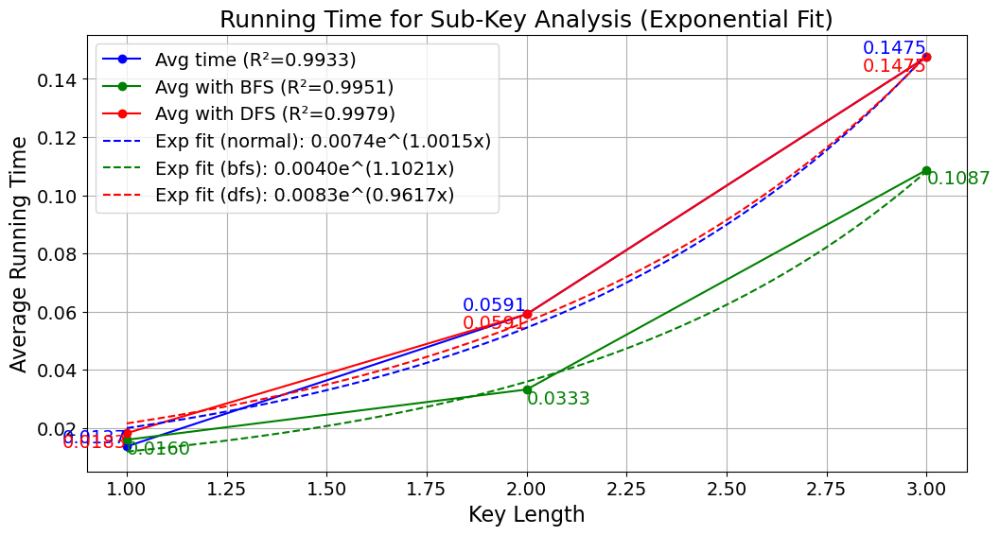

In [28]:
# Master
near_key_list=[
    ('lastName','nameGiven','birthYear')
]
main('runTime_data/Master_data.csv', near_key_list)


Current column set: ('playerID', 'year', 'tmID', 'stint'), Completeness Ratio: 1.0
Normal subkey graph


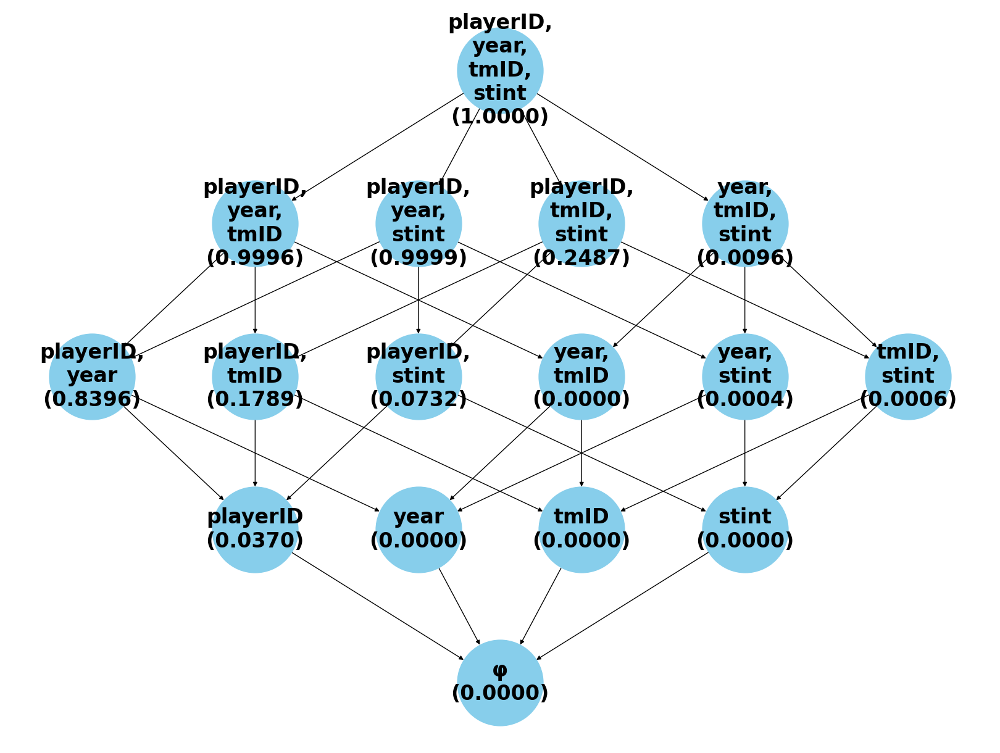

BFS subkey graph


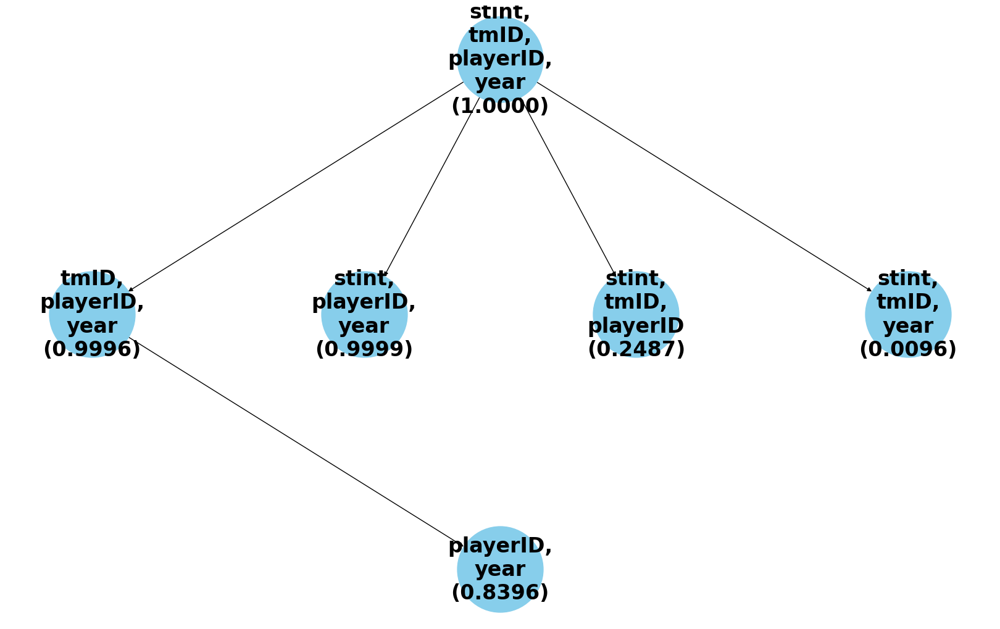

DFS subkey graph
{('playerID', 'year', 'tmID', 'stint'): 1.0, ('playerID', 'year', 'tmID'): 0.9996, ('playerID', 'year', 'stint'): 0.9999, ('playerID', 'tmID', 'stint'): 0.2487, ('year', 'tmID', 'stint'): 0.0096, ('playerID', 'year'): 0.8396, ('playerID', 'tmID'): 0.1789, ('playerID', 'stint'): 0.0732, ('year', 'tmID'): 0.0, ('year', 'stint'): 0.0004, ('tmID', 'stint'): 0.0006, ('playerID',): 0.037, ('year',): 0.0, ('tmID',): 0.0, ('stint',): 0.0, 'φ': 0}
sub_ratio:  {('playerID', 'year', 'tmID', 'stint'): 1.0, ('playerID', 'year', 'tmID'): 0.9996, ('playerID', 'year', 'stint'): 0.9999, ('playerID', 'tmID', 'stint'): 0.2487, ('year', 'tmID', 'stint'): 0.0096, ('playerID', 'year'): 0.8396, ('playerID', 'tmID'): 0.1789, ('year', 'tmID'): 0.0, ('playerID', 'stint'): 0.0732, ('year', 'stint'): 0.0004}
grouped_sorted_data:  [[('playerID', 'year', 'tmID', 'stint')], [('playerID', 'year', 'tmID'), ('playerID', 'year', 'stint'), ('playerID', 'tmID', 'stint'), ('year', 'tmID', 'stint')], [('pla

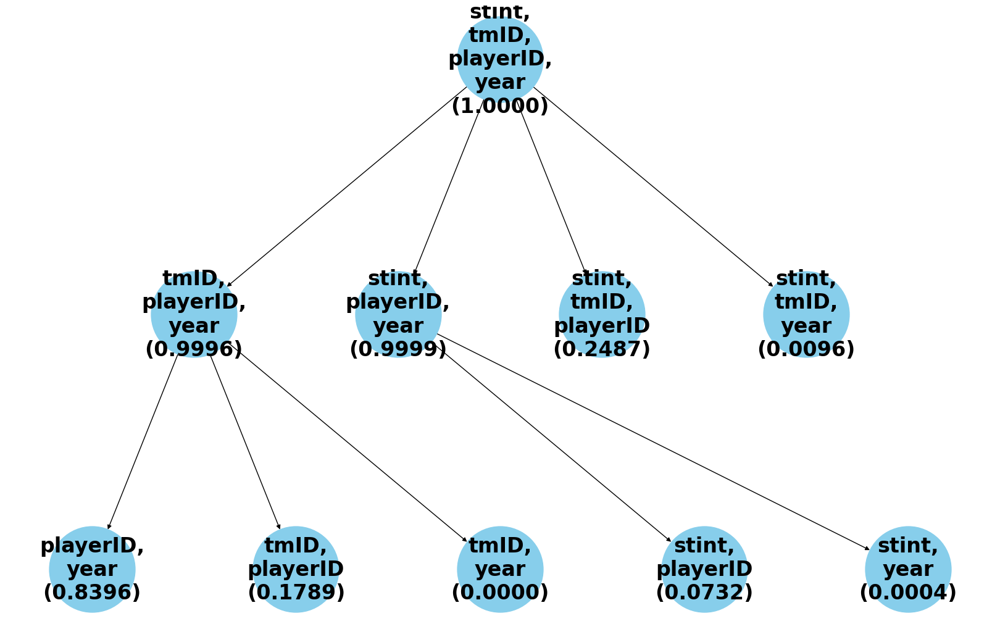

{4: 1.5175, 3: 0.5947250000000001, 2: 0.20720000000000002, 1: 0.04366}


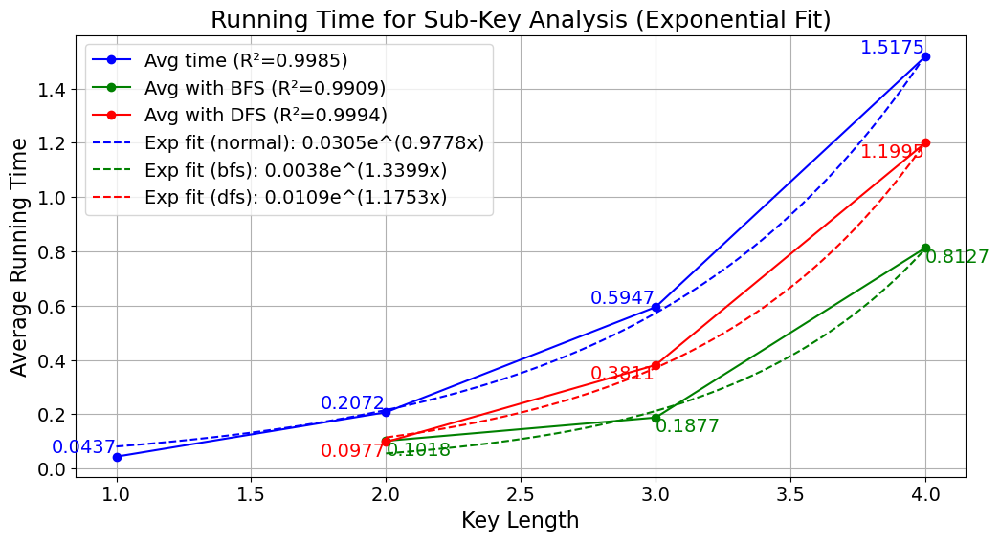


Current column set: ('playerID', 'year', 'stint', 'pos'), Completeness Ratio: 0.9873
Normal subkey graph


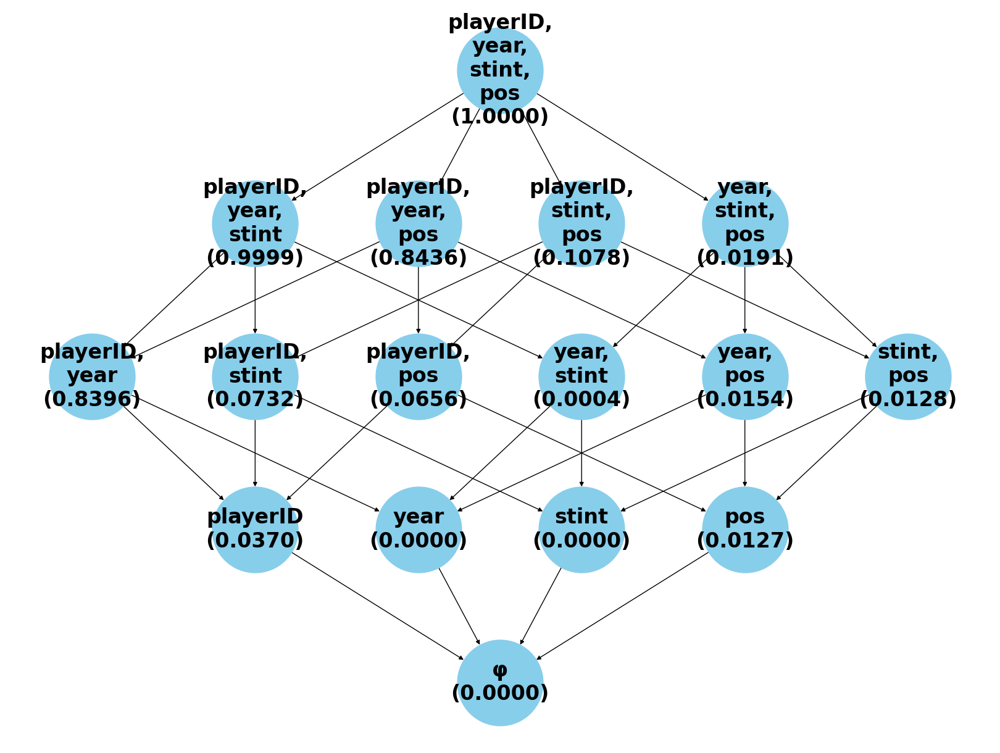

BFS subkey graph


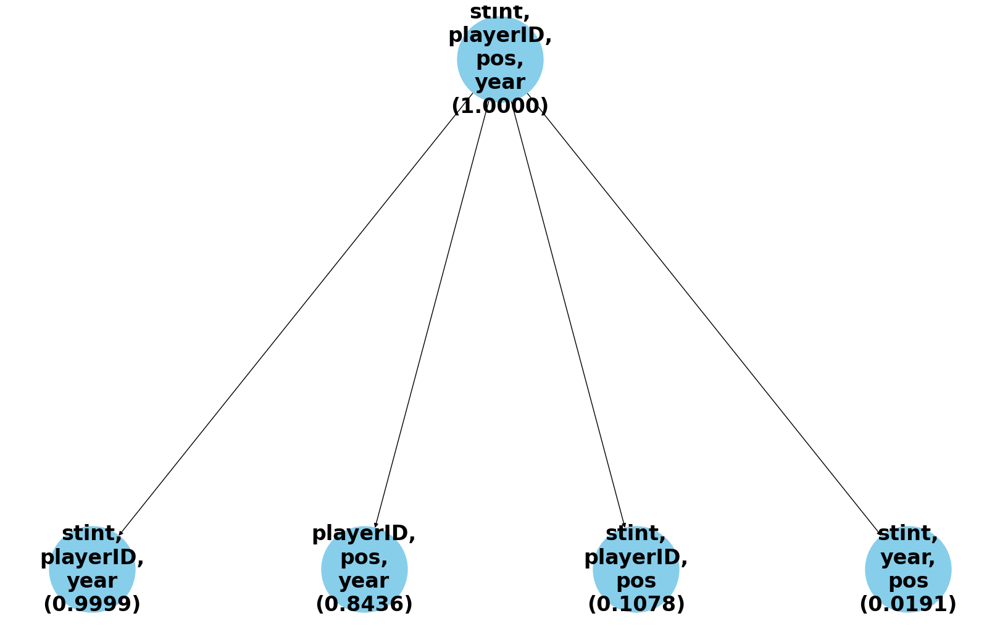

DFS subkey graph
{('playerID', 'year', 'stint', 'pos'): 1.0, ('playerID', 'year', 'stint'): 0.9999, ('playerID', 'year', 'pos'): 0.8436, ('playerID', 'stint', 'pos'): 0.1078, ('year', 'stint', 'pos'): 0.0191, ('playerID', 'year'): 0.8396, ('playerID', 'stint'): 0.0732, ('playerID', 'pos'): 0.0656, ('year', 'stint'): 0.0004, ('year', 'pos'): 0.0154, ('stint', 'pos'): 0.0128, ('playerID',): 0.037, ('year',): 0.0, ('stint',): 0.0, ('pos',): 0.0127, 'φ': 0}
sub_ratio:  {('playerID', 'year', 'stint', 'pos'): 1.0, ('playerID', 'year', 'stint'): 0.9999, ('playerID', 'year', 'pos'): 0.8436, ('playerID', 'stint', 'pos'): 0.1078, ('year', 'stint', 'pos'): 0.0191, ('playerID', 'year'): 0.8396, ('playerID', 'stint'): 0.0732, ('year', 'stint'): 0.0004}
grouped_sorted_data:  [[('playerID', 'year', 'stint', 'pos')], [('playerID', 'year', 'stint'), ('playerID', 'year', 'pos'), ('playerID', 'stint', 'pos'), ('year', 'stint', 'pos')], [('playerID', 'year'), ('playerID', 'stint'), ('year', 'stint')]]


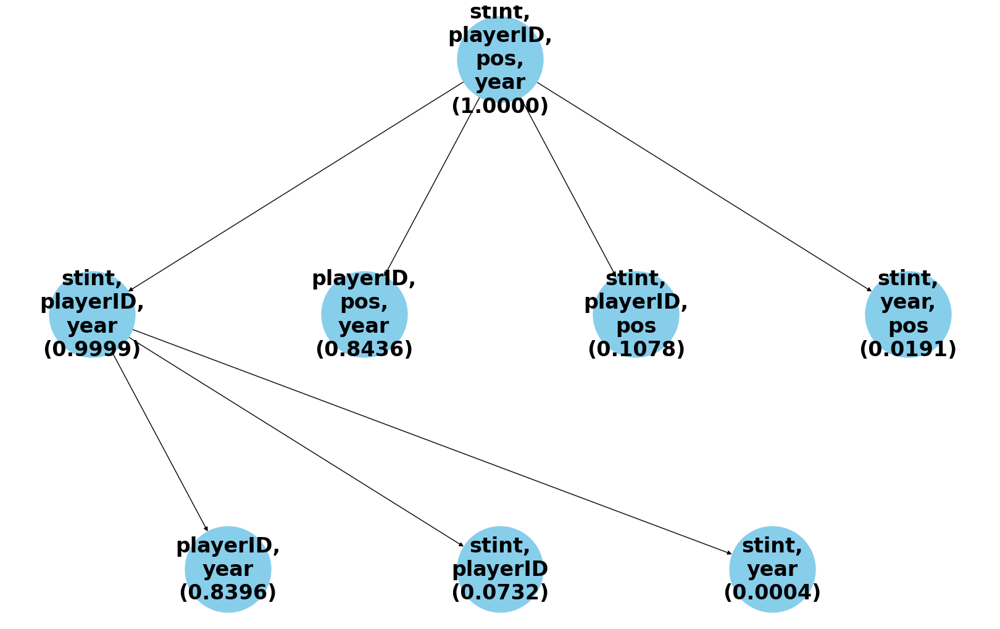

{4: 1.5486, 3: 0.6219250000000001, 2: 0.22548333333333334, 1: 0.050039999999999994}


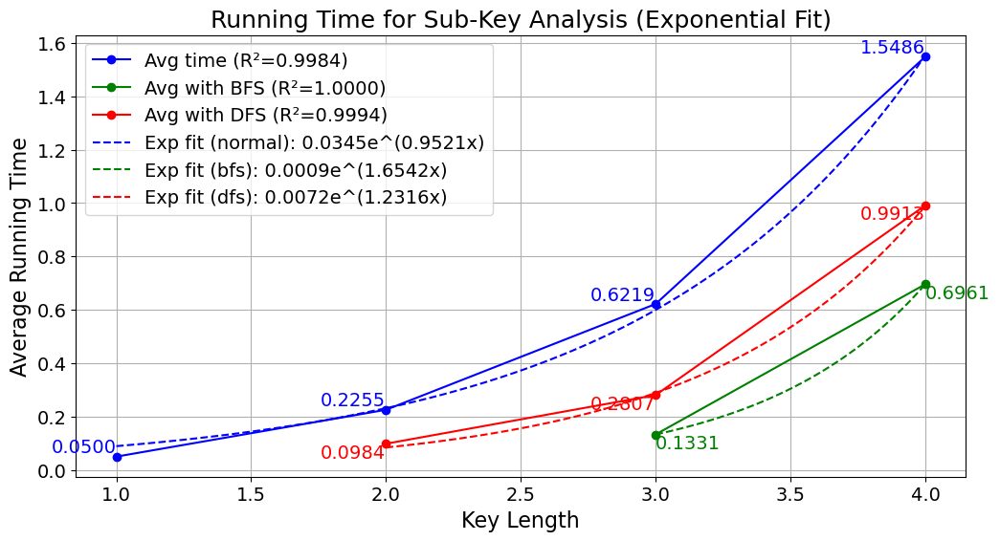

In [16]:
# Scoring
near_key_list=[
    ('playerID','year','tmID','stint'),
    ('playerID','year','stint','pos')
]
main('runTime_data/Scoring_data.csv', near_key_list)


Current column set: ('playerID', 'year'), Completeness Ratio: 1.0
Normal subkey graph


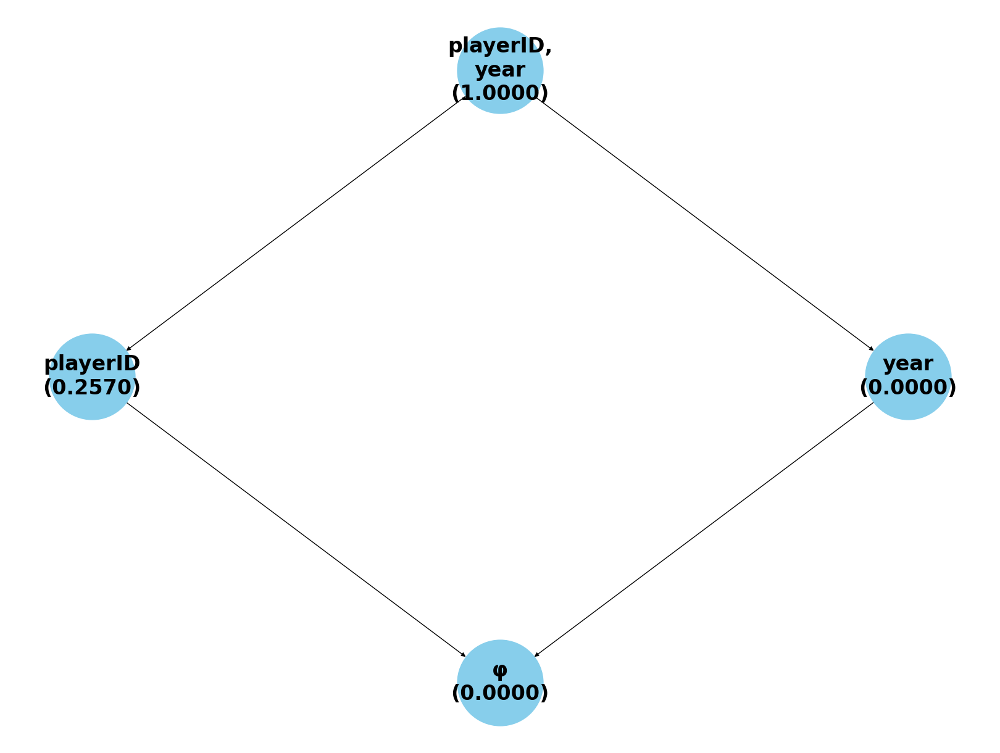

BFS subkey graph


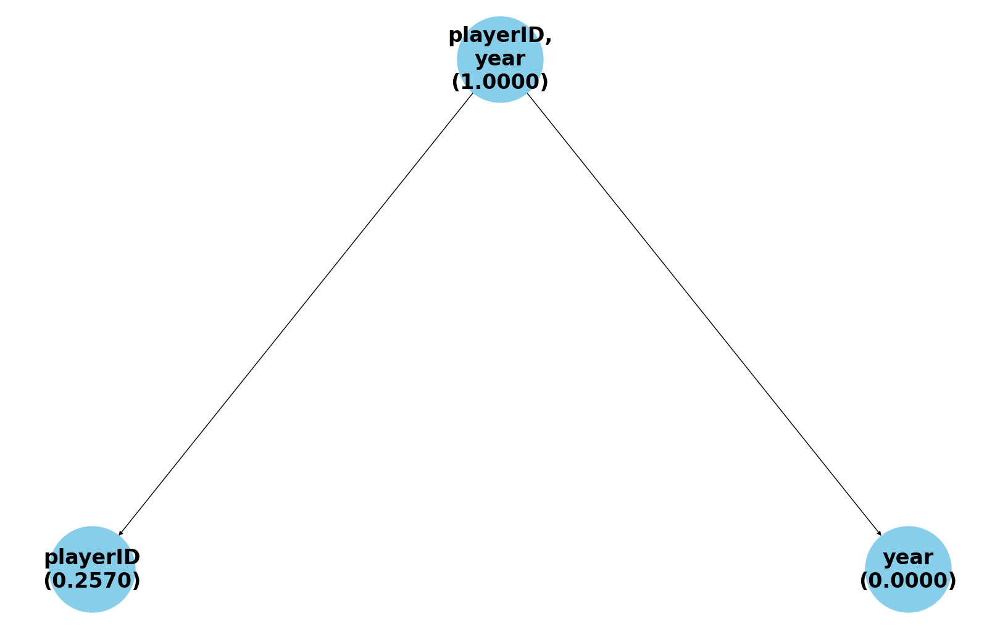

DFS subkey graph
{('playerID', 'year'): 1.0, ('playerID',): 0.257, ('year',): 0.0, 'φ': 0}
sub_ratio:  {('playerID', 'year'): 1.0, ('playerID',): 0.257, ('year',): 0.0}
grouped_sorted_data:  [[('playerID', 'year')], [('playerID',), ('year',)]]


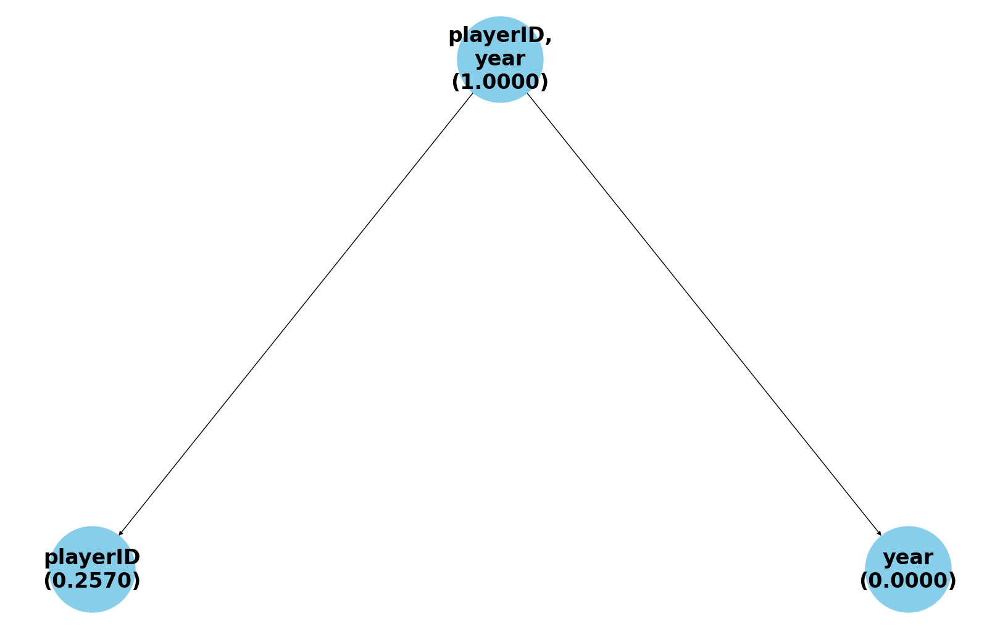

{2: 0.01, 1: 0.0030000000000000005}


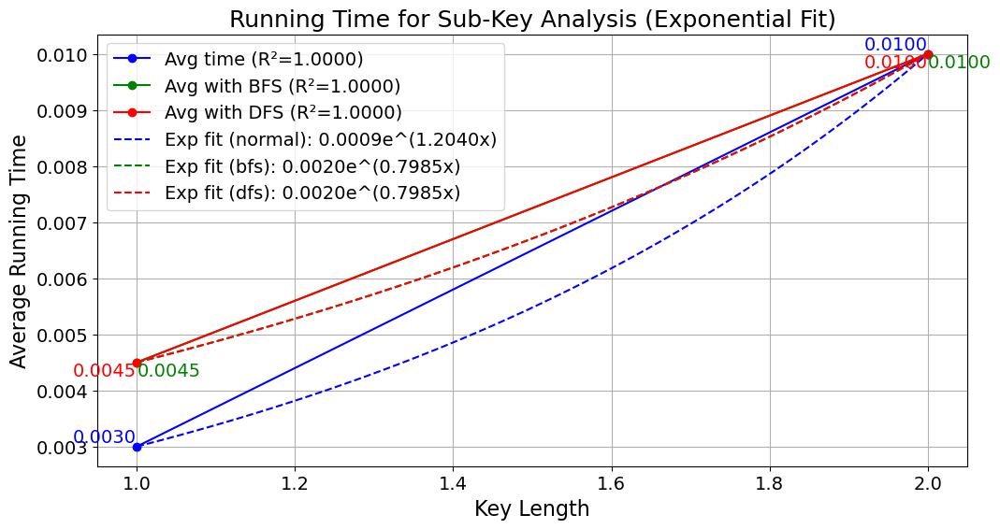

In [17]:
# ScoringSC
near_key_list=[
    ('playerID','year')
]
main('runTime_data/ScoringSC_data.csv', near_key_list)


Current column set: ('playerID', 'year', 'tmID'), Completeness Ratio: 1.0
Normal subkey graph


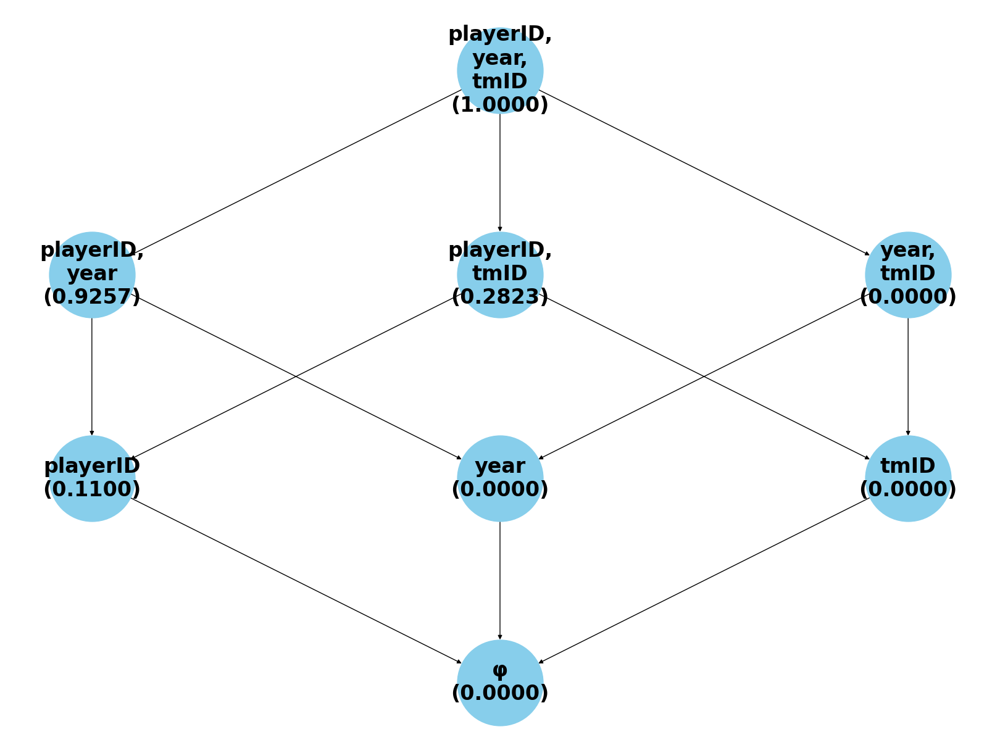

BFS subkey graph


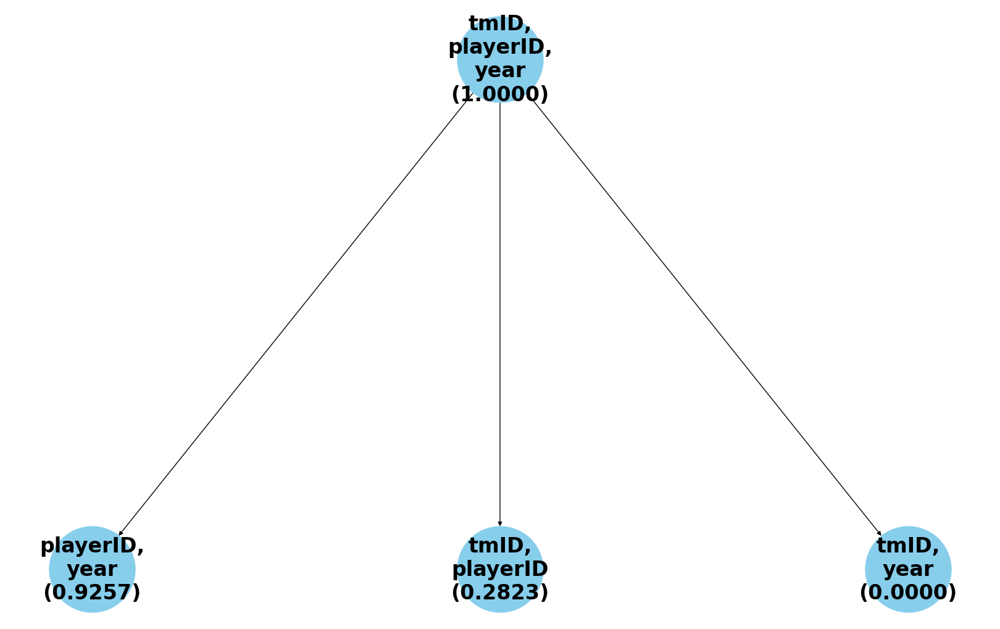

DFS subkey graph
{('playerID', 'year', 'tmID'): 1.0, ('playerID', 'year'): 0.9257, ('playerID', 'tmID'): 0.2823, ('year', 'tmID'): 0.0, ('playerID',): 0.11, ('year',): 0.0, ('tmID',): 0.0, 'φ': 0}
sub_ratio:  {('playerID', 'year', 'tmID'): 1.0, ('playerID', 'year'): 0.9257, ('playerID', 'tmID'): 0.2823, ('year', 'tmID'): 0.0}
grouped_sorted_data:  [[('playerID', 'year', 'tmID')], [('playerID', 'year'), ('playerID', 'tmID'), ('year', 'tmID')]]


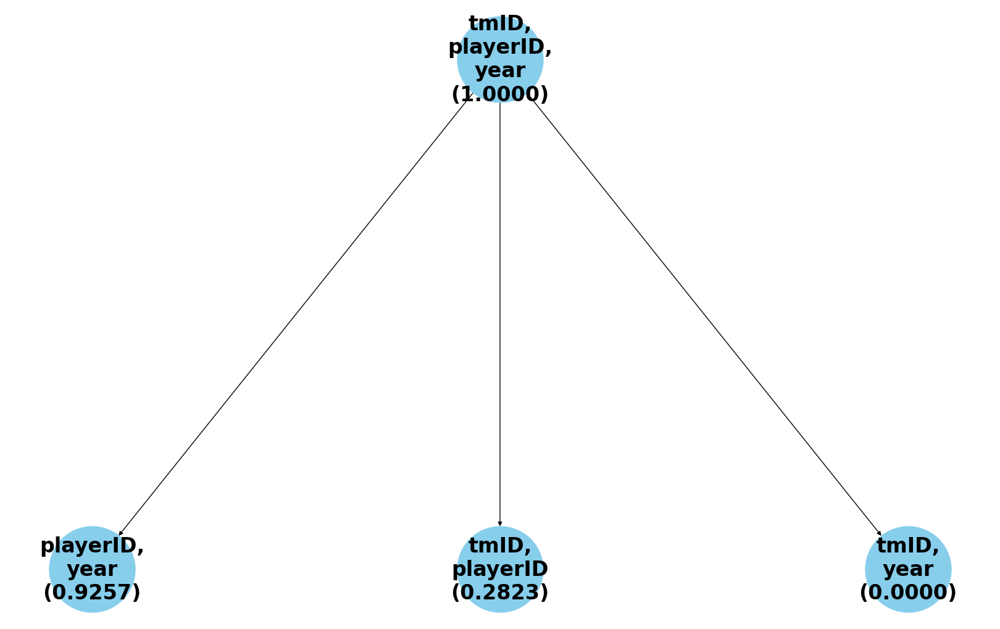

{3: 0.0429, 2: 0.018266666666666667, 1: 0.004725}


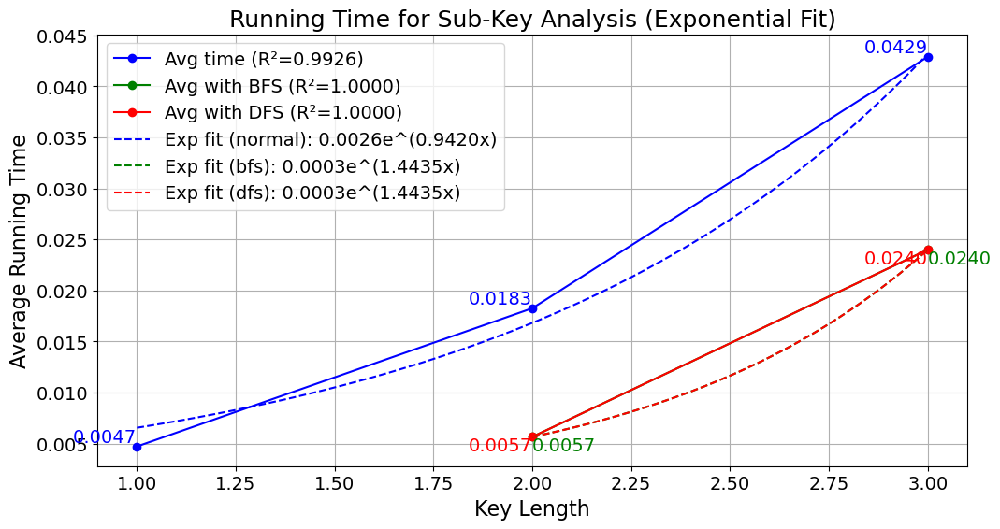


Current column set: ('playerID', 'year', 'stint'), Completeness Ratio: 1.0
Normal subkey graph


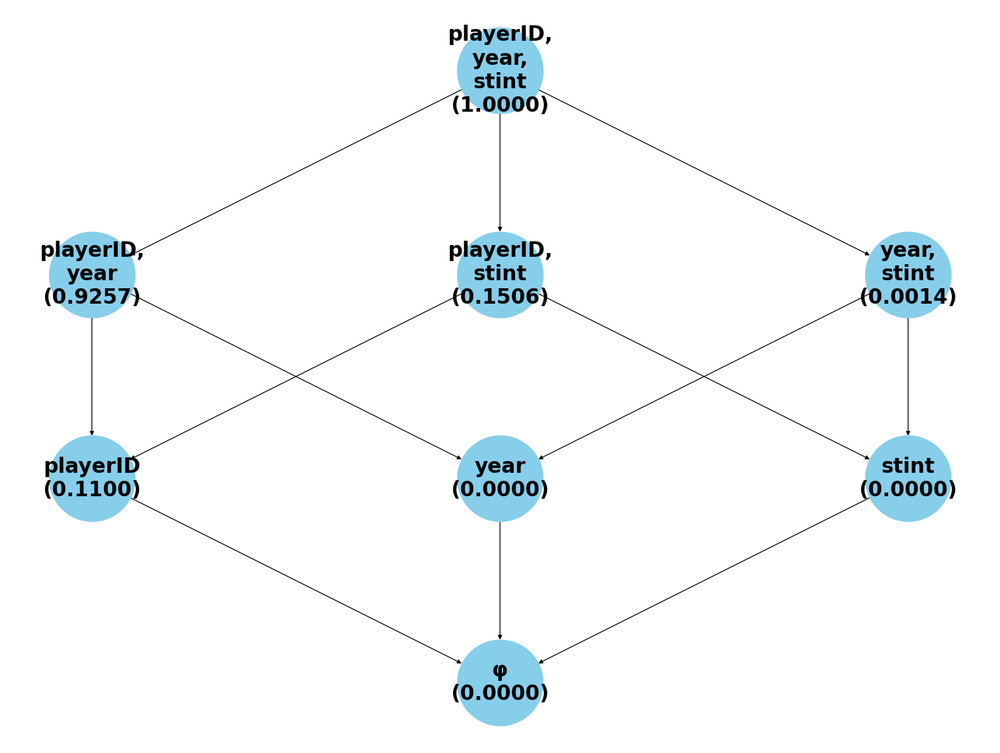

BFS subkey graph


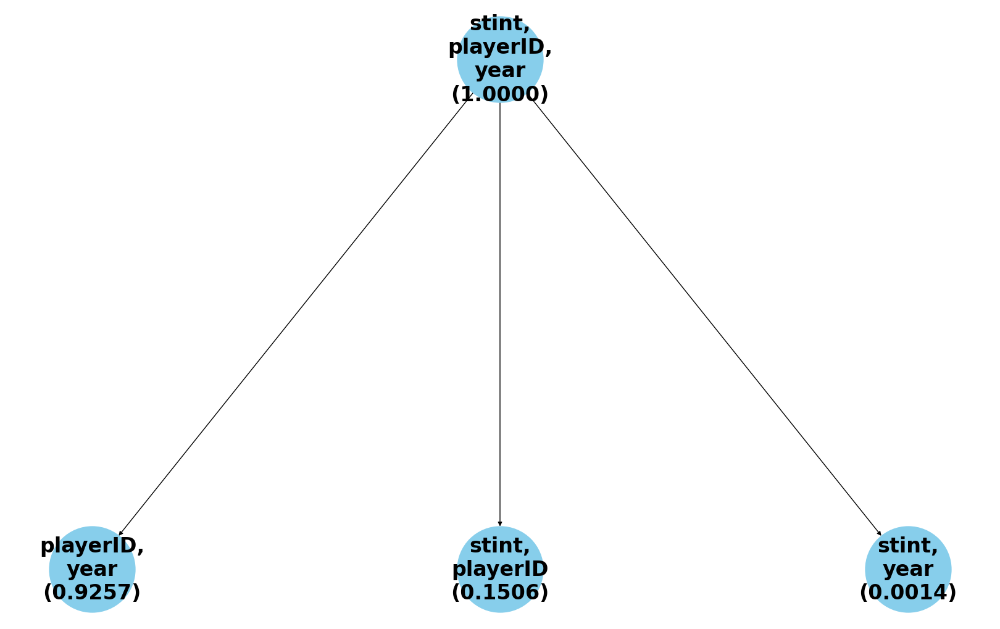

DFS subkey graph
{('playerID', 'year', 'stint'): 1.0, ('playerID', 'year'): 0.9257, ('playerID', 'stint'): 0.1506, ('year', 'stint'): 0.0014, ('playerID',): 0.11, ('year',): 0.0, ('stint',): 0.0, 'φ': 0}
sub_ratio:  {('playerID', 'year', 'stint'): 1.0, ('playerID', 'year'): 0.9257, ('playerID', 'stint'): 0.1506, ('year', 'stint'): 0.0014}
grouped_sorted_data:  [[('playerID', 'year', 'stint')], [('playerID', 'year'), ('playerID', 'stint'), ('year', 'stint')]]


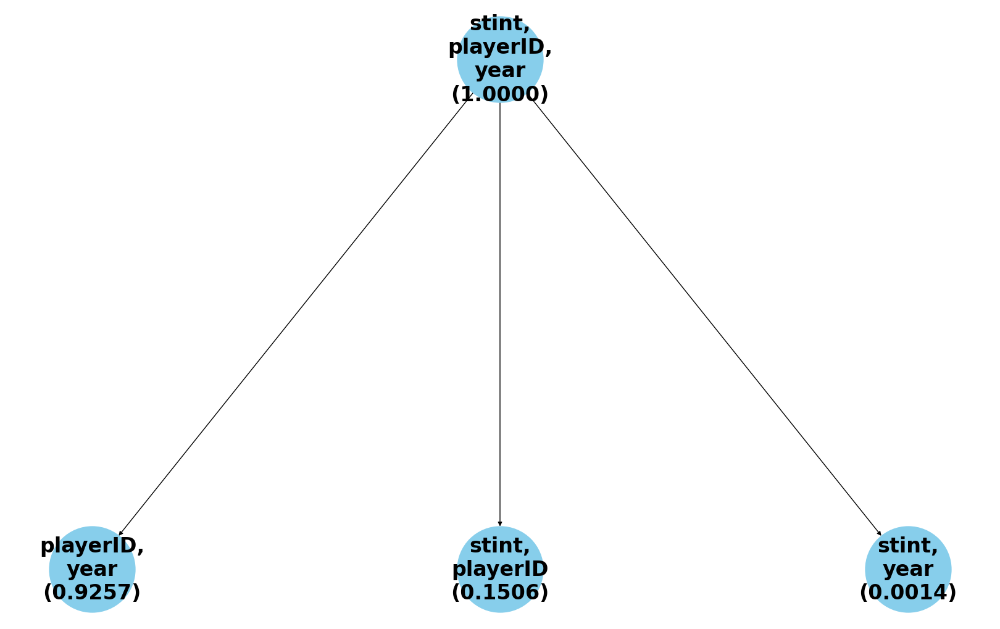

{3: 0.0429, 2: 0.019266666666666665, 1: 0.0052250000000000005}


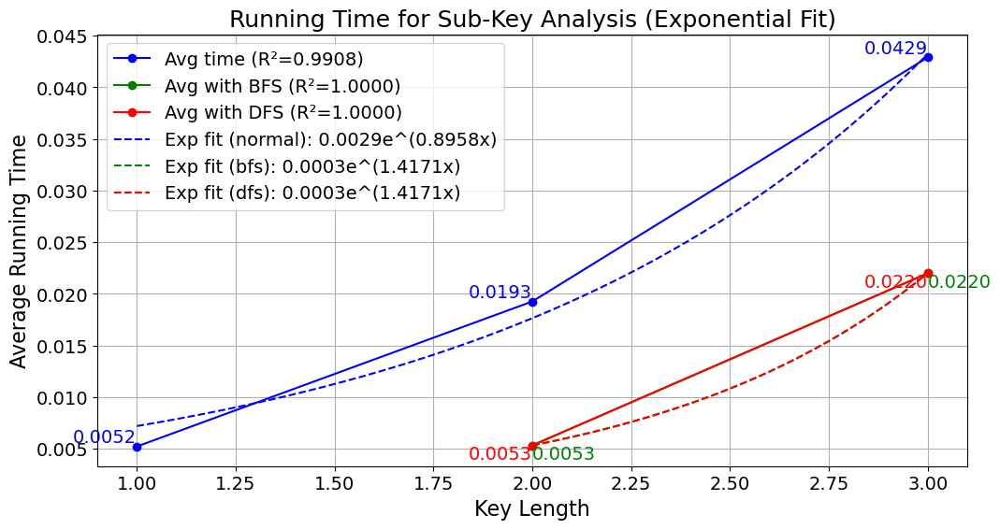

In [18]:
# ScoringShootout
near_key_list=[
    ('playerID','year','tmID'),
    ('playerID','year','stint')
]
main('runTime_data/ScoringShootout_data.csv', near_key_list)


Current column set: ('playerID', 'year'), Completeness Ratio: 1.0
Normal subkey graph


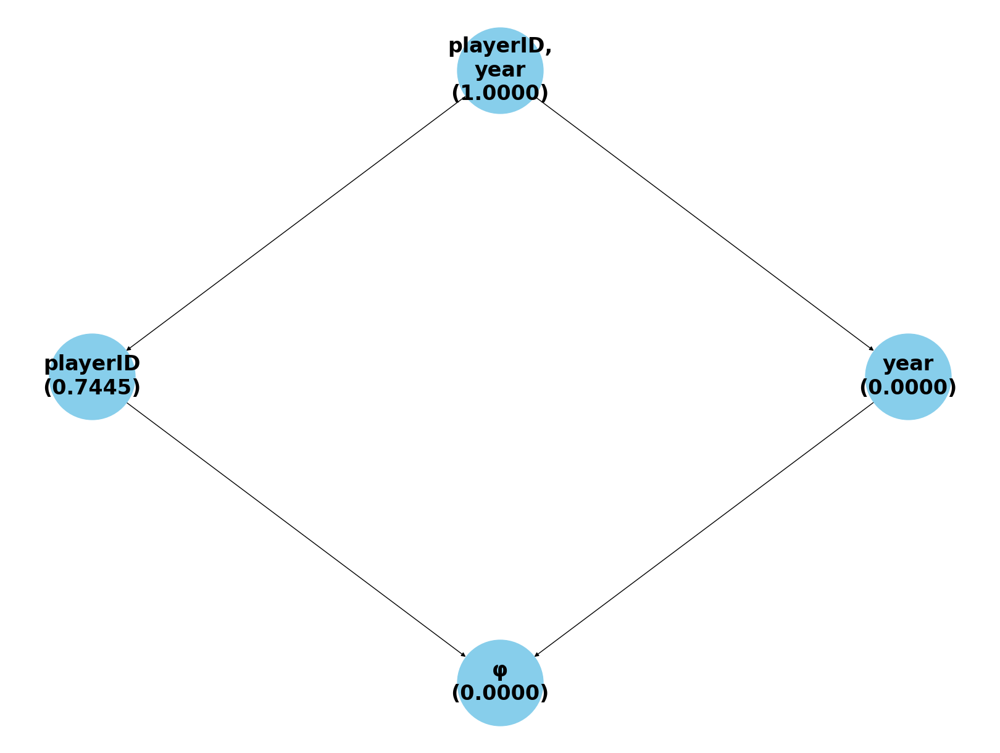

BFS subkey graph


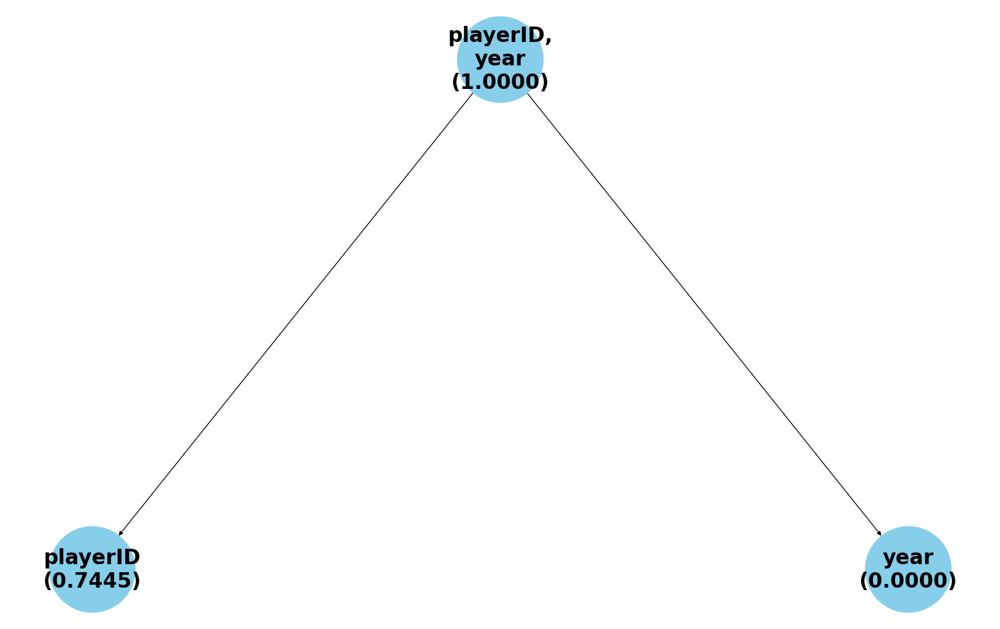

DFS subkey graph
{('playerID', 'year'): 1.0, ('playerID',): 0.7445, ('year',): 0.0, 'φ': 0}
sub_ratio:  {('playerID', 'year'): 1.0, ('playerID',): 0.7445, ('year',): 0.0}
grouped_sorted_data:  [[('playerID', 'year')], [('playerID',), ('year',)]]


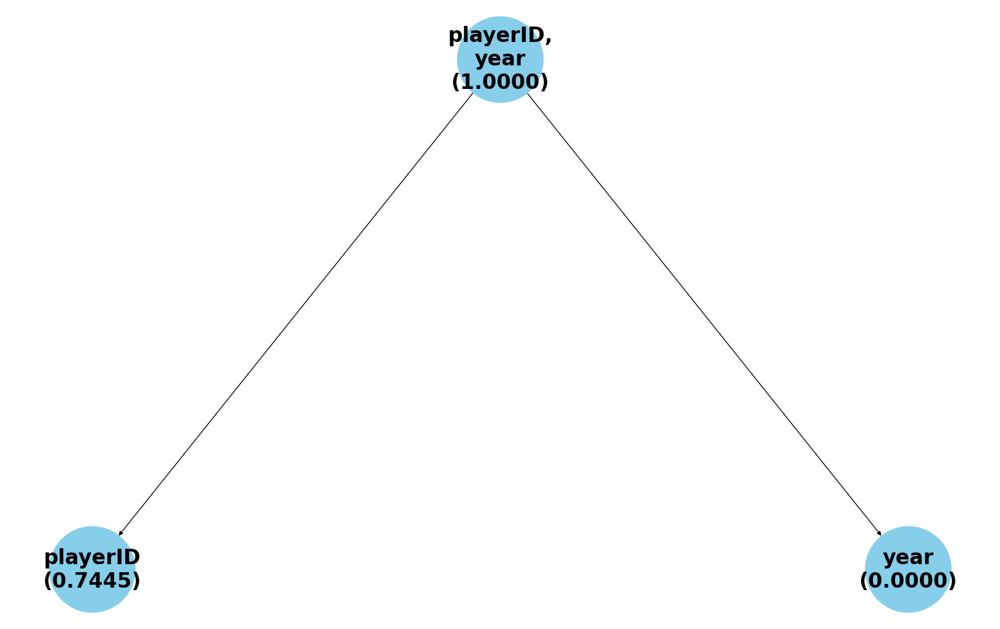

{2: 0.01, 1: 0.0030000000000000005}


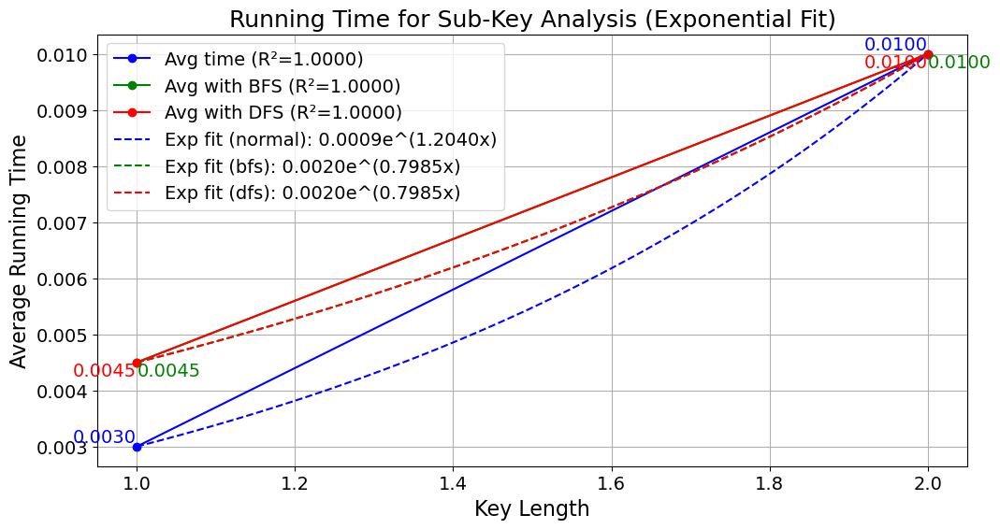

In [19]:
# ScoringSup
near_key_list=[
    ('playerID','year')
]
main('runTime_data/ScoringSup_data.csv', near_key_list)


Current column set: ('year', 'series'), Completeness Ratio: 0.8882
Normal subkey graph


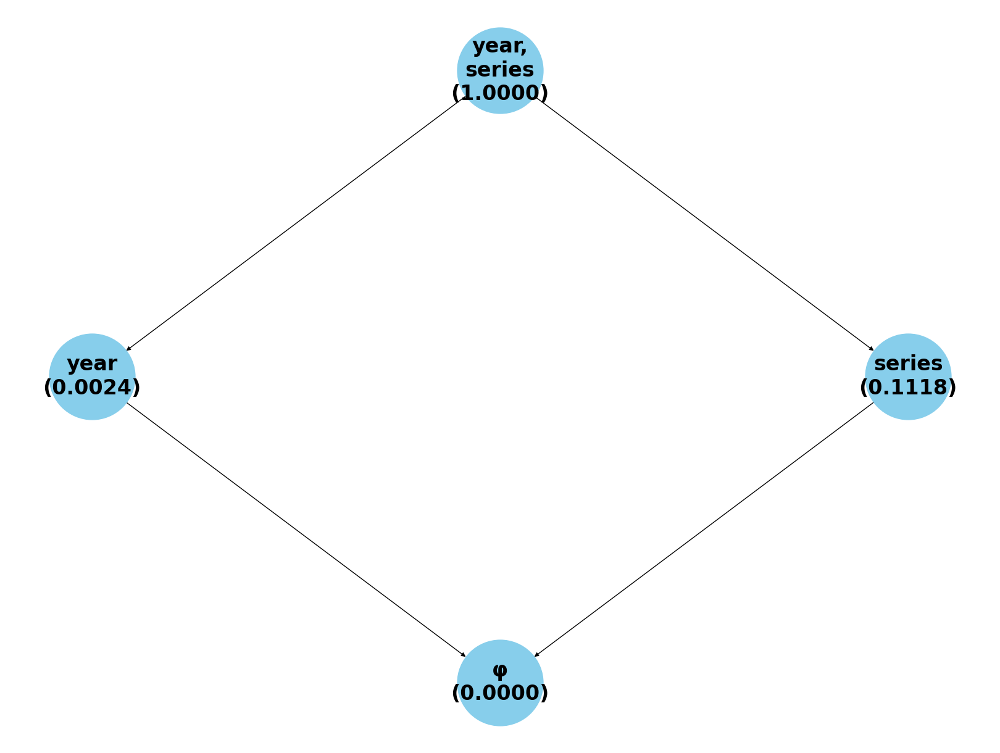

BFS subkey graph


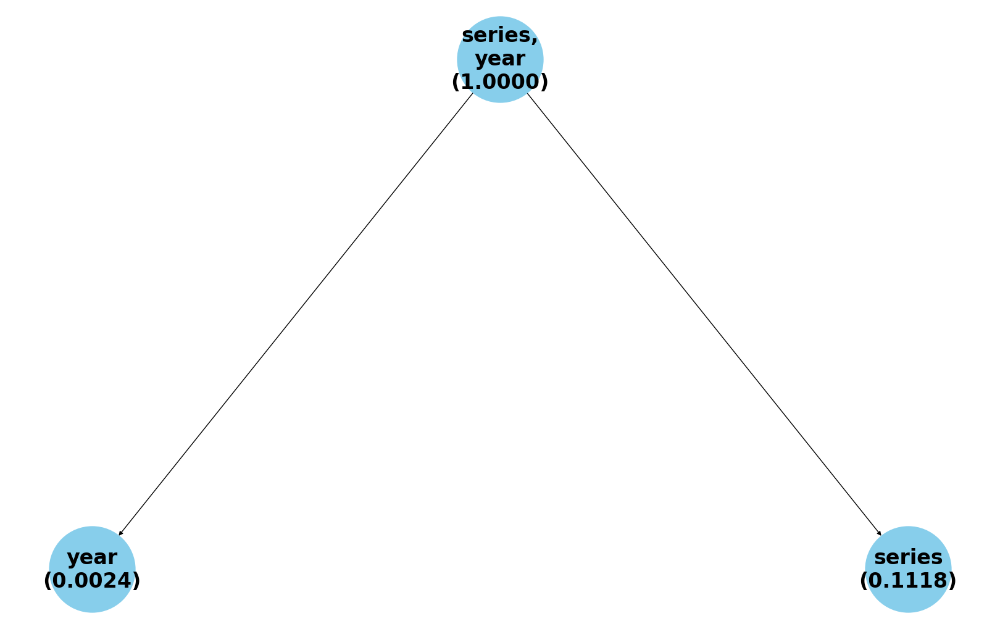

DFS subkey graph
{('year', 'series'): 1.0, ('year',): 0.0024, ('series',): 0.1118, 'φ': 0}
sub_ratio:  {('year', 'series'): 1.0, ('year',): 0.0024, ('series',): 0.1118}
grouped_sorted_data:  [[('year', 'series')], [('year',), ('series',)]]


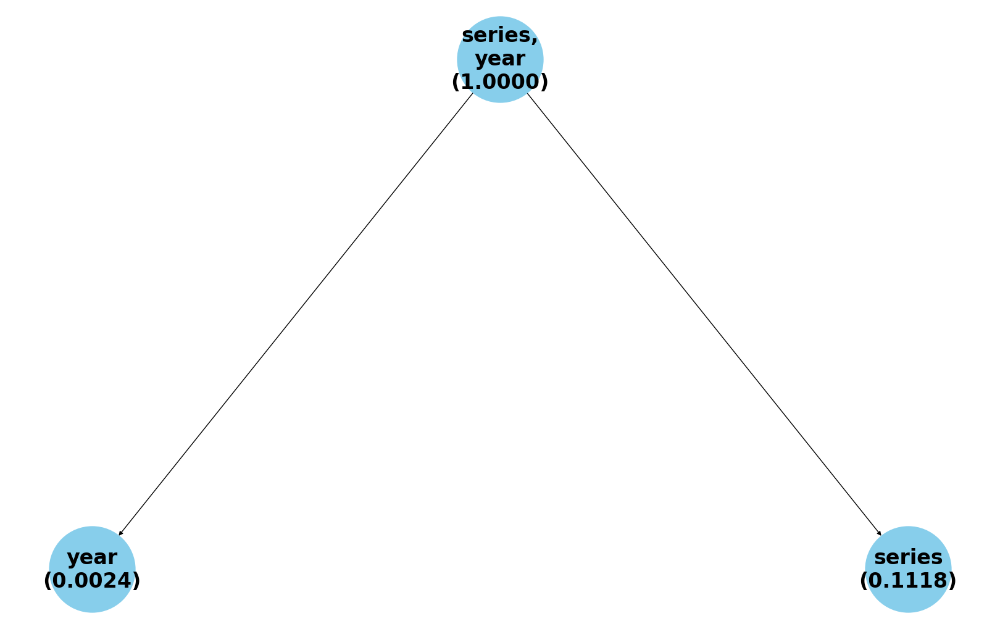

{2: 0.005, 1: 0.001}


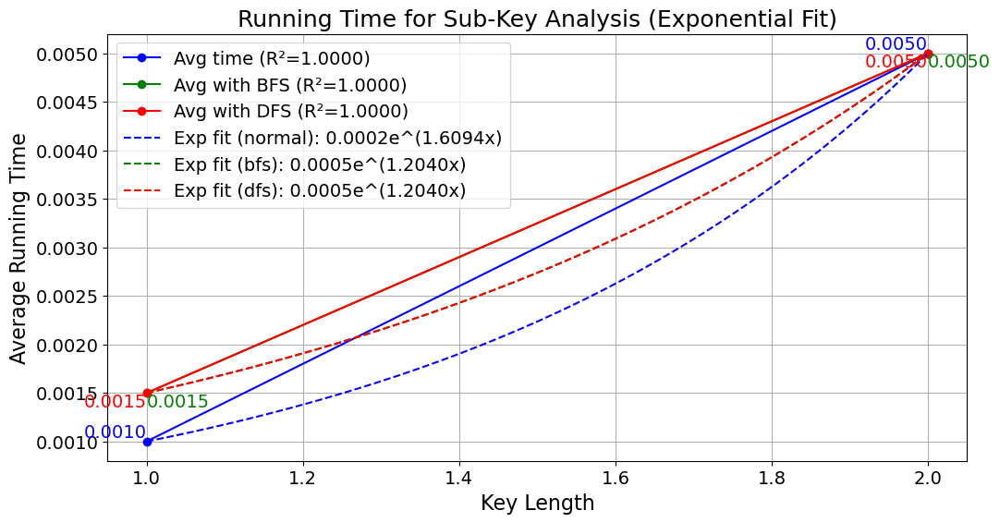


Current column set: ('year', 'tmIDWinner', 'tmIDLoser'), Completeness Ratio: 1.0
Normal subkey graph


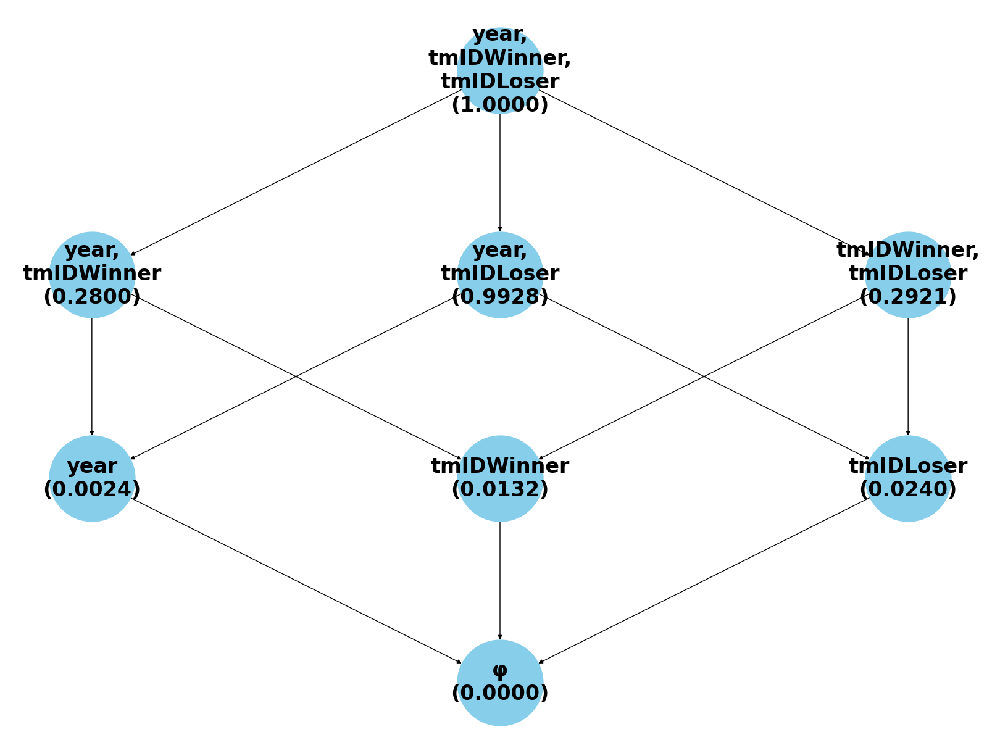

BFS subkey graph


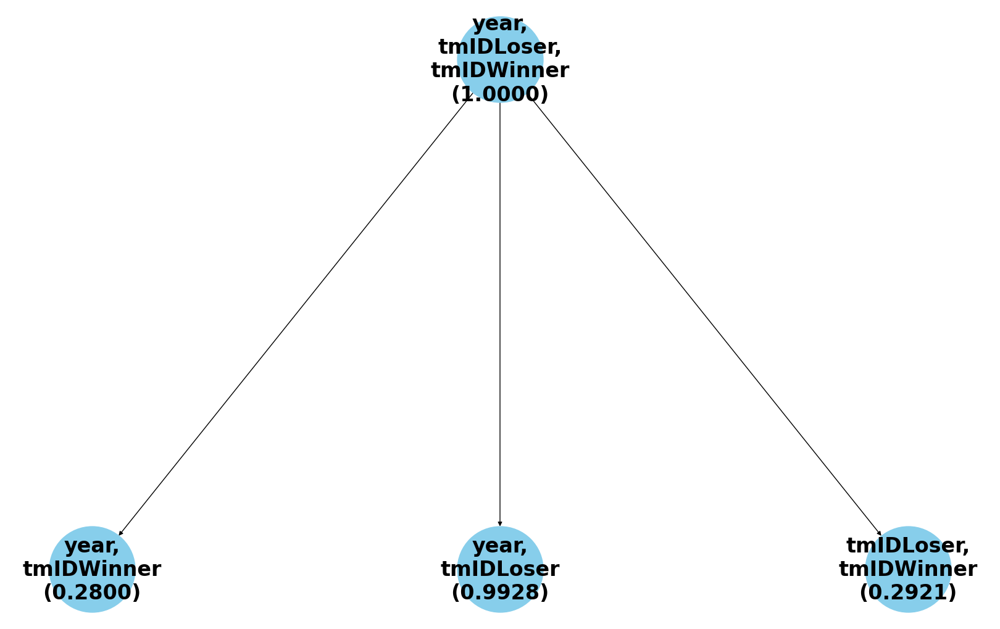

DFS subkey graph
{('year', 'tmIDWinner', 'tmIDLoser'): 1.0, ('year', 'tmIDWinner'): 0.28, ('year', 'tmIDLoser'): 0.9928, ('tmIDWinner', 'tmIDLoser'): 0.2921, ('year',): 0.0024, ('tmIDWinner',): 0.0132, ('tmIDLoser',): 0.024, 'φ': 0}
sub_ratio:  {('year', 'tmIDWinner', 'tmIDLoser'): 1.0, ('year', 'tmIDWinner'): 0.28, ('year', 'tmIDLoser'): 0.9928, ('tmIDWinner', 'tmIDLoser'): 0.2921, ('year',): 0.0024, ('tmIDLoser',): 0.024}
grouped_sorted_data:  [[('year', 'tmIDWinner', 'tmIDLoser')], [('year', 'tmIDWinner'), ('year', 'tmIDLoser'), ('tmIDWinner', 'tmIDLoser')], [('year',), ('tmIDLoser',)]]


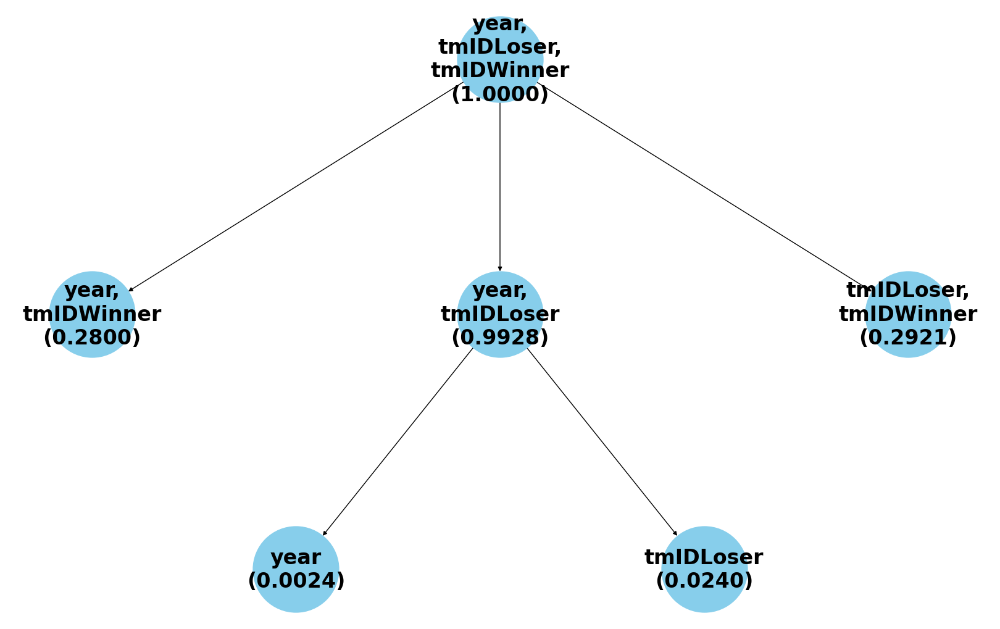

{3: 0.014, 2: 0.005999999999999999, 1: 0.0015}


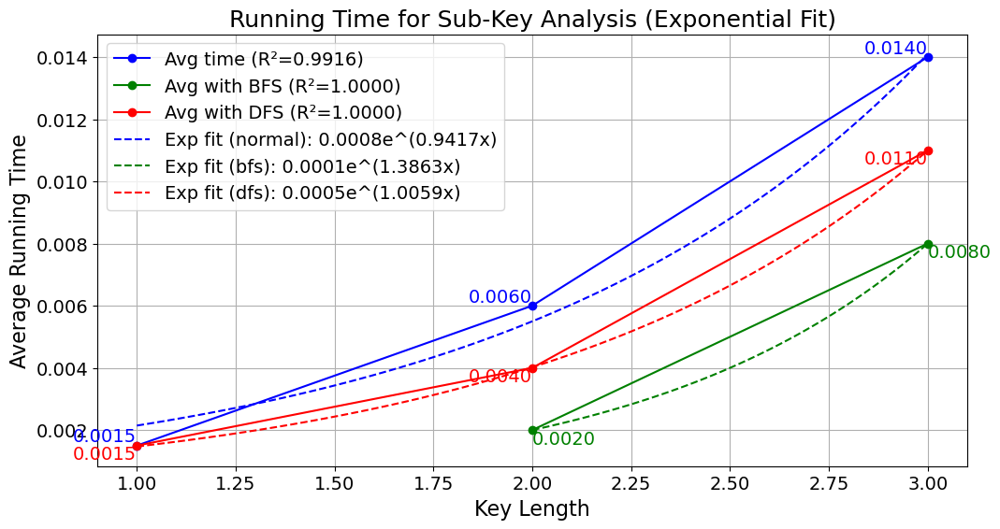

In [20]:
# SeriesPost
near_key_list=[
    ('year','tmIDWinner','tmIDLoser'),
    ('year','series')
]
main('runTime_data/SeriesPost_data.csv', near_key_list)


Current column set: ('year', 'tmID'), Completeness Ratio: 1.0
Normal subkey graph


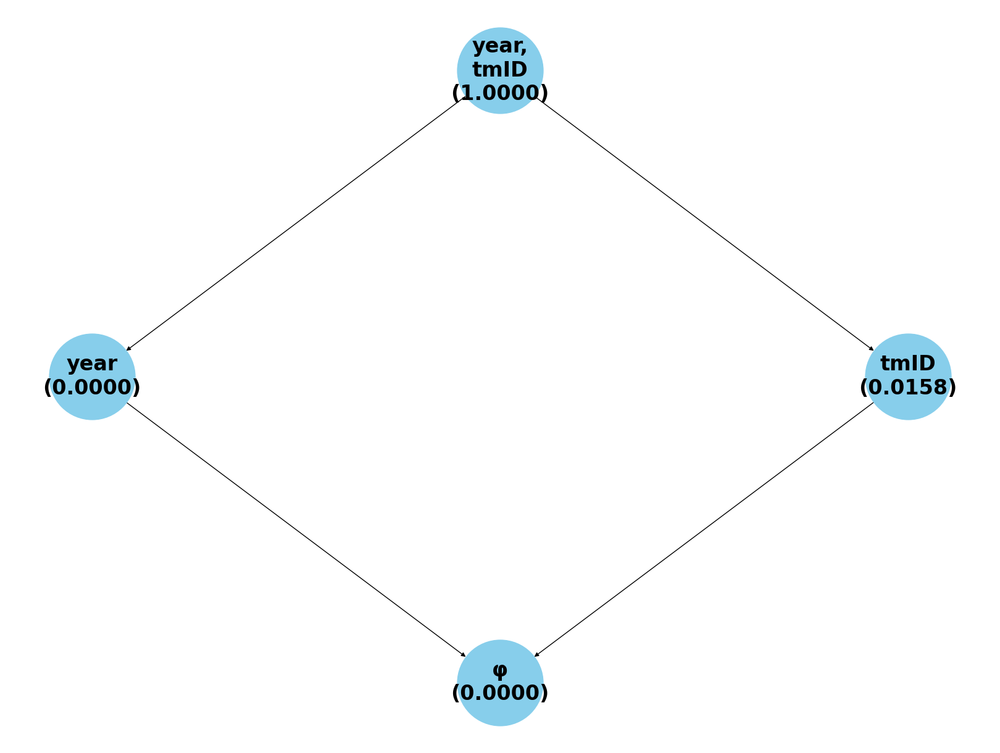

BFS subkey graph


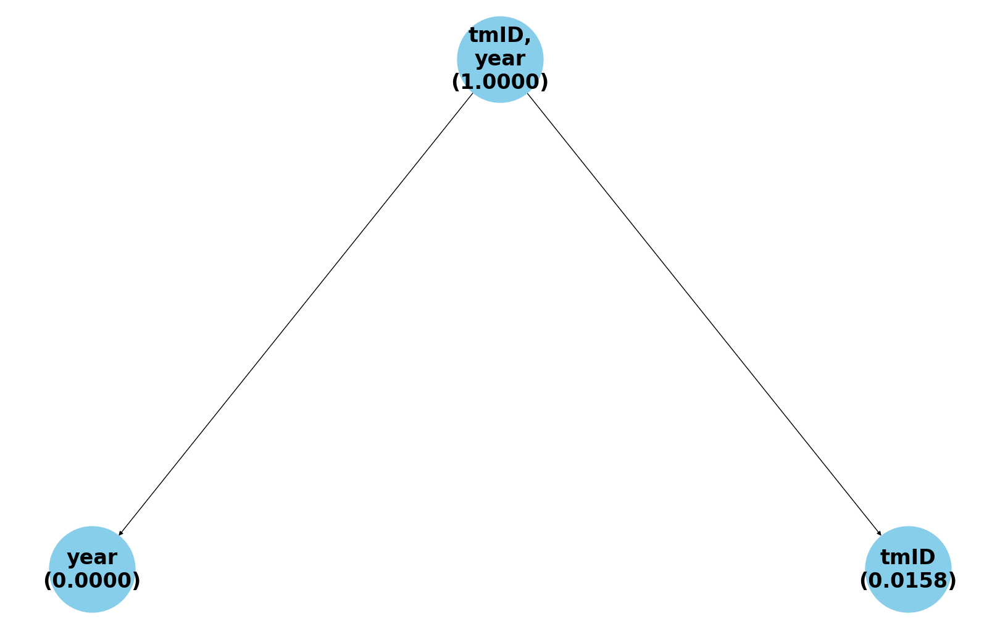

DFS subkey graph
{('year', 'tmID'): 1.0, ('year',): 0.0, ('tmID',): 0.0158, 'φ': 0}
sub_ratio:  {('year', 'tmID'): 1.0, ('year',): 0.0, ('tmID',): 0.0158}
grouped_sorted_data:  [[('year', 'tmID')], [('year',), ('tmID',)]]


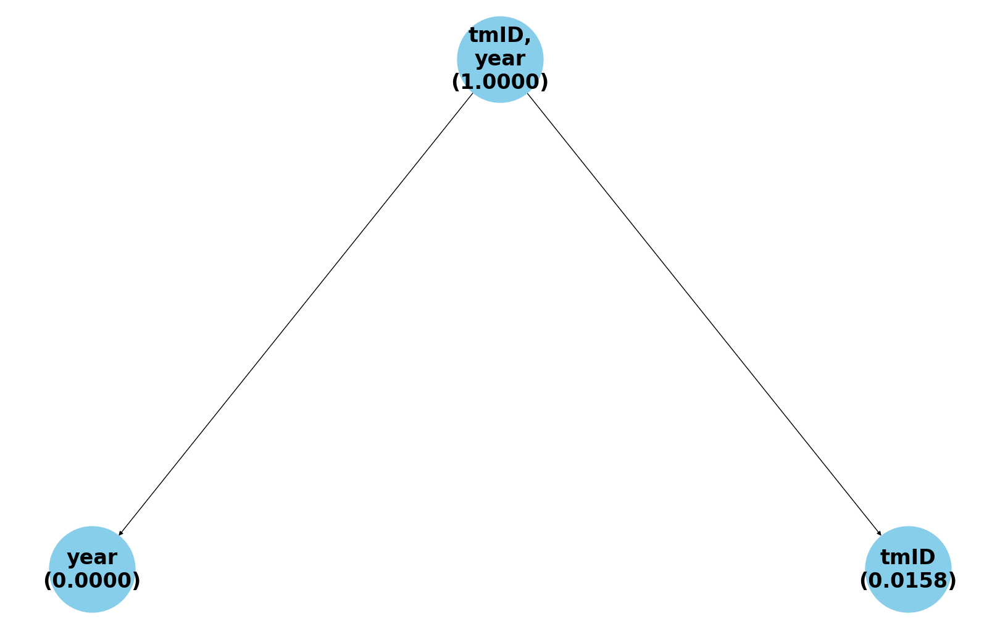

{2: 0.003, 1: 0.0006666666666666666}


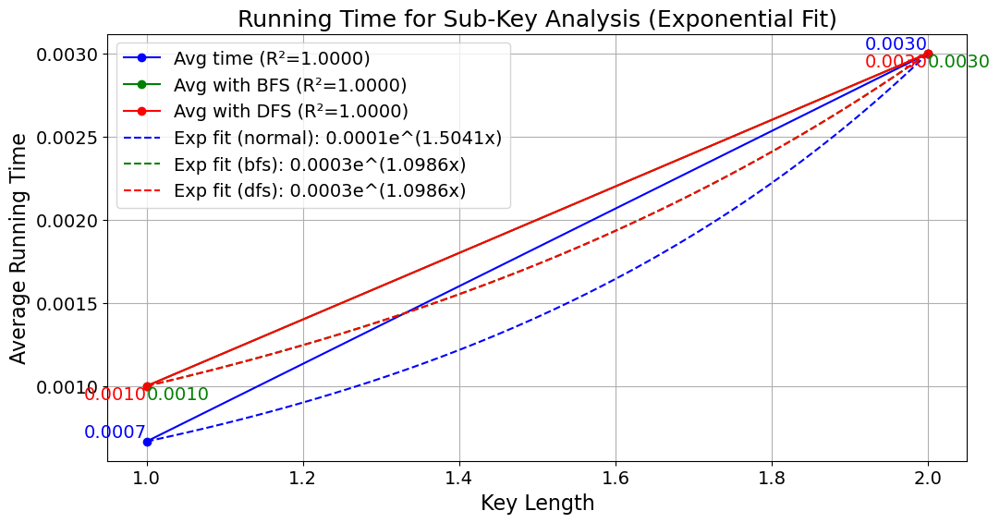

In [21]:
# Teams
near_key_list=[
    ('year', 'tmID')
]
main('runTime_data/Teams_data.csv', near_key_list)


Current column set: ('year', 'tmID', 'half'), Completeness Ratio: 1.0
Normal subkey graph


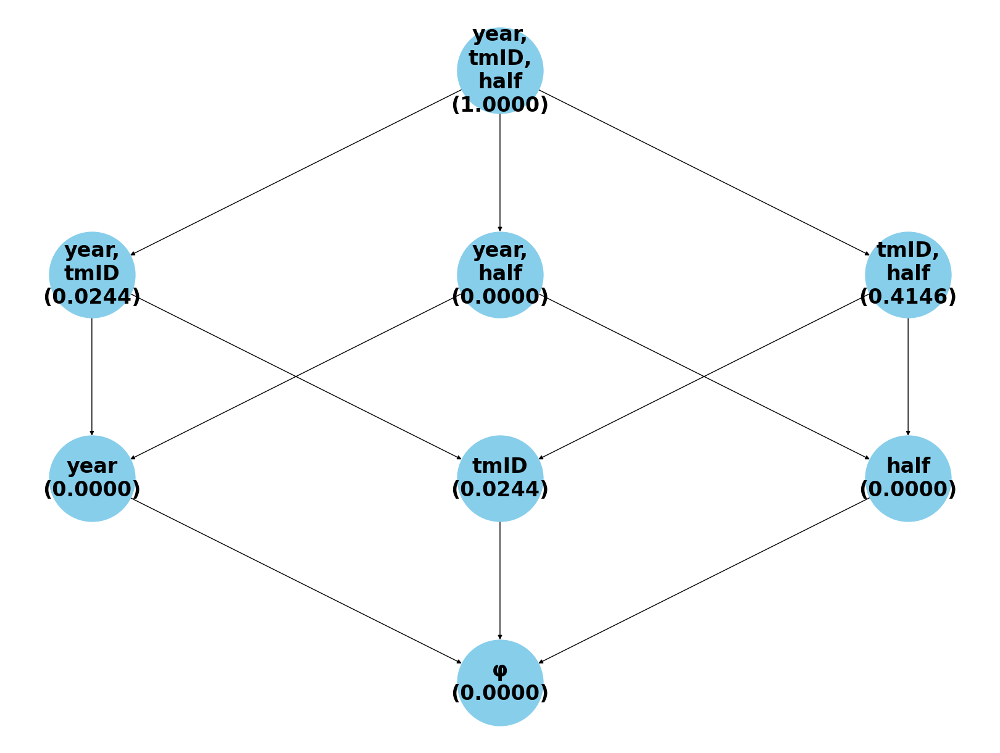

BFS subkey graph


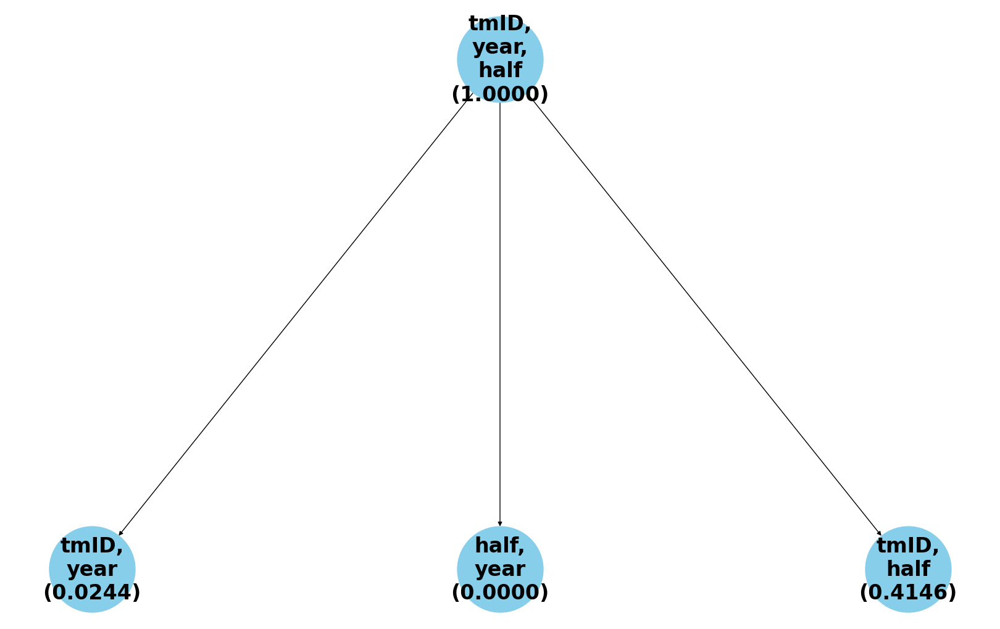

DFS subkey graph
{('year', 'tmID', 'half'): 1.0, ('year', 'tmID'): 0.0244, ('year', 'half'): 0.0, ('tmID', 'half'): 0.4146, ('year',): 0.0, ('tmID',): 0.0244, ('half',): 0.0, 'φ': 0}
sub_ratio:  {('year', 'tmID', 'half'): 1.0, ('year', 'tmID'): 0.0244, ('year', 'half'): 0.0, ('tmID', 'half'): 0.4146}
grouped_sorted_data:  [[('year', 'tmID', 'half')], [('year', 'tmID'), ('year', 'half'), ('tmID', 'half')]]


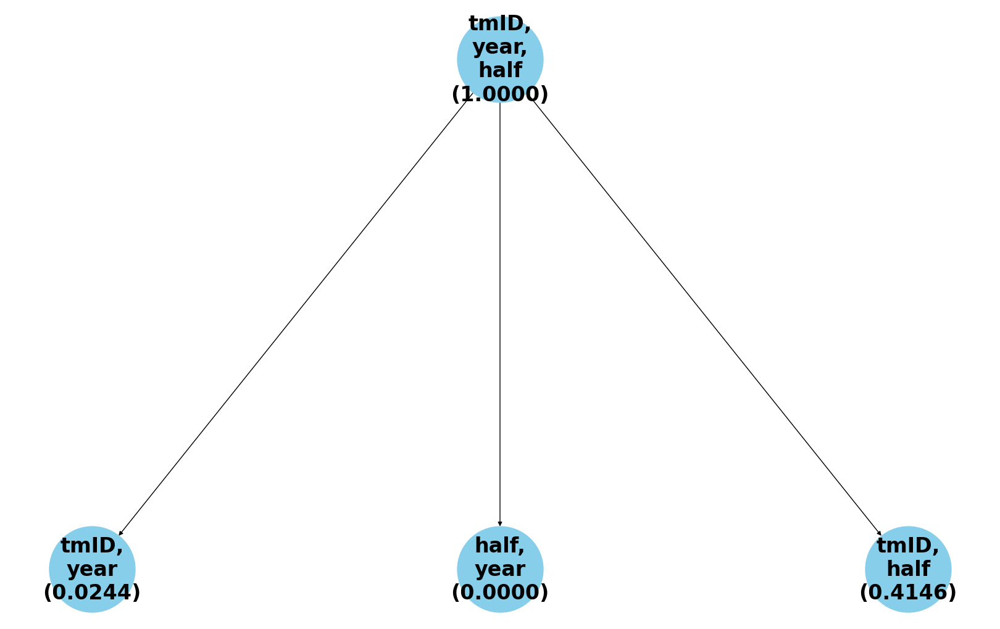

{3: 0.009, 2: 0.005666666666666667, 1: 0.002}


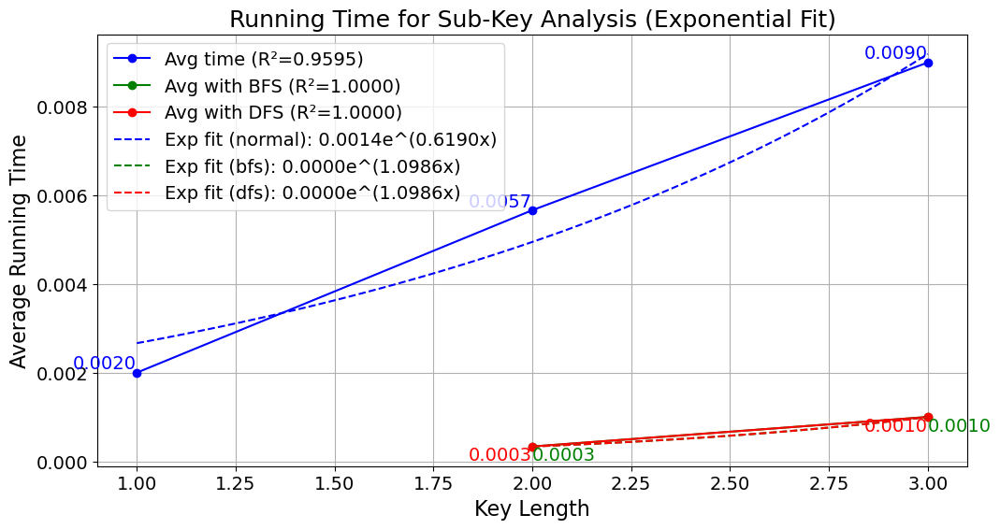


Current column set: ('year', 'half', 'rank'), Completeness Ratio: 1.0
Normal subkey graph


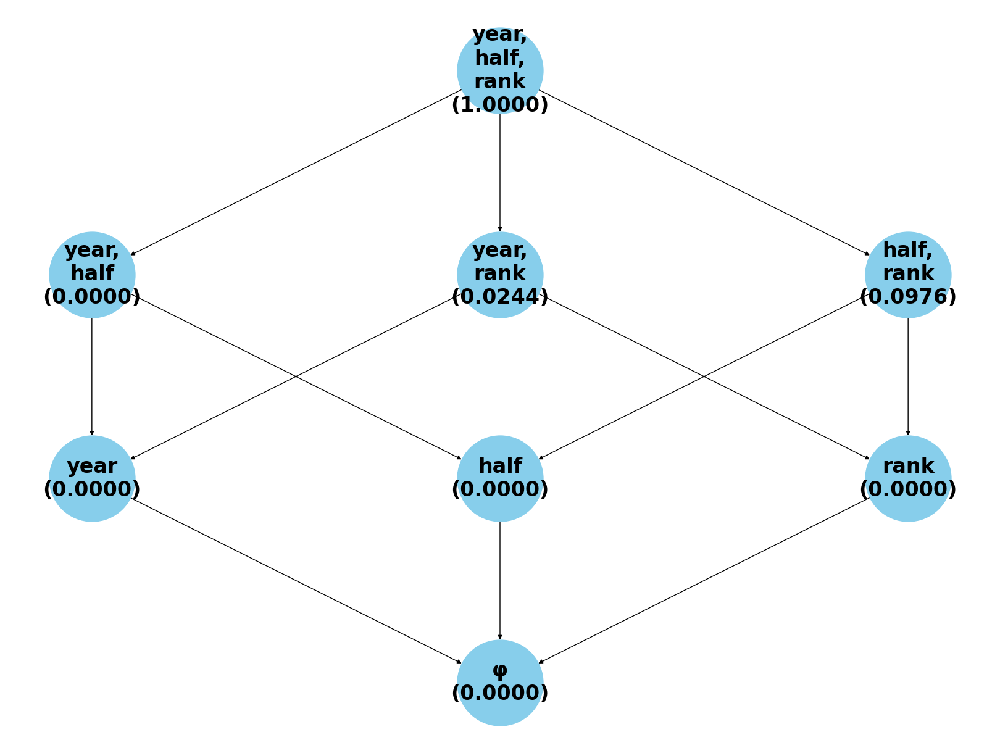

BFS subkey graph


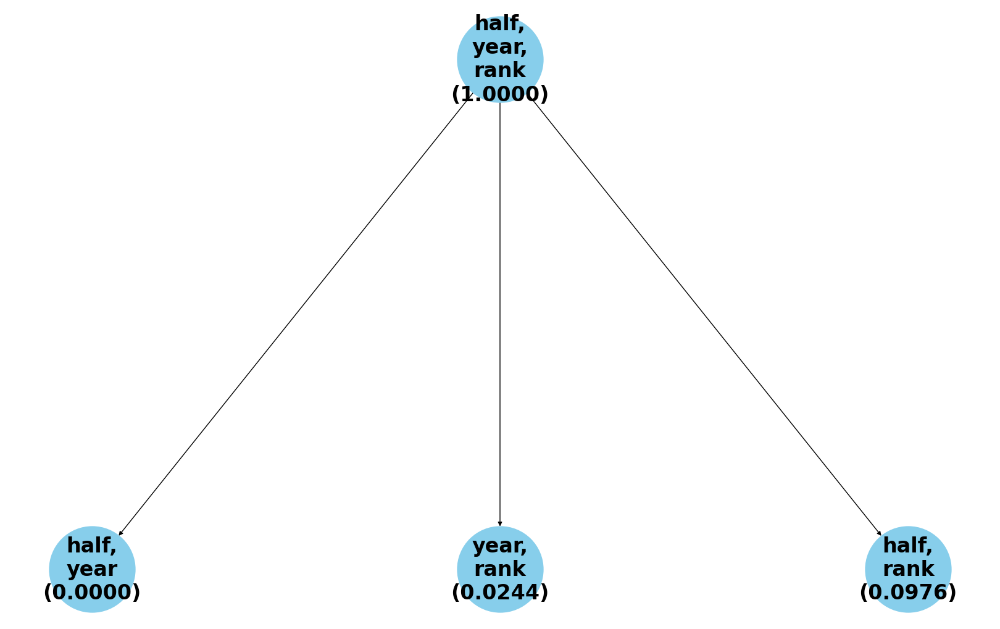

DFS subkey graph
{('year', 'half', 'rank'): 1.0, ('year', 'half'): 0.0, ('year', 'rank'): 0.0244, ('half', 'rank'): 0.0976, ('year',): 0.0, ('half',): 0.0, ('rank',): 0.0, 'φ': 0}
sub_ratio:  {('year', 'half', 'rank'): 1.0, ('year', 'half'): 0.0, ('year', 'rank'): 0.0244, ('half', 'rank'): 0.0976}
grouped_sorted_data:  [[('year', 'half', 'rank')], [('year', 'half'), ('year', 'rank'), ('half', 'rank')]]


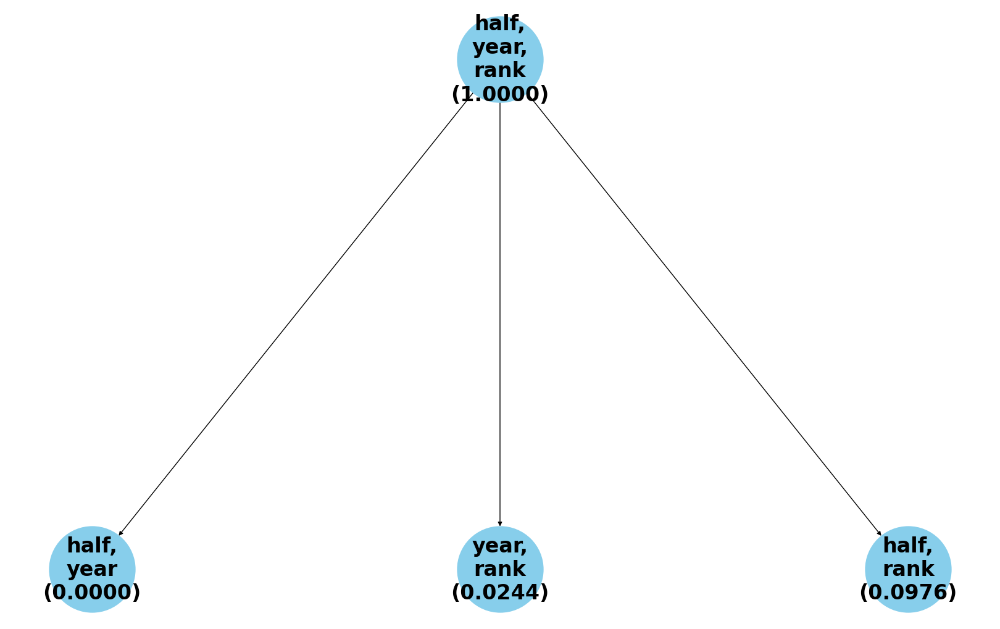

{3: 0.01, 2: 0.005666666666666667, 1: 0.002}


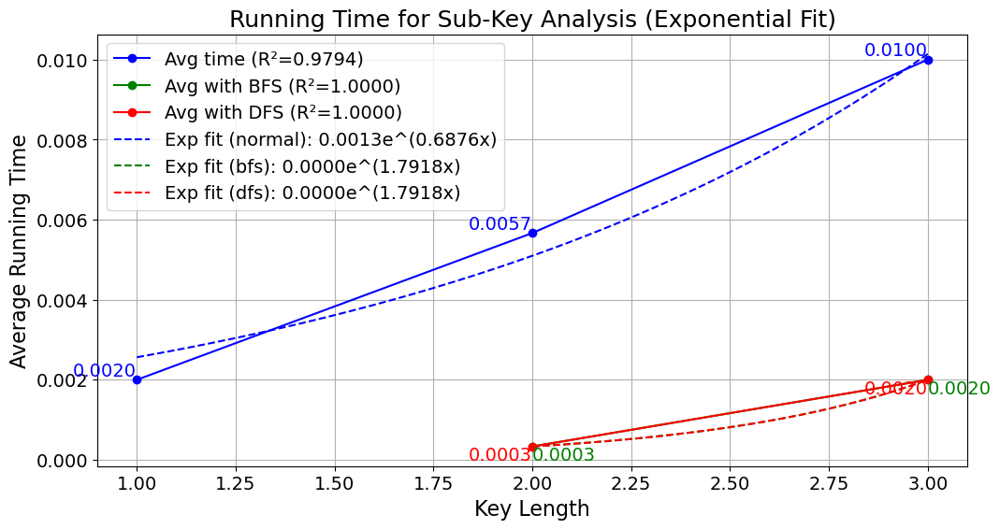

In [22]:
# TeamsHalf 
near_key_list=[
    ('year', 'tmID', 'half'),
    ('year','half','rank')
]
main('runTime_data/TeamsHalf_data.csv', near_key_list)


Current column set: ('year', 'tmID'), Completeness Ratio: 1.0
Normal subkey graph


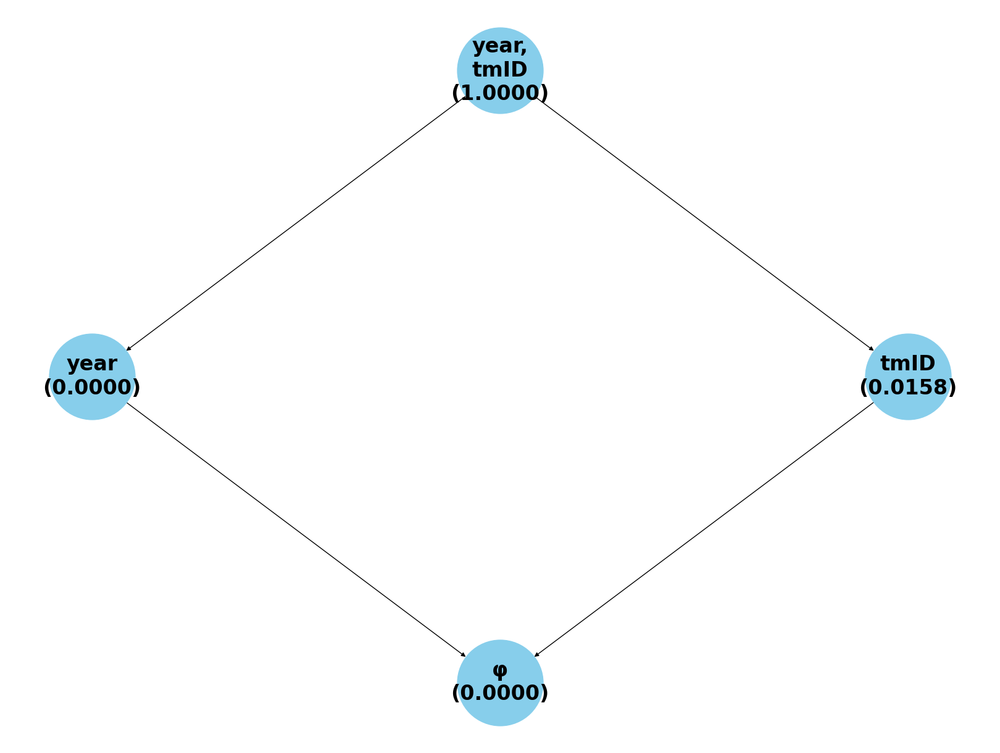

BFS subkey graph


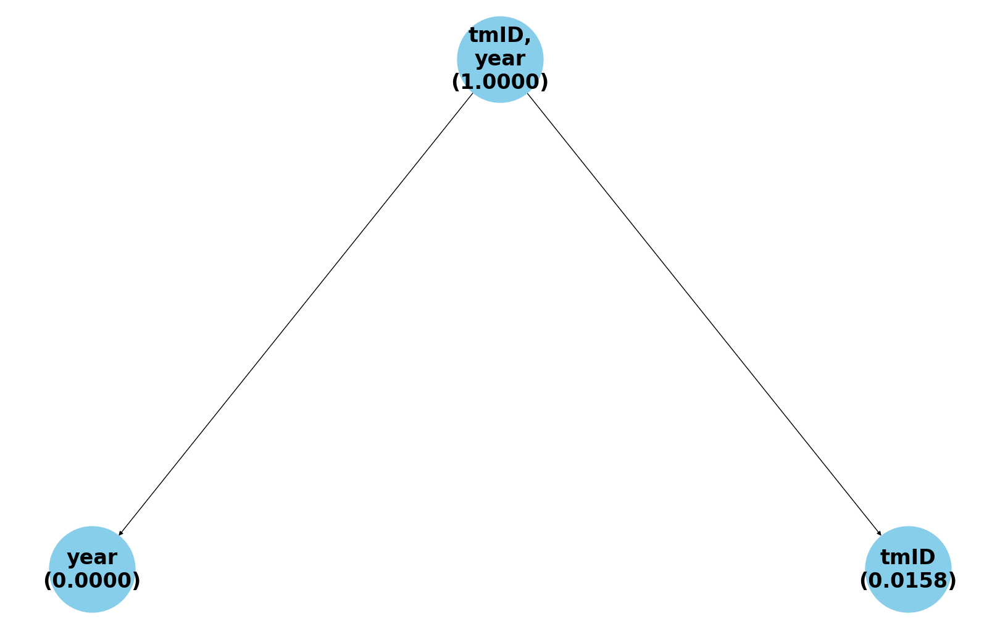

DFS subkey graph
{('year', 'tmID'): 1.0, ('year',): 0.0, ('tmID',): 0.0158, 'φ': 0}
sub_ratio:  {('year', 'tmID'): 1.0, ('year',): 0.0, ('tmID',): 0.0158}
grouped_sorted_data:  [[('year', 'tmID')], [('year',), ('tmID',)]]


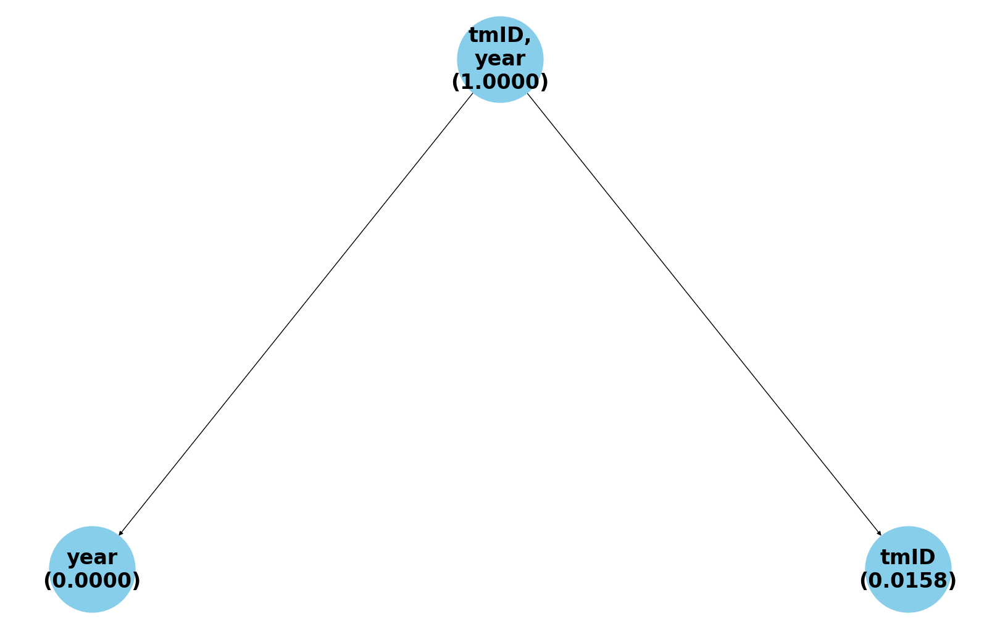

{2: 0.005, 1: 0.001}


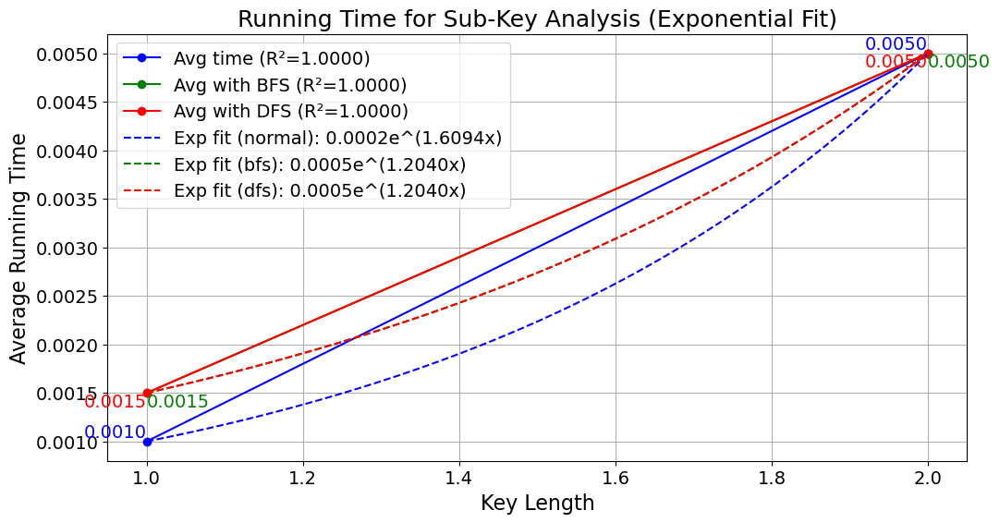

In [23]:
# TeamSplits  
near_key_list=[
    ('year', 'tmID')
]
main('runTime_data/TeamSplits_data.csv', near_key_list)


Current column set: ('year', 'tmID'), Completeness Ratio: 1.0
Normal subkey graph


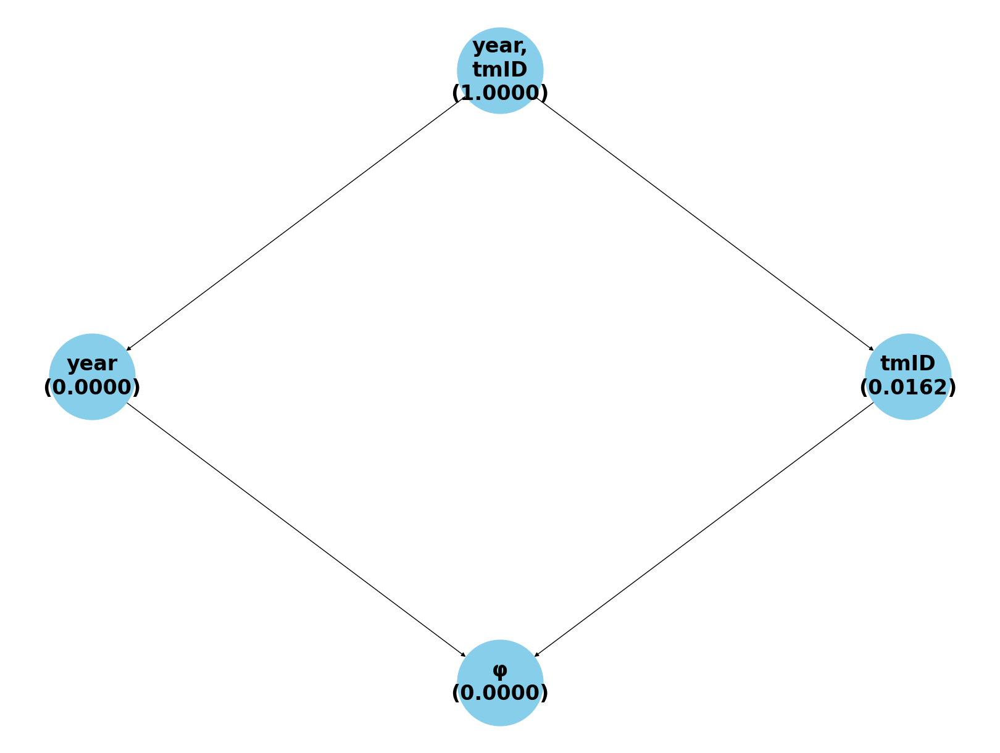

BFS subkey graph


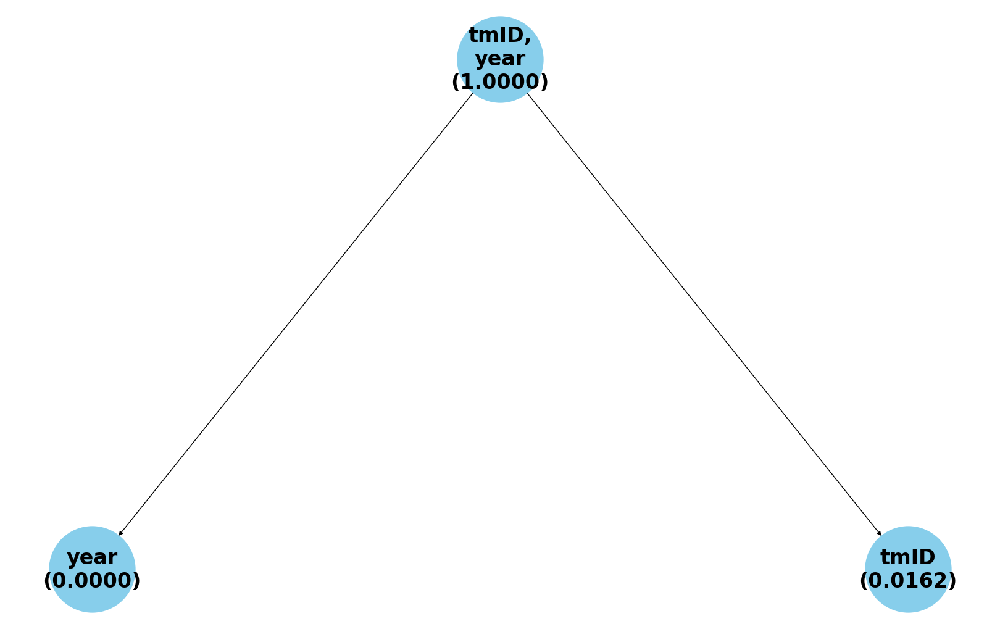

DFS subkey graph
{('year', 'tmID'): 1.0, ('year',): 0.0, ('tmID',): 0.0162, 'φ': 0}
sub_ratio:  {('year', 'tmID'): 1.0, ('year',): 0.0, ('tmID',): 0.0162}
grouped_sorted_data:  [[('year', 'tmID')], [('year',), ('tmID',)]]


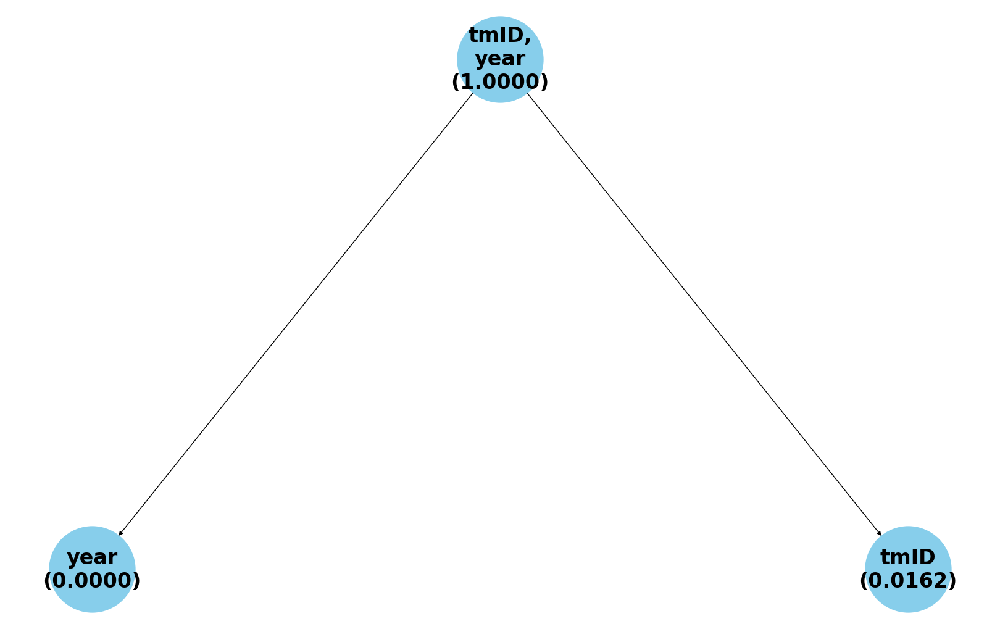

{2: 0.003, 1: 0.0006666666666666666}


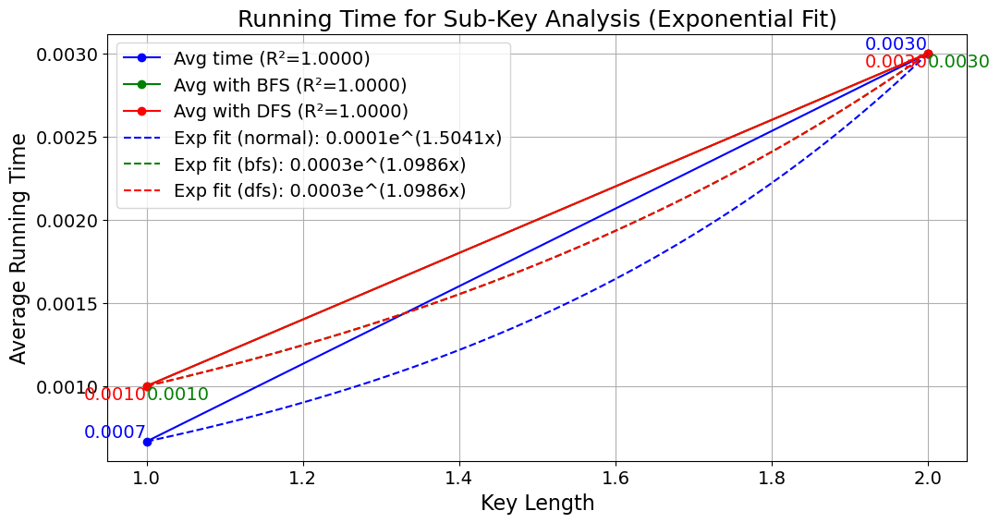

In [24]:
# TeamsPost  
near_key_list=[
    ('year', 'tmID')
]
main('runTime_data/TeamsPost_data.csv', near_key_list)


Current column set: ('year', 'tmID'), Completeness Ratio: 1.0
Normal subkey graph


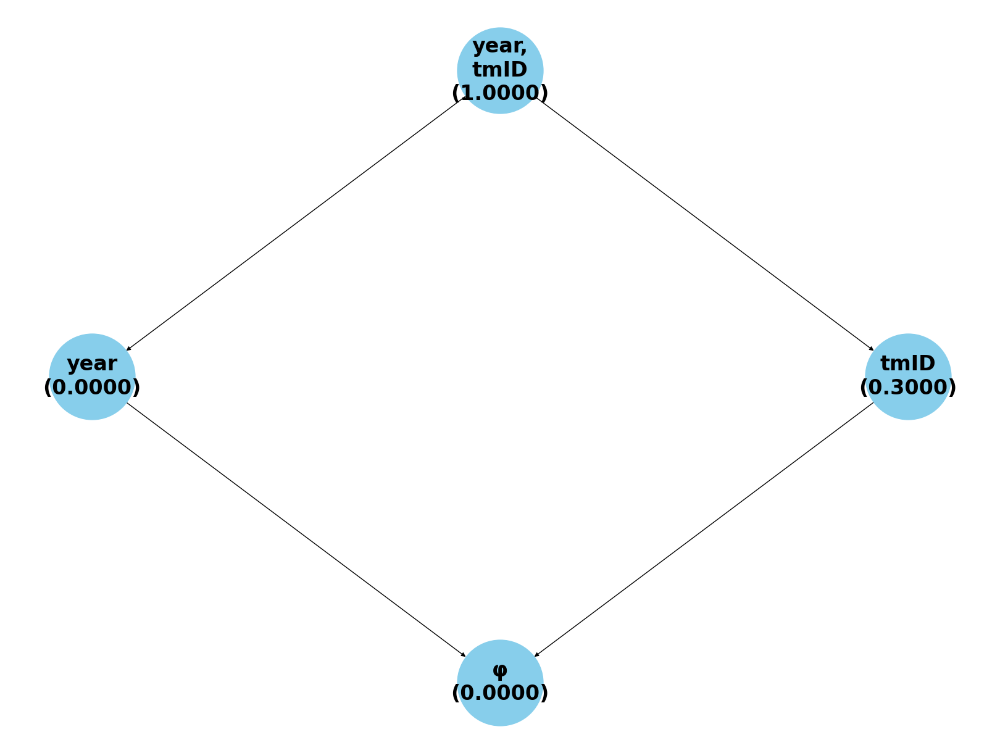

BFS subkey graph


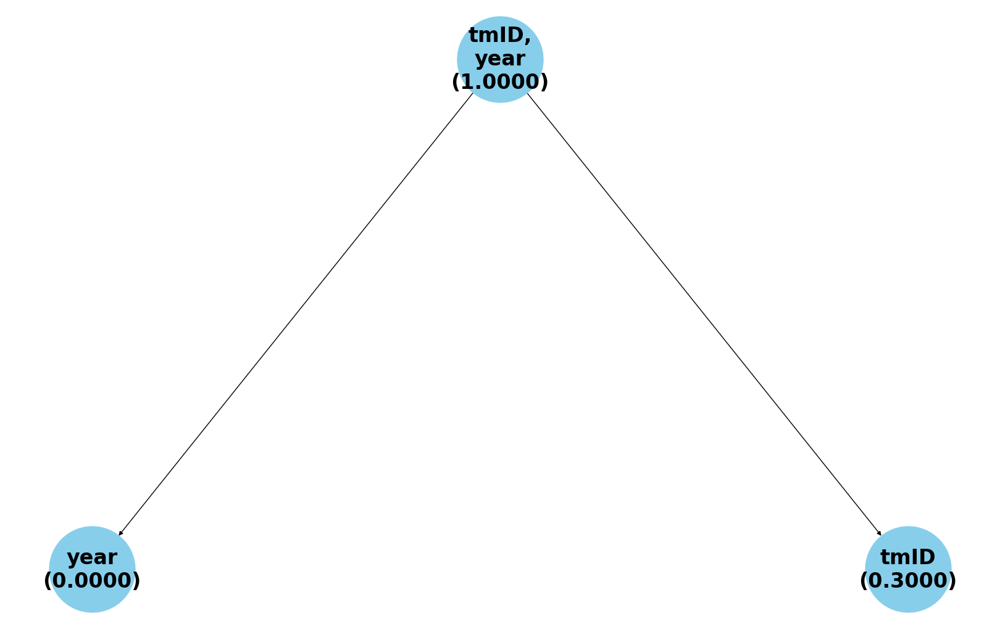

DFS subkey graph
{('year', 'tmID'): 1.0, ('year',): 0.0, ('tmID',): 0.3, 'φ': 0}
sub_ratio:  {('year', 'tmID'): 1.0, ('year',): 0.0, ('tmID',): 0.3}
grouped_sorted_data:  [[('year', 'tmID')], [('year',), ('tmID',)]]


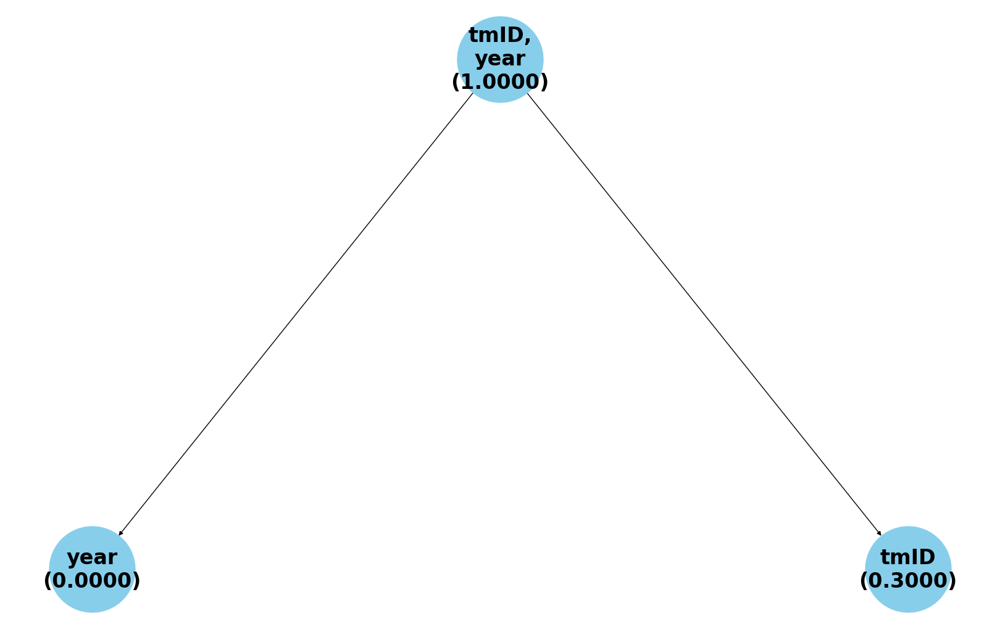

{2: 0.009, 1: 0.0030000000000000005}


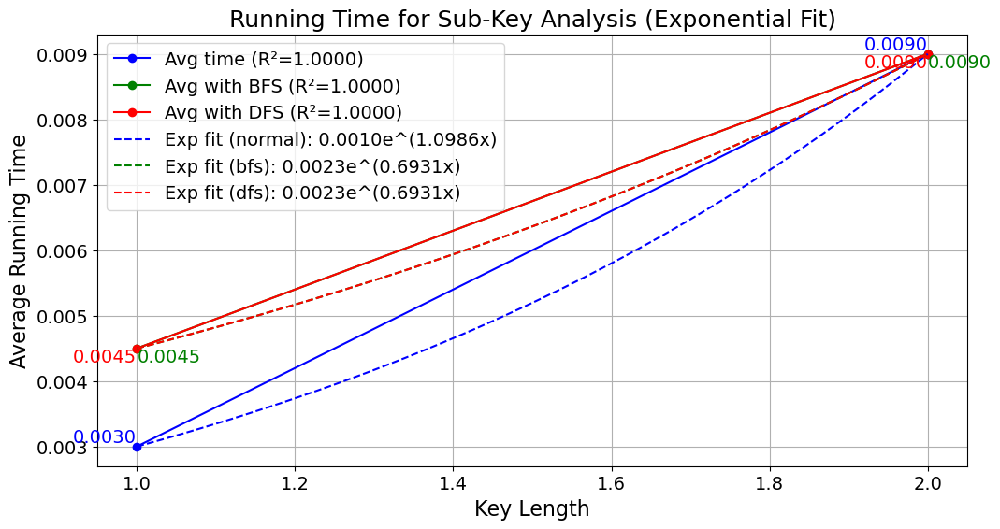


Current column set: ('year', 'lgID'), Completeness Ratio: 1.0
Normal subkey graph


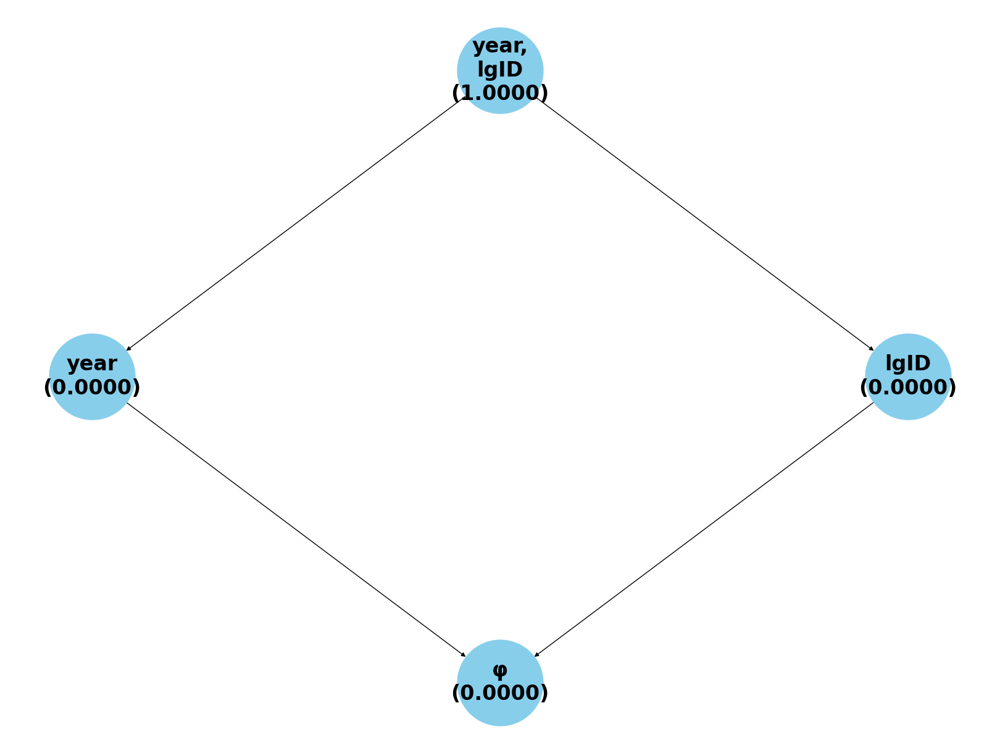

BFS subkey graph


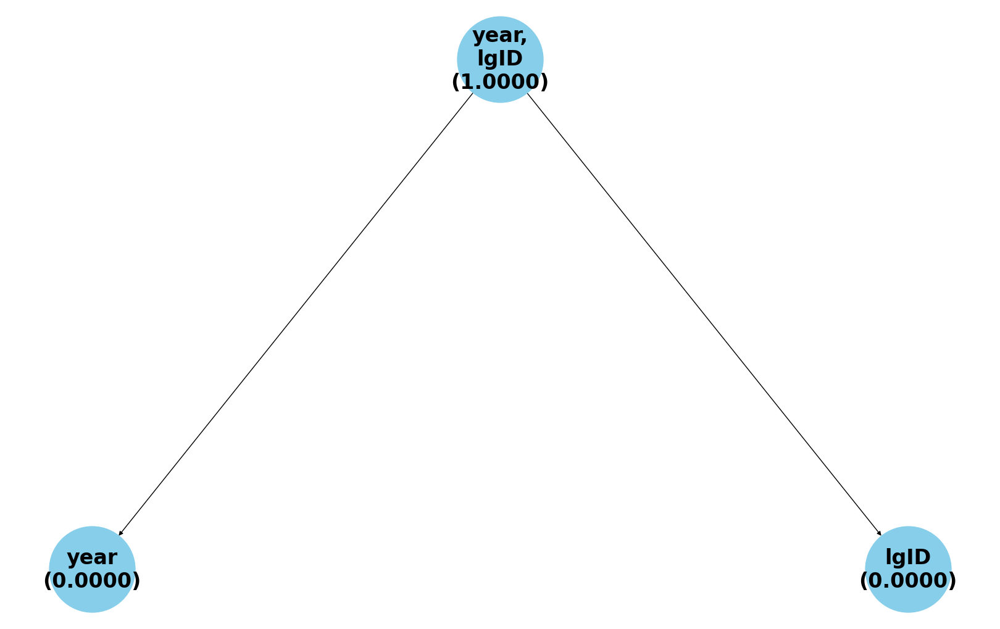

DFS subkey graph
{('year', 'lgID'): 1.0, ('year',): 0.0, ('lgID',): 0.0, 'φ': 0}
sub_ratio:  {('year', 'lgID'): 1.0, ('year',): 0.0, ('lgID',): 0.0}
grouped_sorted_data:  [[('year', 'lgID')], [('year',), ('lgID',)]]


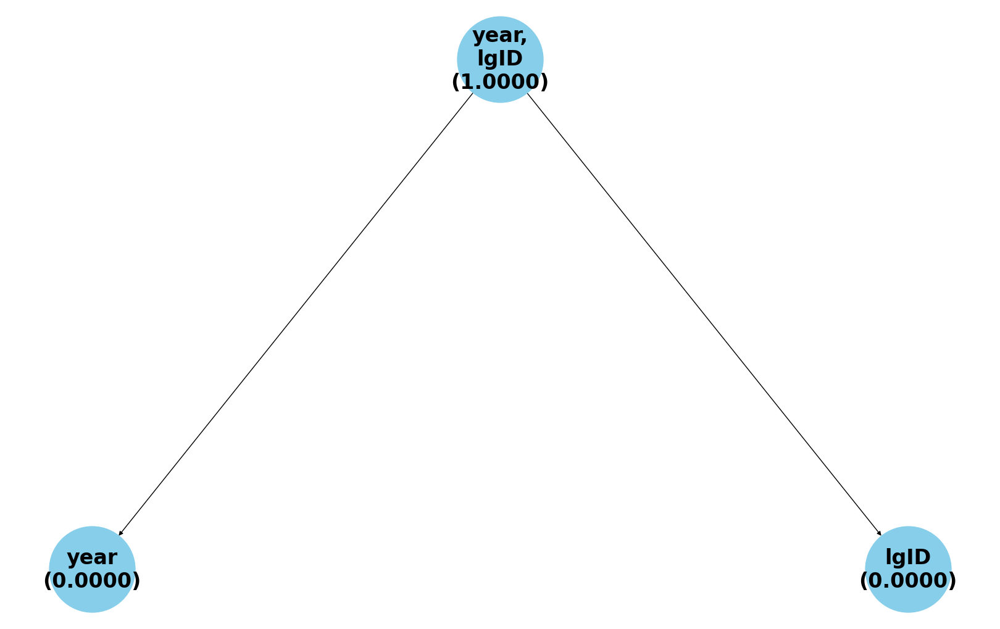

{2: 0.01, 1: 0.0030000000000000005}


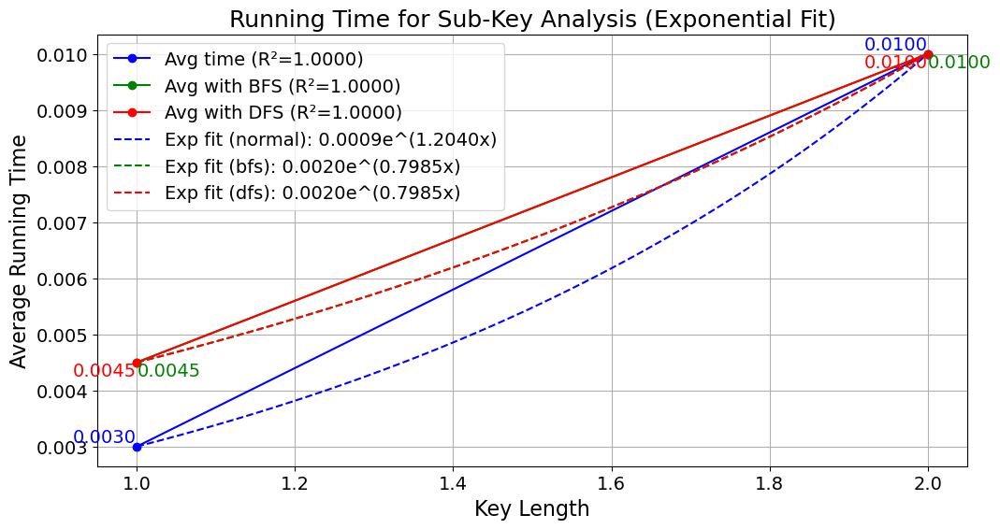

In [25]:
# TeamsSC  
near_key_list=[
    ('year', 'tmID'),
    ('year', 'lgID')
]
main('runTime_data/TeamsSC_data.csv', near_key_list)


Current column set: ('year', 'tmID', 'oppID'), Completeness Ratio: 1.0
Normal subkey graph


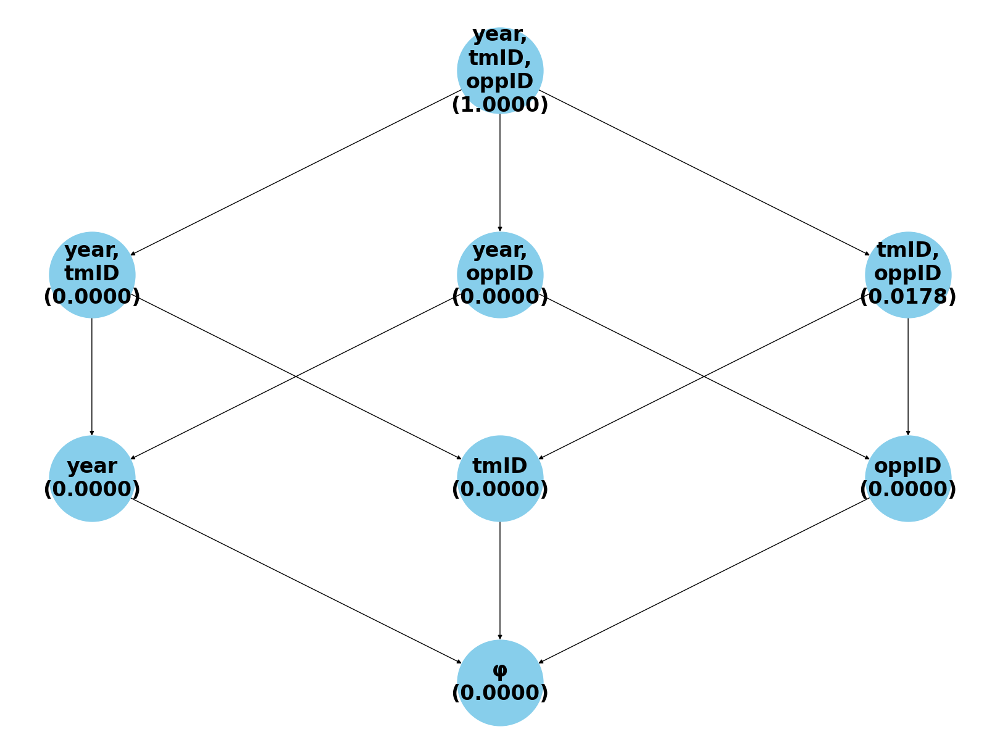

BFS subkey graph


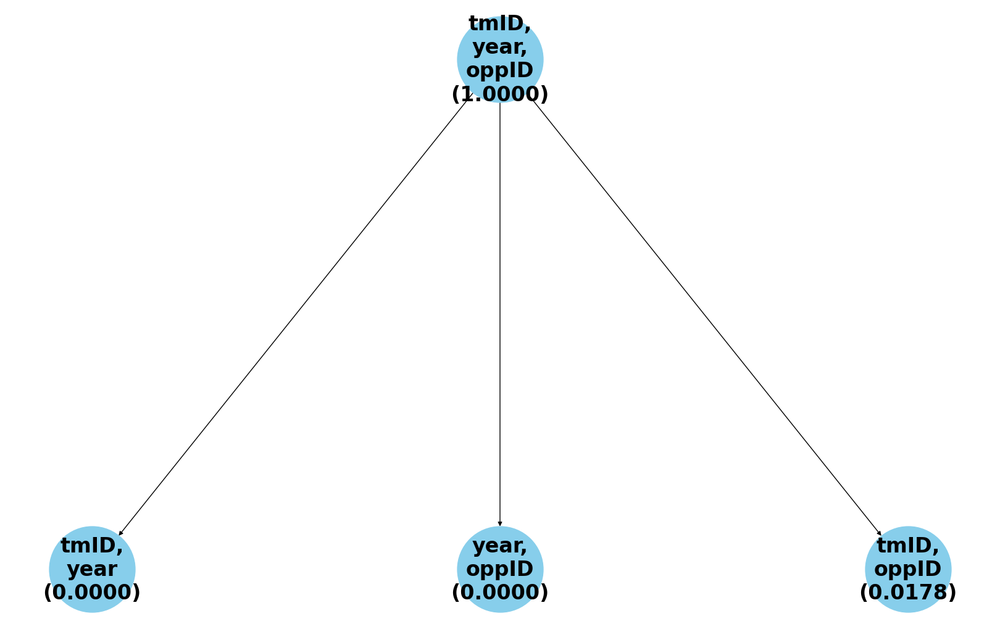

DFS subkey graph
{('year', 'tmID', 'oppID'): 1.0, ('year', 'tmID'): 0.0, ('year', 'oppID'): 0.0, ('tmID', 'oppID'): 0.0178, ('year',): 0.0, ('tmID',): 0.0, ('oppID',): 0.0, 'φ': 0}
sub_ratio:  {('year', 'tmID', 'oppID'): 1.0, ('year', 'tmID'): 0.0, ('year', 'oppID'): 0.0, ('tmID', 'oppID'): 0.0178}
grouped_sorted_data:  [[('year', 'tmID', 'oppID')], [('year', 'tmID'), ('year', 'oppID'), ('tmID', 'oppID')]]


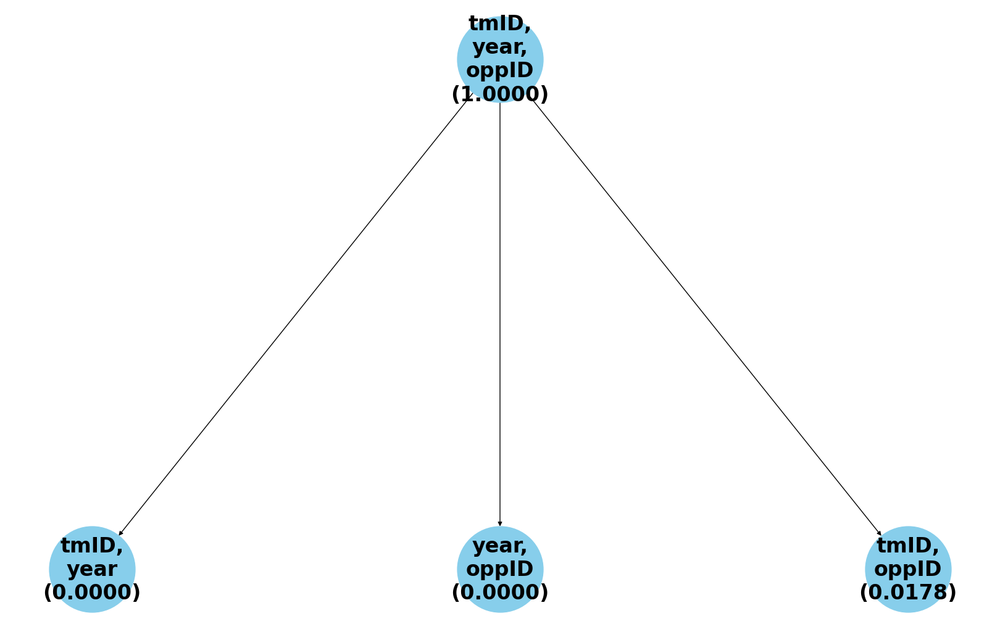

{3: 0.1295, 2: 0.05046666666666667, 1: 0.0112}


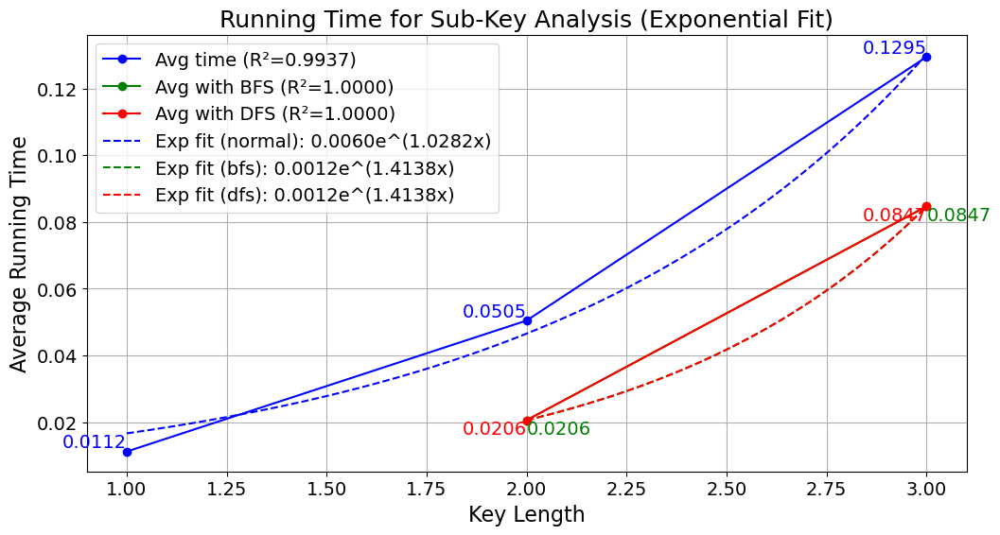

In [26]:
# TeamVsTeam  
near_key_list=[
    ('year', 'tmID', 'oppID')
]
main('runTime_data/TeamVsTeam_data.csv', near_key_list)

# Computational Limits Experiments


Current column set: ('year', 'month', 'date', 'oppID', 'R/P'), Completeness Ratio: 1.0
Normal subkey graph


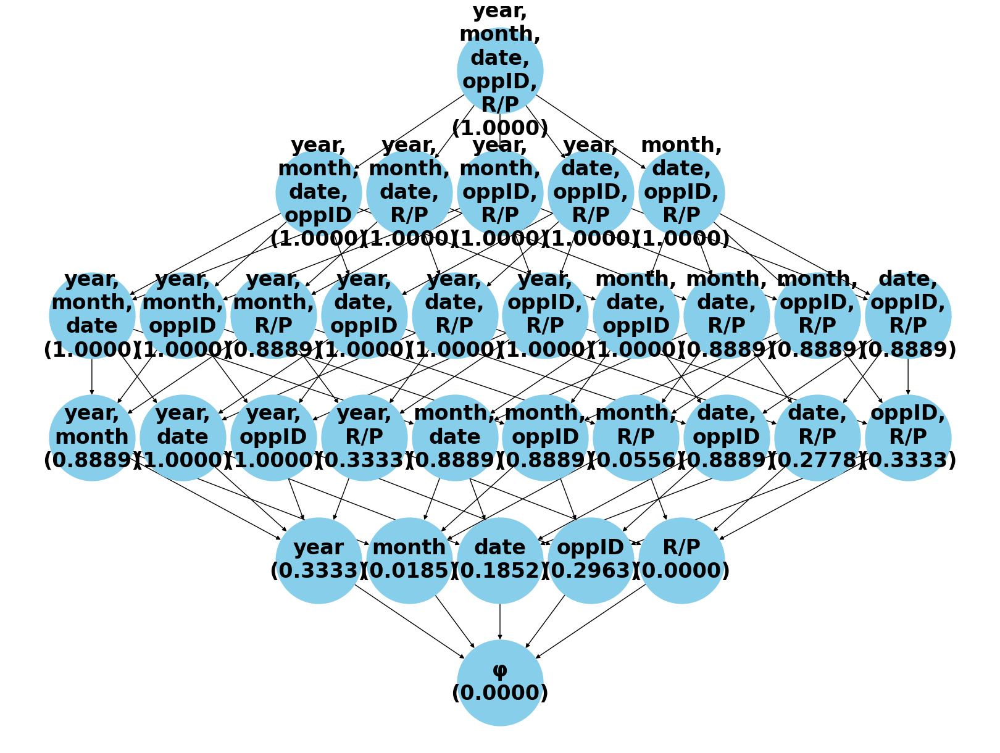

BFS subkey graph


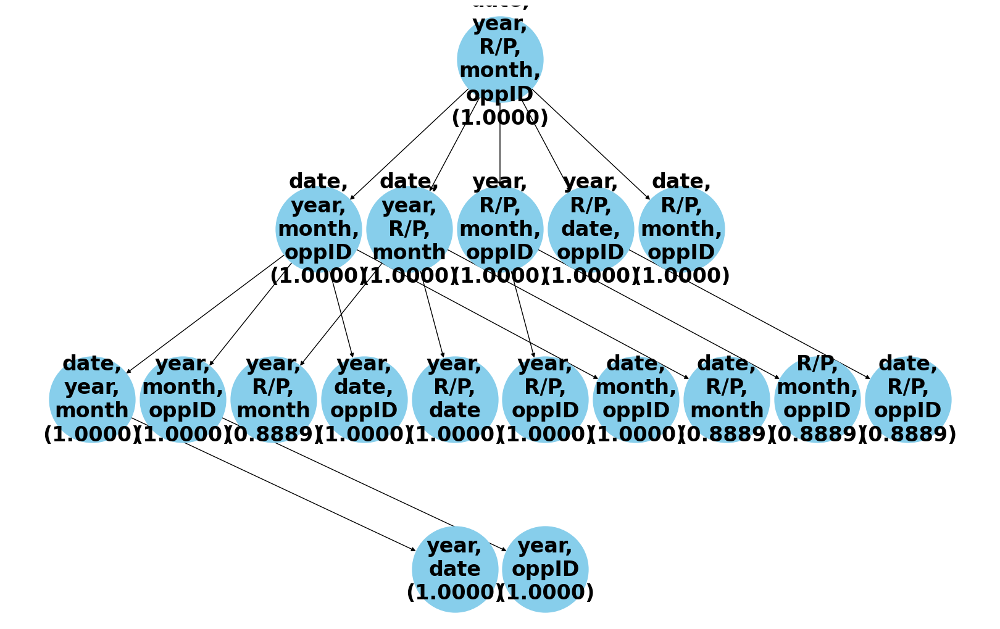

DFS subkey graph
{('year', 'month', 'date', 'oppID', 'R/P'): 1.0, ('year', 'month', 'date', 'oppID'): 1.0, ('year', 'month', 'date', 'R/P'): 1.0, ('year', 'month', 'oppID', 'R/P'): 1.0, ('year', 'date', 'oppID', 'R/P'): 1.0, ('month', 'date', 'oppID', 'R/P'): 1.0, ('year', 'month', 'date'): 1.0, ('year', 'month', 'oppID'): 1.0, ('year', 'month', 'R/P'): 0.8889, ('year', 'date', 'oppID'): 1.0, ('year', 'date', 'R/P'): 1.0, ('year', 'oppID', 'R/P'): 1.0, ('month', 'date', 'oppID'): 1.0, ('month', 'date', 'R/P'): 0.8889, ('month', 'oppID', 'R/P'): 0.8889, ('date', 'oppID', 'R/P'): 0.8889, ('year', 'month'): 0.8889, ('year', 'date'): 1.0, ('year', 'oppID'): 1.0, ('year', 'R/P'): 0.3333, ('month', 'date'): 0.8889, ('month', 'oppID'): 0.8889, ('month', 'R/P'): 0.0556, ('date', 'oppID'): 0.8889, ('date', 'R/P'): 0.2778, ('oppID', 'R/P'): 0.3333, ('year',): 0.3333, ('month',): 0.0185, ('date',): 0.1852, ('oppID',): 0.2963, ('R/P',): 0.0, 'φ': 0}
sub_ratio:  {('year', 'month', 'date', 'oppID', 

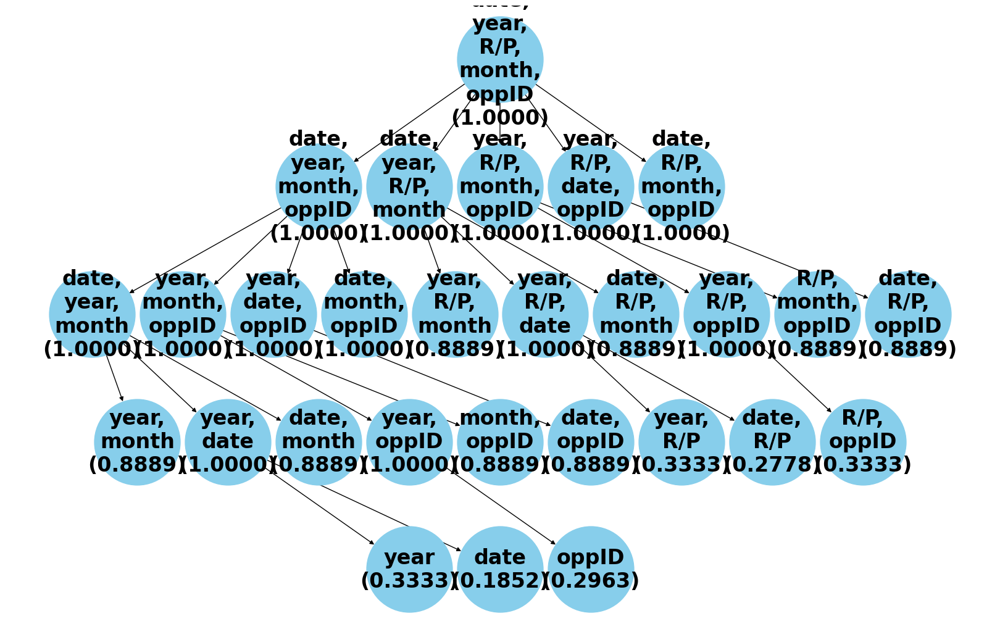

{5: 0.0241, 4: 0.015059999999999999, 3: 0.00953, 2: 0.005610000000000001, 1: 0.002166666666666667}


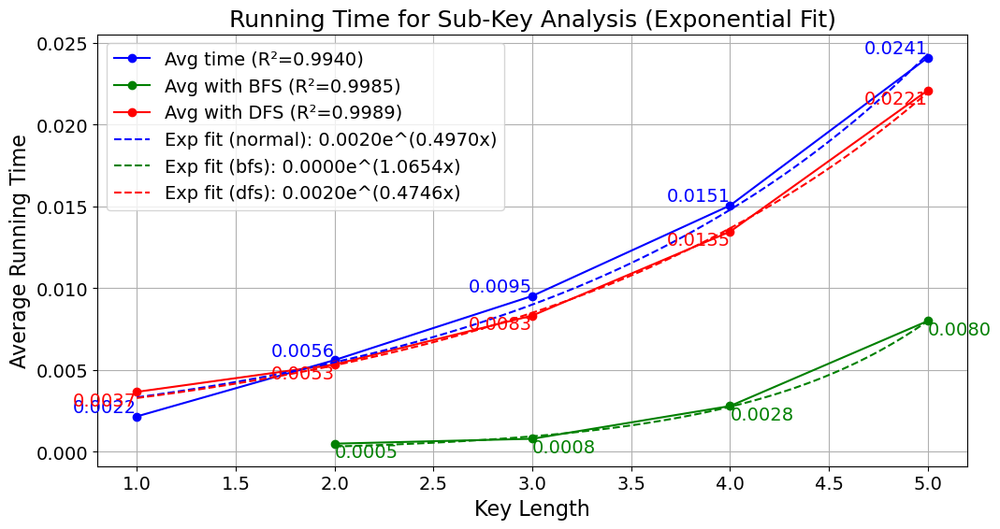


Current column set: ('year', 'month', 'date', 'oppID', 'R/P', 'IDgoalie2'), Completeness Ratio: 1.0
Normal subkey graph


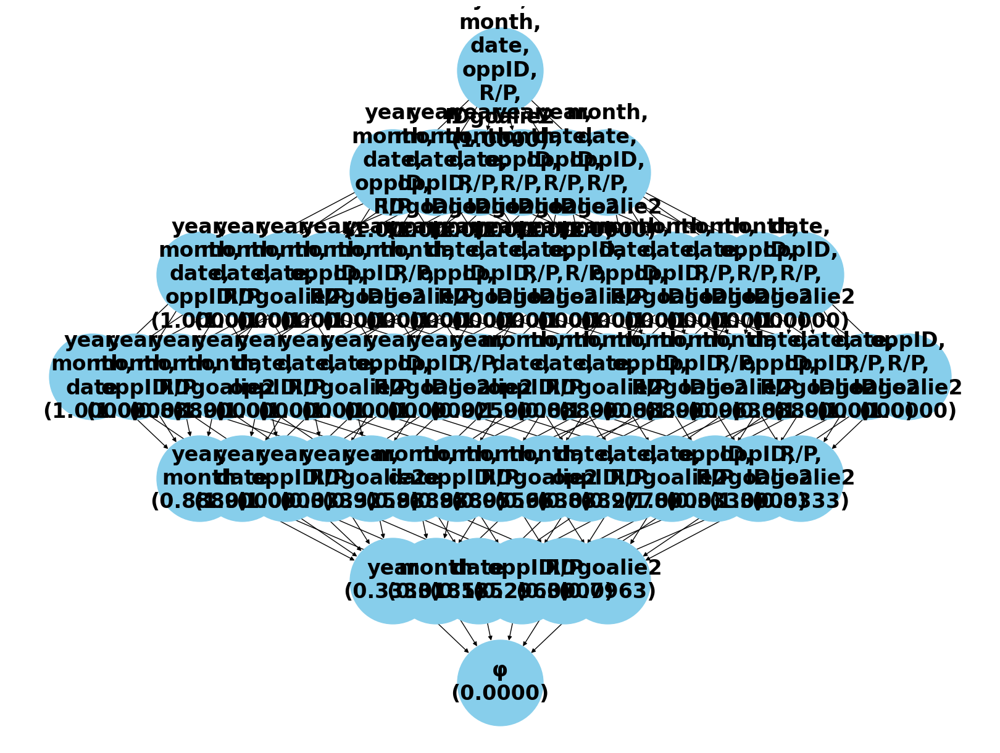

BFS subkey graph


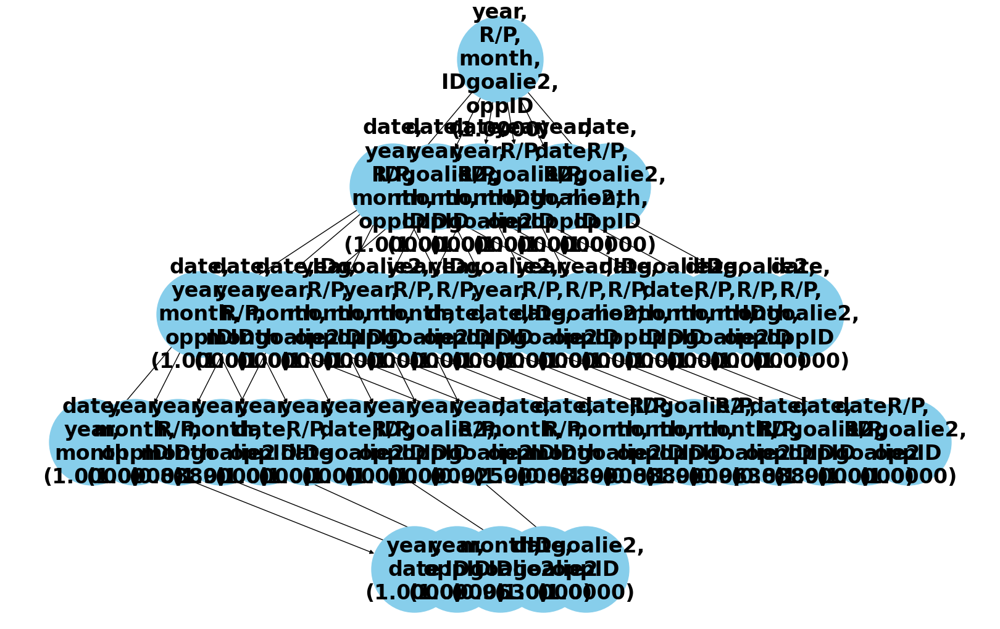

DFS subkey graph
{('year', 'month', 'date', 'oppID', 'R/P', 'IDgoalie2'): 1.0, ('year', 'month', 'date', 'oppID', 'R/P'): 1.0, ('year', 'month', 'date', 'oppID', 'IDgoalie2'): 1.0, ('year', 'month', 'date', 'R/P', 'IDgoalie2'): 1.0, ('year', 'month', 'oppID', 'R/P', 'IDgoalie2'): 1.0, ('year', 'date', 'oppID', 'R/P', 'IDgoalie2'): 1.0, ('month', 'date', 'oppID', 'R/P', 'IDgoalie2'): 1.0, ('year', 'month', 'date', 'oppID'): 1.0, ('year', 'month', 'date', 'R/P'): 1.0, ('year', 'month', 'date', 'IDgoalie2'): 1.0, ('year', 'month', 'oppID', 'R/P'): 1.0, ('year', 'month', 'oppID', 'IDgoalie2'): 1.0, ('year', 'month', 'R/P', 'IDgoalie2'): 1.0, ('year', 'date', 'oppID', 'R/P'): 1.0, ('year', 'date', 'oppID', 'IDgoalie2'): 1.0, ('year', 'date', 'R/P', 'IDgoalie2'): 1.0, ('year', 'oppID', 'R/P', 'IDgoalie2'): 1.0, ('month', 'date', 'oppID', 'R/P'): 1.0, ('month', 'date', 'oppID', 'IDgoalie2'): 1.0, ('month', 'date', 'R/P', 'IDgoalie2'): 1.0, ('month', 'oppID', 'R/P', 'IDgoalie2'): 1.0, ('date',

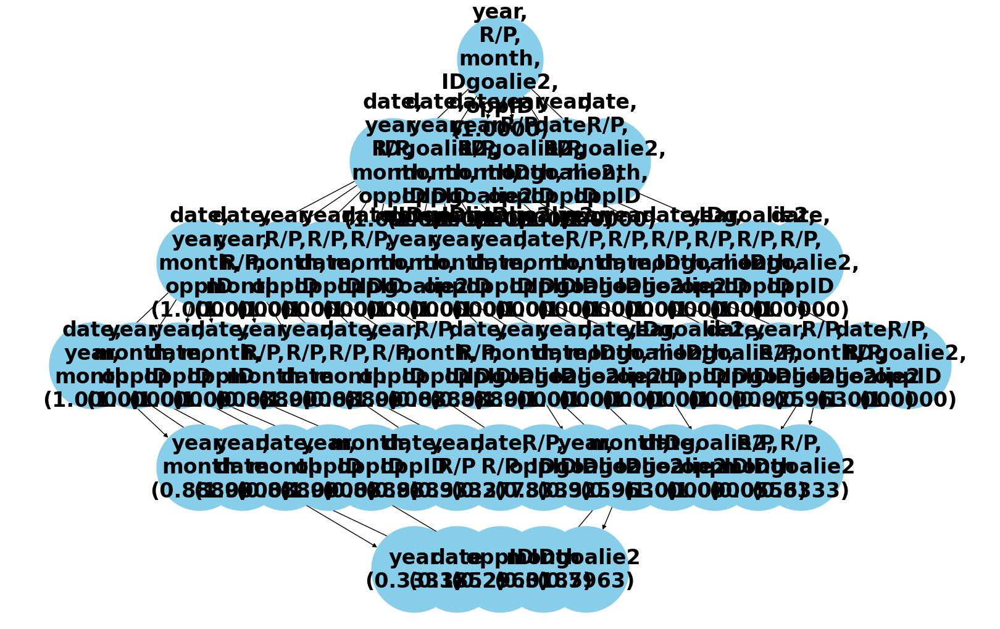

{6: 0.044, 5: 0.0252, 4: 0.014966666666666666, 3: 0.00897, 2: 0.005140000000000002, 1: 0.0020000000000000005}


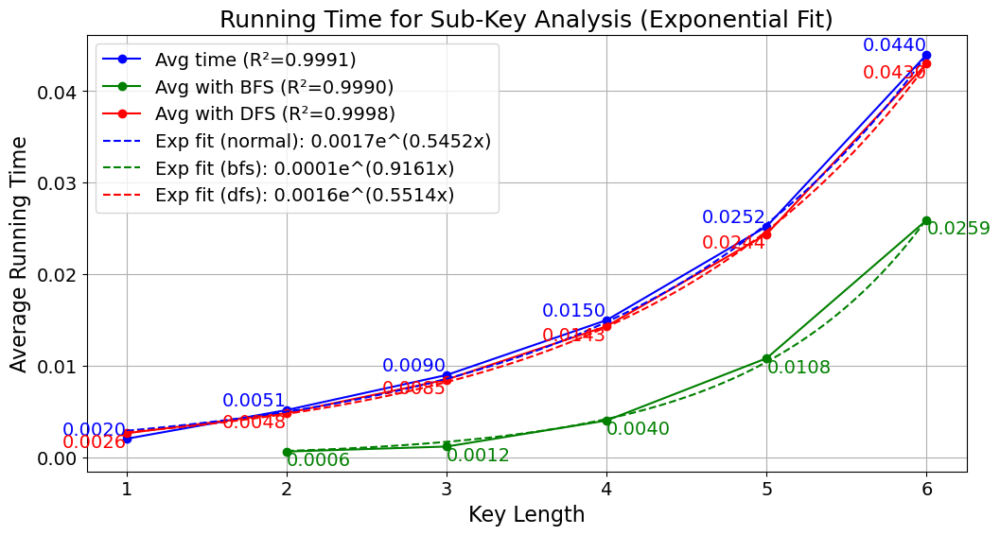


Current column set: ('month', 'date', 'tmID', 'oppID', 'R/P', 'IDgoalie1', 'IDgoalie2'), Completeness Ratio: 1.0
Normal subkey graph


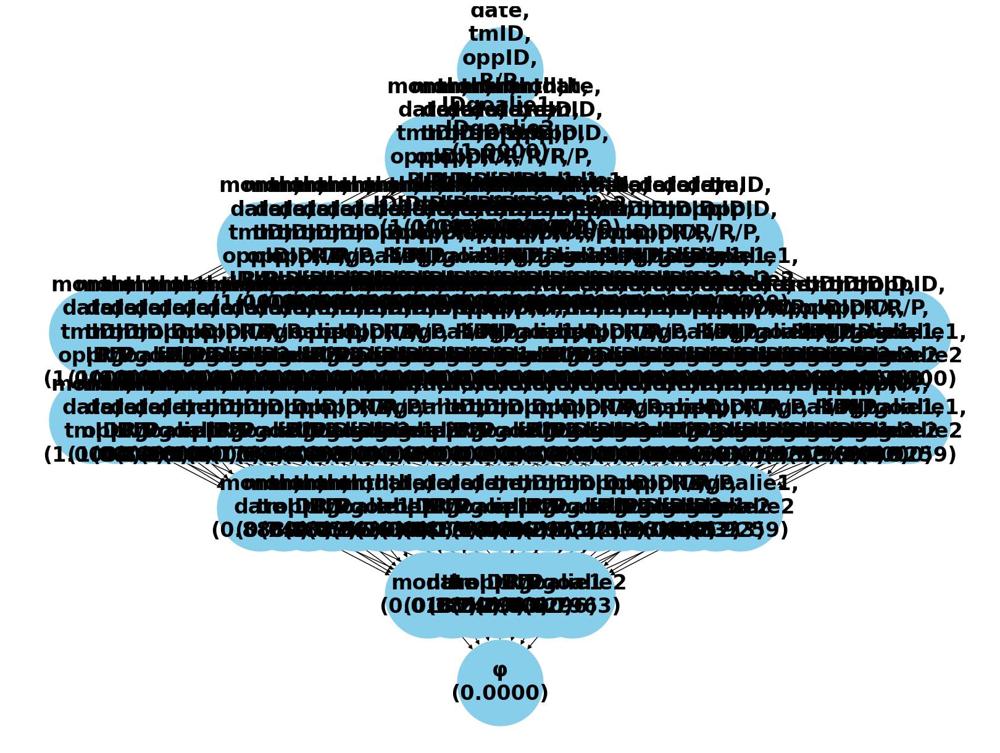

BFS subkey graph


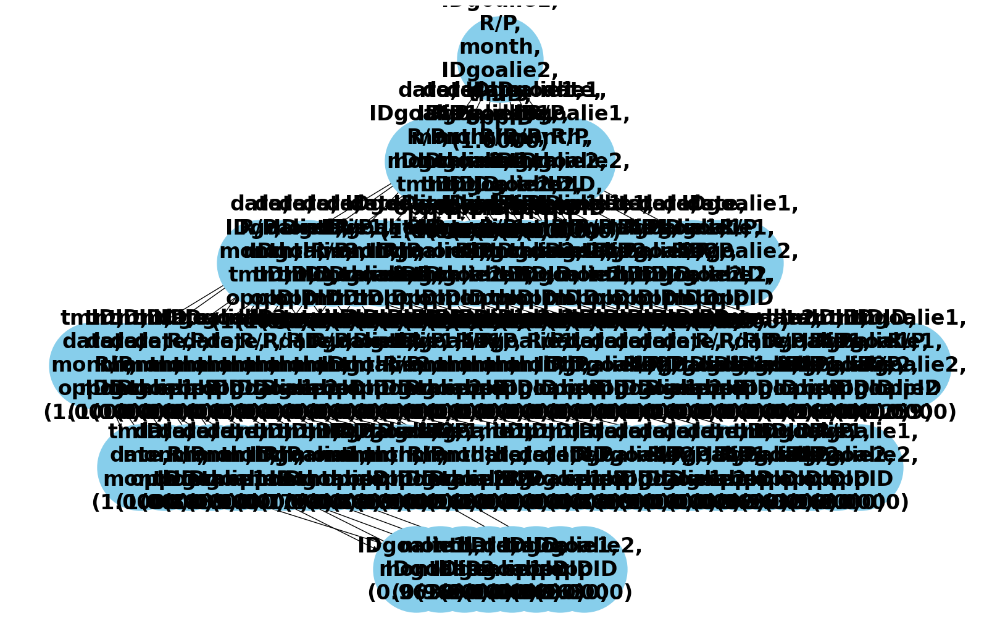

DFS subkey graph
{('month', 'date', 'tmID', 'oppID', 'R/P', 'IDgoalie1', 'IDgoalie2'): 1.0, ('month', 'date', 'tmID', 'oppID', 'R/P', 'IDgoalie1'): 1.0, ('month', 'date', 'tmID', 'oppID', 'R/P', 'IDgoalie2'): 1.0, ('month', 'date', 'tmID', 'oppID', 'IDgoalie1', 'IDgoalie2'): 1.0, ('month', 'date', 'tmID', 'R/P', 'IDgoalie1', 'IDgoalie2'): 1.0, ('month', 'date', 'oppID', 'R/P', 'IDgoalie1', 'IDgoalie2'): 1.0, ('month', 'tmID', 'oppID', 'R/P', 'IDgoalie1', 'IDgoalie2'): 1.0, ('date', 'tmID', 'oppID', 'R/P', 'IDgoalie1', 'IDgoalie2'): 1.0, ('month', 'date', 'tmID', 'oppID', 'R/P'): 1.0, ('month', 'date', 'tmID', 'oppID', 'IDgoalie1'): 1.0, ('month', 'date', 'tmID', 'oppID', 'IDgoalie2'): 1.0, ('month', 'date', 'tmID', 'R/P', 'IDgoalie1'): 1.0, ('month', 'date', 'tmID', 'R/P', 'IDgoalie2'): 1.0, ('month', 'date', 'tmID', 'IDgoalie1', 'IDgoalie2'): 1.0, ('month', 'date', 'oppID', 'R/P', 'IDgoalie1'): 1.0, ('month', 'date', 'oppID', 'R/P', 'IDgoalie2'): 1.0, ('month', 'date', 'oppID', 'IDgoa

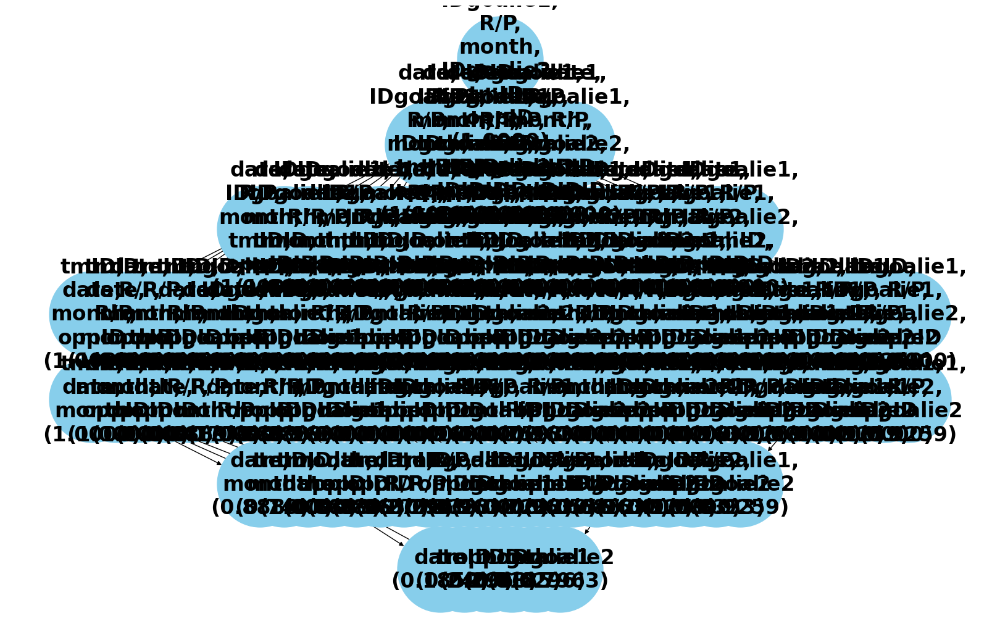

{7: 0.0769, 6: 0.03924285714285714, 5: 0.020271428571428576, 4: 0.010397142857142862, 3: 0.0052285714285714305, 2: 0.002523809523809524, 1: 0.000875}


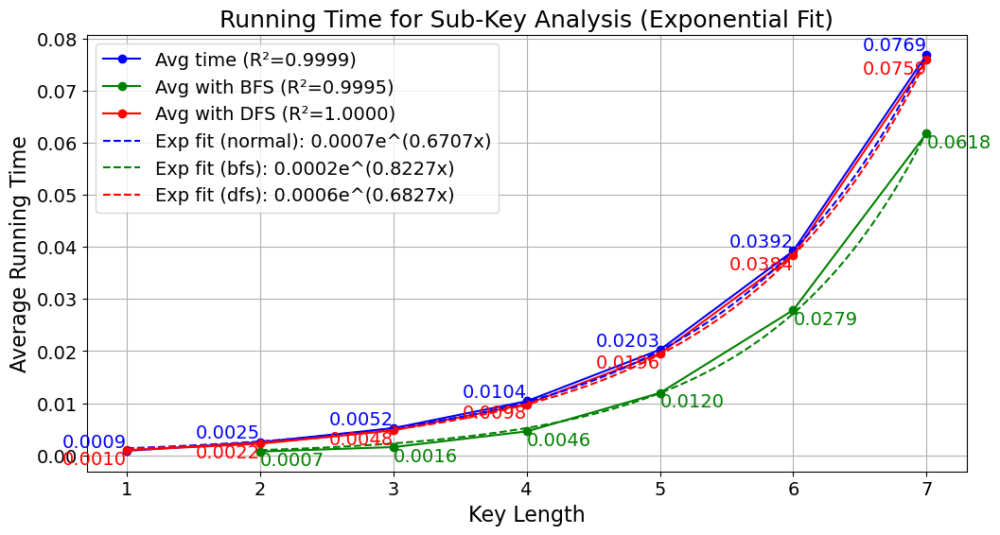

In [27]:
near_key_list=[
    ('year', 'month', 'date', 'oppID', 'R/P'),
    ('year', 'month', 'date', 'oppID', 'R/P', 'IDgoalie2'),
    ('month', 'date', 'tmID', 'oppID', 'R/P', 'IDgoalie1', 'IDgoalie2')
]
main('runTime_data/Combinedshutouts_data.csv', near_key_list)